In [1]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
from pathlib import Path
import os
import re
from typing import Dict, Tuple, Optional

# ============================================================================
# HELPER FUNCTIONS
# ============================================================================

def smooth_curve(x, y, window_size=5):
    """
    Smooth a curve using moving average (window averaging).
    
    window_size parameter (adjust for smoothness):
    - 3: Minimal smoothing (less averaging)
    - 5: Default (moderate smoothing)
    - 7-9: More smoothing
    - 11+: Heavy smoothing (very smooth)
    
    Larger window = smoother curve
    """
    if len(y) < window_size:
        return x, y
    
    try:
        # Apply moving average with centered window
        kernel = np.ones(window_size) / window_size
        # Pad the data for better edge handling
        y_padded = np.pad(y, (window_size//2, window_size//2), mode='edge')
        y_smooth = np.convolve(y_padded, kernel, mode='valid')
        
        return x, y_smooth
    except:
        return x, y

def find_seed_paths(base_pattern):
    """
    Find all seed directories matching the pattern.
    Returns a list of (seed_number, path) tuples sorted by seed.
    """
    base_dir = Path(base_pattern).parent
    pattern_name = Path(base_pattern).name
    
    # Convert glob pattern to regex
    regex_pattern = pattern_name.replace('*', '\\d+')
    regex = re.compile(f"^{regex_pattern}$")
    
    seed_paths = []
    
    if base_dir.exists():
        for item in base_dir.iterdir():
            if item.is_dir() and regex.match(item.name):
                # Extract seed number from directory name
                seed_match = re.search(r'(\d+)$', item.name)
                if seed_match:
                    seed_num = int(seed_match.group(1))
                    seed_paths.append((seed_num, item))
    
    # Sort by seed number
    seed_paths.sort(key=lambda x: x[0])
    return seed_paths

def find_metrics_file(seed_dir):
    """
    Find metrics.jsonl file in seed directory.
    Looks for metrics.jsonl in the directory or its subdirectories.
    """
    seed_path = Path(seed_dir)
    
    # Try direct metrics.jsonl
    direct_path = seed_path / 'metrics.jsonl'
    if direct_path.exists():
        return direct_path
    
    # Try searching in subdirectories
    for metrics_file in seed_path.rglob('metrics.jsonl'):
        return metrics_file
    
    return None

def aggregate_eval_metrics(jsonl_file, experiment_name, seed_num, remove_lowest=False):
    """
    Read JSONL file and aggregate eval scores into average and variance.
    
    Args:
        jsonl_file: Path to the metrics.jsonl file
        experiment_name: Name of the experiment
        seed_num: Seed number
        remove_lowest: If True, remove the lowest eval score from each step before aggregating
    
    Returns:
        DataFrame with aggregated metrics, or None if no valid data
    """
    print(f"  Processing seed {seed_num}..." + (" (removing lowest score)" if remove_lowest else ""))
    
    # Load all data
    data = []
    try:
        with open(jsonl_file, 'r') as f:
            for line in f:
                if line.strip():
                    data.append(json.loads(line))
    except FileNotFoundError:
        print(f"    ❌ File not found: {jsonl_file}")
        return None
    
    # Extract eval records (those with eval_return or mean_eval_success)
    eval_records = [d for d in data if 'eval_return' in d or 'mean_eval_success' in d]
    
    if not eval_records:
        print(f"    ❌ No eval records found")
        return None
    
    # Group eval records by step
    eval_by_step = defaultdict(list)
    for record in eval_records:
        step = record.get('step')
        if step is not None:
            eval_by_step[step].append(record)
    
    # Create aggregated dataset
    aggregated_data = []
    
    for step, eval_list in sorted(eval_by_step.items()):
        # Extract eval_return values (if present)
        eval_returns = [e['eval_return'] for e in eval_list if 'eval_return' in e]
        
        # Extract mean_eval_success values (if present)
        eval_successes = [e['mean_eval_success'] for e in eval_list if 'mean_eval_success' in e]
        
        # Process eval_return if available
        if eval_returns:
            # If remove_lowest is True and we have at least 2 evals, remove the lowest
            if remove_lowest and len(eval_returns) >= 2:
                min_idx = eval_returns.index(min(eval_returns))
                removed_lowest_score = min(eval_returns)
                eval_returns_filtered = [e for i, e in enumerate(eval_returns) if i != min_idx]
                num_evals_used = len(eval_returns_filtered)
            else:
                eval_returns_filtered = eval_returns
                removed_lowest_score = None
                num_evals_used = len(eval_returns)
            
            # Calculate mean and variance on (possibly filtered) scores
            avg_eval_return = np.mean(eval_returns_filtered)
            var_eval_return = np.var(eval_returns_filtered, ddof=1) if len(eval_returns_filtered) > 1 else 0
        else:
            avg_eval_return = None
            var_eval_return = None
            removed_lowest_score = None
            num_evals_used = 0
        
        # Process eval_success if available
        if eval_successes:
            avg_eval_success = np.mean(eval_successes)
        else:
            avg_eval_success = None
        
        aggregated_record = {
            'step': step,
            'seed': seed_num
        }
        
        # Add eval_return metrics if available
        if avg_eval_return is not None:
            aggregated_record['avg_eval_return'] = avg_eval_return
            aggregated_record['var_eval_return'] = var_eval_return
            aggregated_record['num_evals_used'] = num_evals_used
            if remove_lowest and removed_lowest_score is not None:
                aggregated_record['removed_lowest_score'] = removed_lowest_score
        
        # Add eval_success metric if available
        if avg_eval_success is not None:
            aggregated_record['mean_eval_success'] = avg_eval_success
        
        aggregated_data.append(aggregated_record)
    
    print(f"    ✓ Processed {len(aggregated_data)} evaluation steps")
    
    return pd.DataFrame(aggregated_data)

# ============================================================================
# MAIN ANALYSIS FUNCTION
# ============================================================================

def analyze_metrics(experiment_paths: Dict[str, str], 
                   output_dir: str = 'results',
                   smoothness: int = 5,
                   remove_lowest: bool = False) -> Dict[str, pd.DataFrame]:
    """
    Comprehensive metrics analysis pipeline.
    
    Args:
        experiment_paths: Dictionary mapping experiment names to path patterns
                         e.g., {'MoE': "/path/to/moe_seed*", 'Original': "/path/to/logs_seed*"}
        output_dir: Directory to save results (default: 'results')
        smoothness: Window size for moving average smoothing (default: 5)
                   - 3: Minimal smoothing
                   - 5: Default (moderate smoothing)
                   - 7-9: More smoothing
                   - 11+: Heavy smoothing
        remove_lowest: If True, remove lowest eval score per step (default: False)
    
    Returns:
        Dictionary of aggregated results {exp_name: aggregated_df}
    """
    
    print("="*70)
    print("MULTI-SEED EVALUATION METRICS AGGREGATOR")
    print("="*70)
    print(f"Mode: {'REMOVE LOWEST SCORE' if remove_lowest else 'KEEP ALL SCORES'}")
    print(f"Smoothness: {smoothness}")
    print("="*70)
    
    # Process all experiment categories and their seeds
    all_results = {}  # {exp_name: {seed: df, ...}, ...}
    
    for exp_name, base_pattern in experiment_paths.items():
        print(f"\n📊 Processing experiment: {exp_name}")
        print(f"   Pattern: {base_pattern}")
        
        seed_paths = find_seed_paths(base_pattern)
        
        if not seed_paths:
            print(f"   ⚠️  No seed directories found matching pattern!")
            continue
        
        print(f"   ✓ Found {len(seed_paths)} seed(s): {[s[0] for s in seed_paths]}")
        
        experiment_results = {}
        
        for seed_num, seed_dir in seed_paths:
            metrics_file = find_metrics_file(seed_dir)
            
            if metrics_file is None:
                print(f"  ❌ No metrics.jsonl found in {seed_dir}")
                continue
            
            df = aggregate_eval_metrics(metrics_file, exp_name, seed_num, remove_lowest=remove_lowest)
            
            if df is not None:
                experiment_results[seed_num] = df
        
        if experiment_results:
            all_results[exp_name] = experiment_results
            print(f"   ✓ Successfully processed {len(experiment_results)} seed(s)")
        else:
            print(f"   ❌ No valid seeds for {exp_name}")
    
    if not all_results:
        print("\n❌ No valid experiments to process!")
        return {}
    
    print(f"\n{'='*70}")
    print(f"✓ Successfully processed all experiments")
    print(f"{'='*70}\n")
    
    # ========================================================================
    # AGGREGATE ACROSS SEEDS FOR EACH EXPERIMENT
    # ========================================================================
    
    print("Aggregating metrics across seeds...\n")
    
    cross_seed_results = {}  # {exp_name: df_aggregated}
    
    for exp_name, seed_results in all_results.items():
        print(f"{exp_name}:")
        
        # Combine all seed data
        all_seed_dfs = list(seed_results.values())
        combined_df = pd.concat(all_seed_dfs, ignore_index=True)
        
        # Group by step and aggregate across seeds
        aggregated_by_step = []
        
        for step in sorted(combined_df['step'].unique()):
            step_data = combined_df[combined_df['step'] == step]
            
            aggregated_record = {
                'step': step,
                'num_seeds': len(step_data),
            }
            
            # Aggregate eval_return if available
            if 'avg_eval_return' in step_data.columns:
                eval_returns = step_data['avg_eval_return'].values
                aggregated_record['mean_eval_return'] = np.mean(eval_returns)
                aggregated_record['std_eval_return'] = np.std(eval_returns, ddof=1) if len(eval_returns) > 1 else 0
                aggregated_record['min_eval_return'] = np.min(eval_returns)
                aggregated_record['max_eval_return'] = np.max(eval_returns)
            
            # Aggregate mean_eval_success if available
            if 'mean_eval_success' in step_data.columns:
                eval_successes = step_data['mean_eval_success'].values
                aggregated_record['mean_eval_success'] = np.mean(eval_successes)
                aggregated_record['std_eval_success'] = np.std(eval_successes, ddof=1) if len(eval_successes) > 1 else 0
                aggregated_record['min_eval_success'] = np.min(eval_successes)
                aggregated_record['max_eval_success'] = np.max(eval_successes)
            
            aggregated_by_step.append(aggregated_record)
        
        df_agg = pd.DataFrame(aggregated_by_step)
        cross_seed_results[exp_name] = df_agg
        
        print(f"  - Seeds processed: {len(seed_results)}")
        print(f"  - Evaluation steps: {len(df_agg)}")
        if 'mean_eval_return' in df_agg.columns:
            print(f"  - Final mean_eval_return: {df_agg['mean_eval_return'].iloc[-1]:.2f} ± {df_agg['std_eval_return'].iloc[-1]:.2f}")
        if 'mean_eval_success' in df_agg.columns:
            print(f"  - Final mean_eval_success: {df_agg['mean_eval_success'].iloc[-1]:.4f} ± {df_agg['std_eval_success'].iloc[-1]:.4f}")
        print()
    
    # ========================================================================
    # SAVE AGGREGATED RESULTS
    # ========================================================================
    
    results_path = Path(output_dir)
    results_path.mkdir(parents=True, exist_ok=True)
    
    # Add mode suffix to output files
    mode_suffix = "_remove_lowest" if remove_lowest else "_all_scores"
    
    print("Saving aggregated results...\n")
    
    for exp_name, df_agg in cross_seed_results.items():
        # Save CSV
        csv_path = results_path / f'{exp_name}_cross_seed_aggregated{mode_suffix}.csv'
        df_agg.to_csv(csv_path, index=False)
        print(f"  ✓ {exp_name} CSV: {csv_path}")
        
        # Save JSONL
        jsonl_path = results_path / f'{exp_name}_cross_seed_aggregated{mode_suffix}.jsonl'
        with open(jsonl_path, 'w') as f:
            for _, record in df_agg.iterrows():
                f.write(json.dumps(record.to_dict()) + '\n')
        print(f"  ✓ {exp_name} JSONL: {jsonl_path}")
    
    # Also save individual seed results for reference
    print()
    for exp_name, seed_results in all_results.items():
        exp_dir = results_path / (exp_name + mode_suffix)
        exp_dir.mkdir(parents=True, exist_ok=True)
        
        for seed_num, df in seed_results.items():
            seed_csv_path = exp_dir / f'seed_{seed_num}_metrics.csv'
            df.to_csv(seed_csv_path, index=False)
        
        print(f"  ✓ {exp_name} individual seed results saved to {exp_dir}/")
    
    # ========================================================================
    # PLOTTING - COMPARISON ACROSS EXPERIMENTS
    # ========================================================================
    
    print("\n" + "="*70)
    print("GENERATING PLOTS")
    print("="*70 + "\n")
    
    # Plot 1: Eval return with error bands (mean ± std across seeds)
    if any('mean_eval_return' in df.columns for df in cross_seed_results.values()):
        fig, ax = plt.subplots(figsize=(12, 7))
        
        colors = plt.cm.Set2(range(len(cross_seed_results)))
        
        for (exp_name, df_agg), color in zip(cross_seed_results.items(), colors):
            if 'mean_eval_return' in df_agg.columns:
                # Convert to numpy arrays for plotting
                step = df_agg['step'].values
                mean_return = df_agg['mean_eval_return'].values
                std_return = df_agg['std_eval_return'].values
                
                # Apply moving average smoothing to both mean and std
                step_smooth, mean_smooth = smooth_curve(step, mean_return, window_size=smoothness)
                _, std_smooth = smooth_curve(step, std_return, window_size=smoothness)
                
                # Plot mean line (smooth)
                ax.plot(step_smooth, mean_smooth, 
                        label=exp_name, color=color, linewidth=2.5)
                
                # Plot original points as markers
                ax.scatter(step, mean_return, color=color, s=50, zorder=5, alpha=0.6)
                
                # Add shaded error region (±1 std) - use smoothed std
                ax.fill_between(step_smooth, 
                                 mean_smooth - std_smooth,
                                 mean_smooth + std_smooth,
                                 color=color, alpha=0.2)
        
        ax.set_xlabel('Step', fontsize=13, fontweight='bold')
        ax.set_ylabel('Average Eval Return', fontsize=13, fontweight='bold')
        ax.set_title('Eval Return Over Time (Aggregated Across Seeds, ±1 Std Dev)', 
                     fontsize=14, fontweight='bold')
        ax.legend(fontsize=12, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        plot_path_1 = results_path / f'cross_seed_eval_return_comparison{mode_suffix}.png'
        plt.savefig(plot_path_1, dpi=300, bbox_inches='tight')
        print(f"✓ Saved plot: {plot_path_1}")
        plt.show()
        plt.close()
    
    # Plot 2: Individual seed runs (separate subplots or overlaid)
    fig, axes = plt.subplots(1, len(all_results), figsize=(6*len(all_results), 5), sharey=True)
    
    if len(all_results) == 1:
        axes = [axes]
    
    for (exp_name, seed_results), ax in zip(all_results.items(), axes):
        
        # Plot each seed (smooth with moving average)
        for seed_num, df in seed_results.items():
            if 'avg_eval_return' in df.columns:
                step = df['step'].values
                avg_return = df['avg_eval_return'].values
                
                # Apply moving average smoothing
                step_smooth, avg_smooth = smooth_curve(step, avg_return, window_size=smoothness)
                ax.plot(step_smooth, avg_smooth, 
                        label=f'seed_{seed_num}', alpha=0.6, linewidth=1.5)
                ax.scatter(step, avg_return, alpha=0.4, s=30)
        
        # Plot mean across seeds (smooth and bold)
        if 'mean_eval_return' in cross_seed_results[exp_name].columns:
            df_mean = cross_seed_results[exp_name]
            step_mean = df_mean['step'].values
            mean_return = df_mean['mean_eval_return'].values
            step_mean_smooth, mean_smooth = smooth_curve(step_mean, mean_return, window_size=smoothness)
            ax.plot(step_mean_smooth, mean_smooth, 
                    label='Mean', color='black', linewidth=3)
            ax.scatter(step_mean, mean_return, color='black', s=100, marker='s', zorder=10, alpha=0.7)
        
        ax.set_xlabel('Step', fontsize=12, fontweight='bold')
        ax.set_ylabel('Avg Eval Return', fontsize=12, fontweight='bold')
        ax.set_title(exp_name, fontsize=13, fontweight='bold')
        ax.legend(fontsize=10)
        ax.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plot_path_2 = results_path / f'individual_seeds_comparison{mode_suffix}.png'
    plt.savefig(plot_path_2, dpi=300, bbox_inches='tight')
    print(f"✓ Saved plot: {plot_path_2}")
    plt.show()
    plt.close()
    
    # Plot 3: Mean eval success across experiments (with error bands)
    if any('mean_eval_success' in df.columns for df in cross_seed_results.values()):
        fig, ax = plt.subplots(figsize=(12, 7))
        
        colors = plt.cm.Set2(range(len(cross_seed_results)))
        
        for (exp_name, df_agg), color in zip(cross_seed_results.items(), colors):
            if 'mean_eval_success' in df_agg.columns:
                step = df_agg['step'].values
                mean_success = df_agg['mean_eval_success'].values
                std_success = df_agg['std_eval_success'].values
                
                # Apply moving average smoothing
                step_smooth, success_smooth = smooth_curve(step, mean_success, window_size=smoothness)
                _, std_smooth = smooth_curve(step, std_success, window_size=smoothness)
                
                # Plot mean line (smooth)
                ax.plot(step_smooth, success_smooth, 
                        label=exp_name, color=color, linewidth=2.5)
                
                # Plot original points as markers
                ax.scatter(step, mean_success, color=color, s=50, zorder=5, alpha=0.6)
                
                # Add shaded error region (±1 std)
                ax.fill_between(step_smooth, 
                                 success_smooth - std_smooth,
                                 success_smooth + std_smooth,
                                 color=color, alpha=0.2)
        
        ax.set_xlabel('Step', fontsize=13, fontweight='bold')
        ax.set_ylabel('Mean Eval Success', fontsize=13, fontweight='bold')
        ax.set_title('Eval Success Over Time (Aggregated Across Seeds, ±1 Std Dev)', 
                     fontsize=14, fontweight='bold')
        ax.legend(fontsize=12, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        ax.set_ylim([0, 1.05])  # Success is typically 0-1
        
        plt.tight_layout()
        plot_path_3 = results_path / f'cross_seed_eval_success_comparison{mode_suffix}.png'
        plt.savefig(plot_path_3, dpi=300, bbox_inches='tight')
        print(f"✓ Saved plot: {plot_path_3}")
        plt.show()
        plt.close()
    
    # Plot 4: Individual seed runs for success (if available)
    if any('mean_eval_success' in seed_results[seed_num].columns 
           for seed_results in all_results.values() 
           for seed_num in seed_results.keys()):
        fig, axes = plt.subplots(1, len(all_results), figsize=(6*len(all_results), 5), sharey=True)
        
        if len(all_results) == 1:
            axes = [axes]
        
        for (exp_name, seed_results), ax in zip(all_results.items(), axes):
            
            # Plot each seed (smooth with moving average)
            for seed_num, df in seed_results.items():
                if 'mean_eval_success' in df.columns:
                    step = df['step'].values
                    success = df['mean_eval_success'].values
                    
                    # Apply moving average smoothing
                    step_smooth, success_smooth = smooth_curve(step, success, window_size=smoothness)
                    ax.plot(step_smooth, success_smooth, 
                            label=f'seed_{seed_num}', alpha=0.6, linewidth=1.5)
                    ax.scatter(step, success, alpha=0.4, s=30)
            
            # Plot mean across seeds (smooth and bold)
            if 'mean_eval_success' in cross_seed_results[exp_name].columns:
                df_mean = cross_seed_results[exp_name]
                step_mean = df_mean['step'].values
                mean_success = df_mean['mean_eval_success'].values
                step_mean_smooth, success_smooth = smooth_curve(step_mean, mean_success, window_size=smoothness)
                ax.plot(step_mean_smooth, success_smooth, 
                        label='Mean', color='black', linewidth=3)
                ax.scatter(step_mean, mean_success, color='black', s=100, marker='s', zorder=10, alpha=0.7)
            
            ax.set_xlabel('Step', fontsize=12, fontweight='bold')
            ax.set_ylabel('Mean Eval Success', fontsize=12, fontweight='bold')
            ax.set_title(f'{exp_name} - Success Rates', fontsize=13, fontweight='bold')
            ax.legend(fontsize=10)
            ax.grid(True, alpha=0.3)
            ax.set_ylim([0, 1.05])
        
        plt.tight_layout()
        plot_path_4 = results_path / f'individual_seeds_success_comparison{mode_suffix}.png'
        plt.savefig(plot_path_4, dpi=300, bbox_inches='tight')
        print(f"✓ Saved plot: {plot_path_4}")
        plt.show()
        plt.close()
    
    # Plot 5: Variance trend for eval return (std dev across seeds over time)
    if any('std_eval_return' in df.columns for df in cross_seed_results.values()):
        fig, ax = plt.subplots(figsize=(12, 7))
        
        colors = plt.cm.Set2(range(len(cross_seed_results)))
        
        for (exp_name, df_agg), color in zip(cross_seed_results.items(), colors):
            if 'std_eval_return' in df_agg.columns:
                step = df_agg['step'].values
                std_return = df_agg['std_eval_return'].values
                
                # Apply moving average smoothing to std
                step_smooth, std_smooth = smooth_curve(step, std_return, window_size=smoothness)
                
                # Plot std line (smooth)
                ax.plot(step_smooth, std_smooth, 
                        label=exp_name, color=color, linewidth=2.5, marker='o', markersize=6)
                
                # Plot original points
                ax.scatter(step, std_return, color=color, s=50, zorder=5, alpha=0.6)
        
        ax.set_xlabel('Step', fontsize=13, fontweight='bold')
        ax.set_ylabel('Std Dev of Eval Return (Across Seeds)', fontsize=13, fontweight='bold')
        ax.set_title('Eval Return Variance Trend Over Time (±1 Std Dev Across Seeds)', 
                     fontsize=14, fontweight='bold')
        ax.legend(fontsize=12, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        plot_path_variance_return = results_path / f'variance_trend_eval_return{mode_suffix}.png'
        plt.savefig(plot_path_variance_return, dpi=300, bbox_inches='tight')
        print(f"✓ Saved plot: {plot_path_variance_return}")
        plt.show()
        plt.close()
    
    # Plot 6: Variance trend for success rate (std dev across seeds over time)
    if any('std_eval_success' in df.columns for df in cross_seed_results.values()):
        fig, ax = plt.subplots(figsize=(12, 7))
        
        colors = plt.cm.Set2(range(len(cross_seed_results)))
        
        for (exp_name, df_agg), color in zip(cross_seed_results.items(), colors):
            if 'std_eval_success' in df_agg.columns:
                step = df_agg['step'].values
                std_success = df_agg['std_eval_success'].values
                
                # Apply moving average smoothing to std
                step_smooth, std_smooth = smooth_curve(step, std_success, window_size=smoothness)
                
                # Plot std line (smooth)
                ax.plot(step_smooth, std_smooth, 
                        label=exp_name, color=color, linewidth=2.5, marker='s', markersize=6)
                
                # Plot original points
                ax.scatter(step, std_success, color=color, s=50, zorder=5, alpha=0.6)
        
        ax.set_xlabel('Step', fontsize=13, fontweight='bold')
        ax.set_ylabel('Std Dev of Eval Success (Across Seeds)', fontsize=13, fontweight='bold')
        ax.set_title('Eval Success Variance Trend Over Time (±1 Std Dev Across Seeds)', 
                     fontsize=14, fontweight='bold')
        ax.legend(fontsize=12, loc='best')
        ax.grid(True, alpha=0.3, linestyle='--')
        
        plt.tight_layout()
        plot_path_variance_success = results_path / f'variance_trend_eval_success{mode_suffix}.png'
        plt.savefig(plot_path_variance_success, dpi=300, bbox_inches='tight')
        print(f"✓ Saved plot: {plot_path_variance_success}")
        plt.show()
        plt.close()
    
    # Plot 7: Combined variance comparison (eval return vs success rate)
    if (any('std_eval_return' in df.columns for df in cross_seed_results.values()) and
        any('std_eval_success' in df.columns for df in cross_seed_results.values())):
        
        fig, axes = plt.subplots(1, 2, figsize=(16, 6))
        colors = plt.cm.Set2(range(len(cross_seed_results)))
        
        # Left plot: Eval Return Variance
        ax = axes[0]
        for (exp_name, df_agg), color in zip(cross_seed_results.items(), colors):
            if 'std_eval_return' in df_agg.columns:
                step = df_agg['step'].values
                std_return = df_agg['std_eval_return'].values
                step_smooth, std_smooth = smooth_curve(step, std_return, window_size=smoothness)
                ax.plot(step_smooth, std_smooth, label=exp_name, color=color, linewidth=2.5, marker='o')
                ax.scatter(step, std_return, color=color, s=50, zorder=5, alpha=0.6)
        
        ax.set_xlabel('Step', fontsize=12, fontweight='bold')
        ax.set_ylabel('Std Dev', fontsize=12, fontweight='bold')
        ax.set_title('Eval Return Variance', fontsize=13, fontweight='bold')
        ax.legend(fontsize=11)
        ax.grid(True, alpha=0.3)
        
        # Right plot: Success Rate Variance
        ax = axes[1]
        for (exp_name, df_agg), color in zip(cross_seed_results.items(), colors):
            if 'std_eval_success' in df_agg.columns:
                step = df_agg['step'].values
                std_success = df_agg['std_eval_success'].values
                step_smooth, std_smooth = smooth_curve(step, std_success, window_size=smoothness)
                ax.plot(step_smooth, std_smooth, label=exp_name, color=color, linewidth=2.5, marker='s')
                ax.scatter(step, std_success, color=color, s=50, zorder=5, alpha=0.6)
        
        ax.set_xlabel('Step', fontsize=12, fontweight='bold')
        ax.set_ylabel('Std Dev', fontsize=12, fontweight='bold')
        ax.set_title('Eval Success Variance', fontsize=13, fontweight='bold')
        ax.legend(fontsize=11)
        ax.grid(True, alpha=0.3)
        
        plt.tight_layout()
        plot_path_variance_combined = results_path / f'variance_trend_combined{mode_suffix}.png'
        plt.savefig(plot_path_variance_combined, dpi=300, bbox_inches='tight')
        print(f"✓ Saved plot: {plot_path_variance_combined}")
        plt.show()
        plt.close()
    
    # ========================================================================
    # SUMMARY STATISTICS
    # ========================================================================
    
    print("\n" + "="*70)
    print("SUMMARY STATISTICS (Aggregated Across Seeds)")
    print("="*70)
    
    for exp_name, df_agg in cross_seed_results.items():
        print(f"\n{exp_name}:")
        print(f"  - Number of seeds: {df_agg['num_seeds'].iloc[0]}")
        print(f"  - Number of evaluation steps: {len(df_agg)}")
        if 'mean_eval_return' in df_agg.columns:
            print(f"  - Final mean_eval_return: {df_agg['mean_eval_return'].iloc[-1]:.4f}")
            print(f"  - Final std_eval_return: {df_agg['std_eval_return'].iloc[-1]:.4f}")
            print(f"  - Max mean_eval_return: {df_agg['mean_eval_return'].max():.4f}")
            print(f"  - Min mean_eval_return: {df_agg['mean_eval_return'].min():.4f}")
            print(f"  - Overall mean_eval_return: {df_agg['mean_eval_return'].mean():.4f}")
        if 'mean_eval_success' in df_agg.columns:
            print(f"  - Final mean_eval_success: {df_agg['mean_eval_success'].iloc[-1]:.4f}")
            print(f"  - Final std_eval_success: {df_agg['std_eval_success'].iloc[-1]:.4f}")
            print(f"  - Max mean_eval_success: {df_agg['mean_eval_success'].max():.4f}")
            print(f"  - Min mean_eval_success: {df_agg['mean_eval_success'].min():.4f}")
            print(f"  - Overall mean_eval_success: {df_agg['mean_eval_success'].mean():.4f}")
    
    print("\n" + "="*70)
    print("✓ All processing complete!")
    print("="*70)
    
    return cross_seed_results

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: KEEP ALL SCORES
Smoothness: 5

📊 Processing experiment: 10_top50_novae_1_conditional
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Processing seed 2024...
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 5 seed(s)

📊 Processing experiment: 10_top50_novae_1_conditional_og
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation st

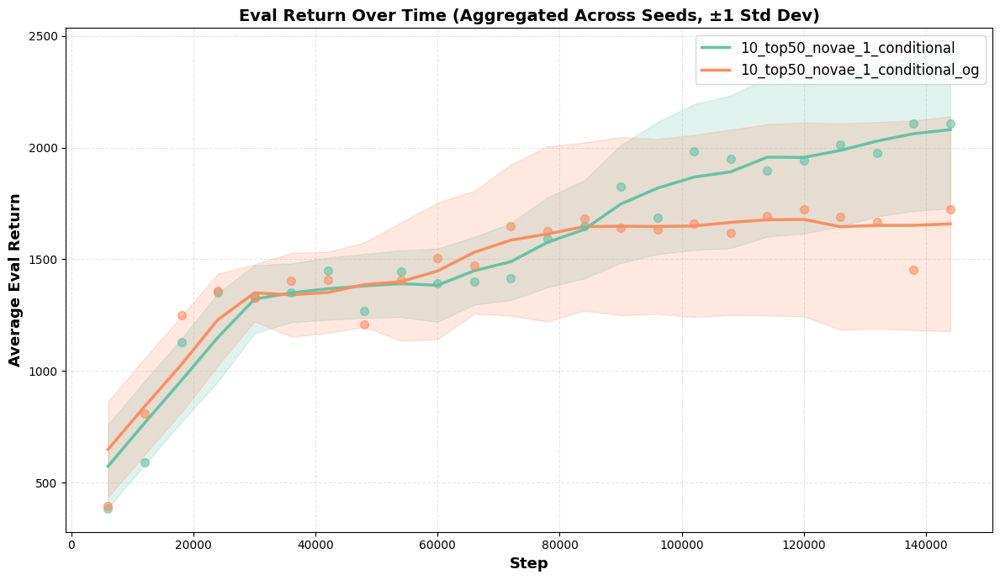

✓ Saved plot: results/individual_seeds_comparison_all_scores.png


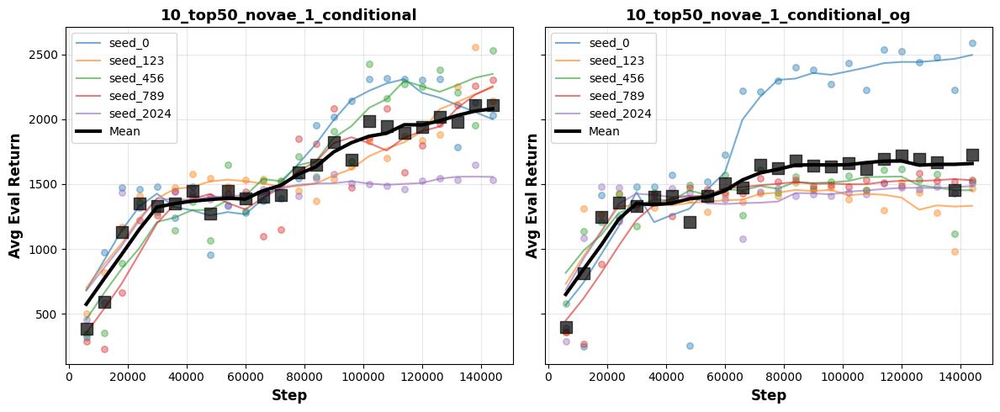

✓ Saved plot: results/cross_seed_eval_success_comparison_all_scores.png


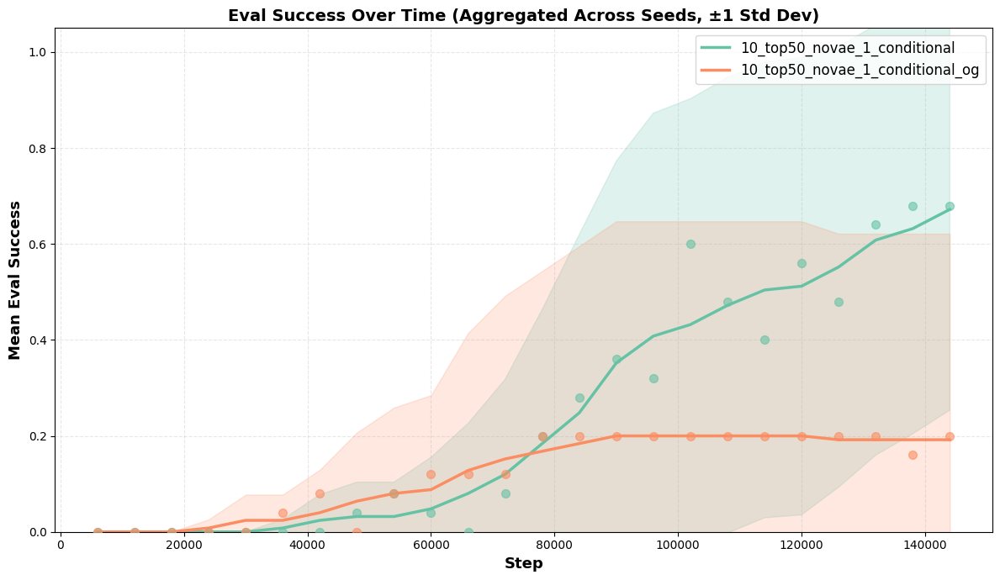

✓ Saved plot: results/individual_seeds_success_comparison_all_scores.png


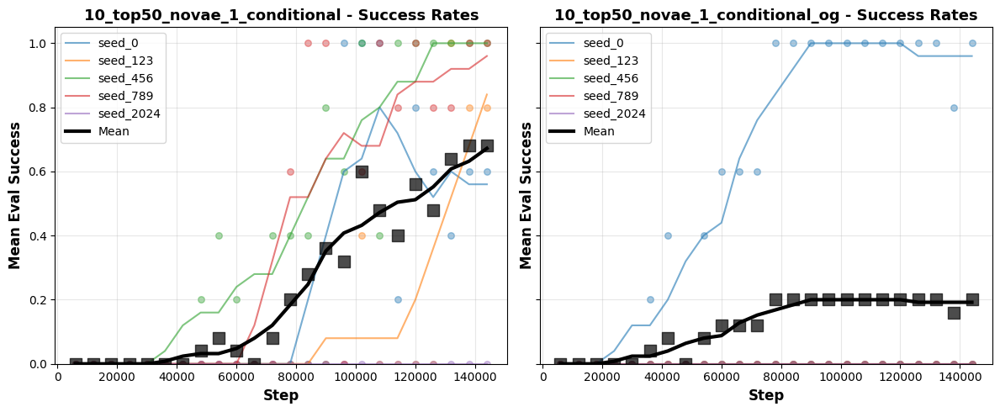

✓ Saved plot: results/variance_trend_eval_return_all_scores.png


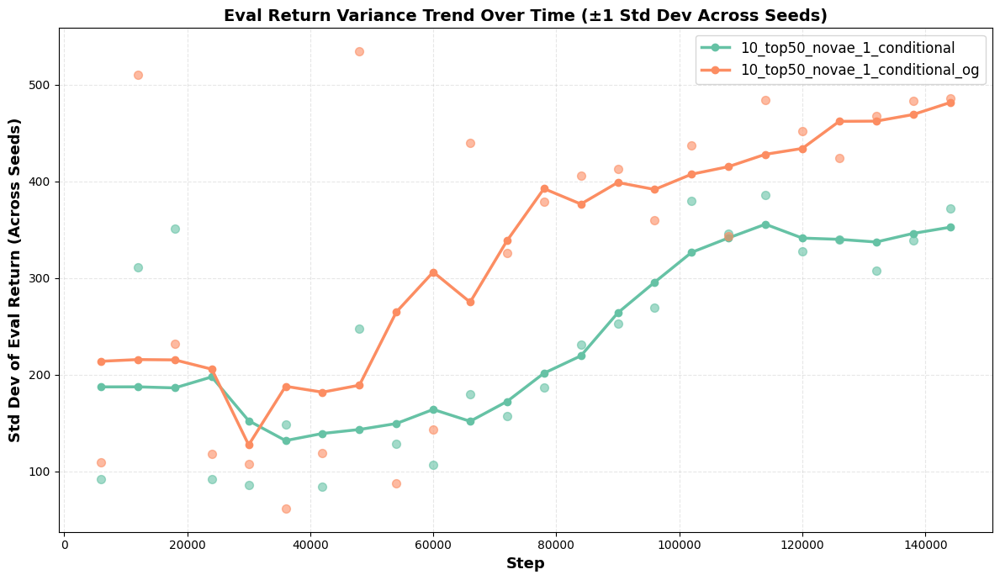

✓ Saved plot: results/variance_trend_eval_success_all_scores.png


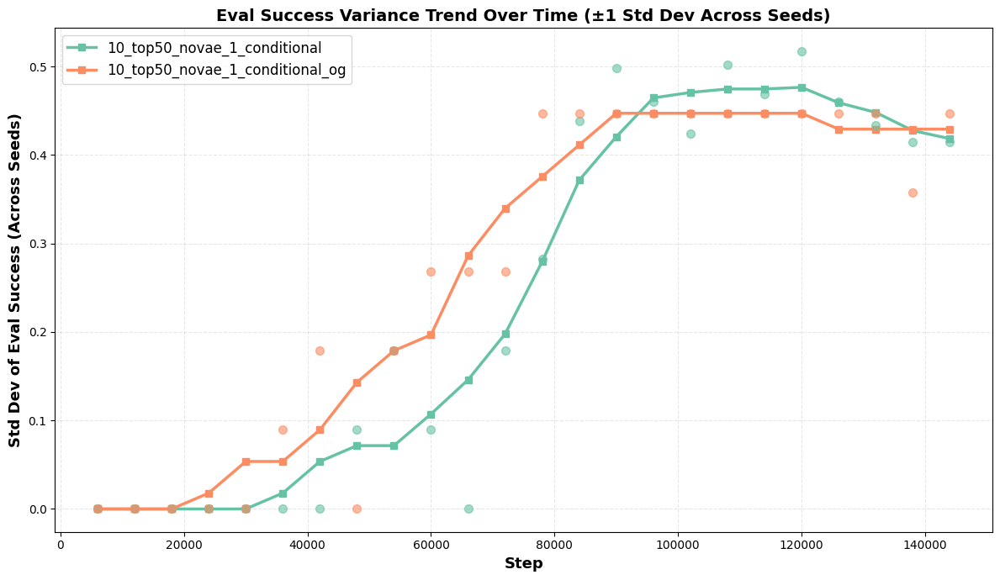

✓ Saved plot: results/variance_trend_combined_all_scores.png


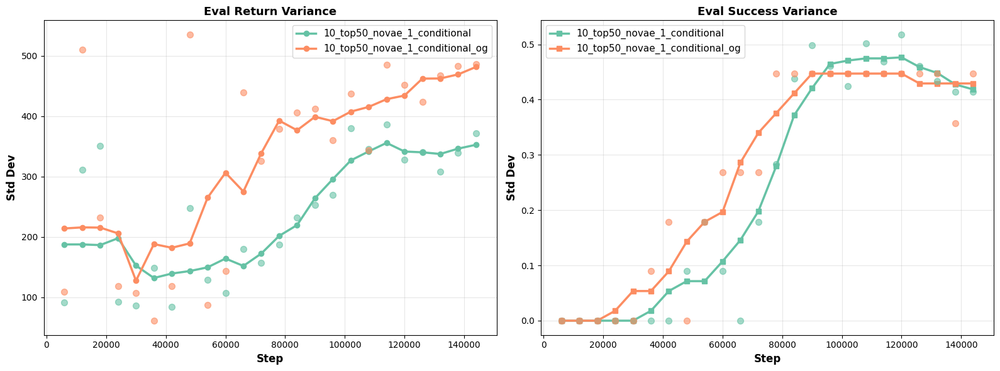


SUMMARY STATISTICS (Aggregated Across Seeds)

10_top50_novae_1_conditional:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 2105.9965
  - Final std_eval_return: 371.9450
  - Max mean_eval_return: 2107.2087
  - Min mean_eval_return: 382.2346
  - Overall mean_eval_return: 1551.2719
  - Final mean_eval_success: 0.6800
  - Final std_eval_success: 0.4147
  - Max mean_eval_success: 0.6800
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.2467

10_top50_novae_1_conditional_og:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1723.6788
  - Final std_eval_return: 485.6522
  - Max mean_eval_return: 1723.6788
  - Min mean_eval_return: 395.2656
  - Overall mean_eval_return: 1458.4895
  - Final mean_eval_success: 0.2000
  - Final std_eval_success: 0.4472
  - Max mean_eval_success: 0.2000
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.1217

✓ All processing complete!


In [2]:
# Define your experiment paths
experiment_paths = {
    '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed*",
    '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed*",
    
}

# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=False    # True to remove lowest score per step
)

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: KEEP ALL SCORES
Smoothness: 5

📊 Processing experiment: 10_top50_novae_1_conditional
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ❌ No eval records found
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Processing seed 2024...
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 4 seed(s)

📊 Processing experiment: 10_top50_novae_1_conditional_og
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Pr

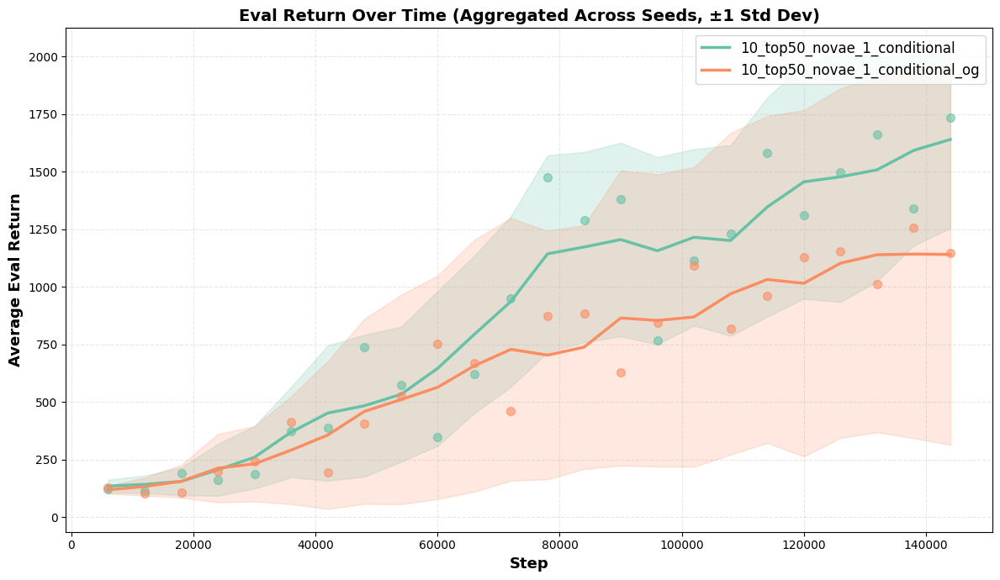

✓ Saved plot: results/individual_seeds_comparison_all_scores.png


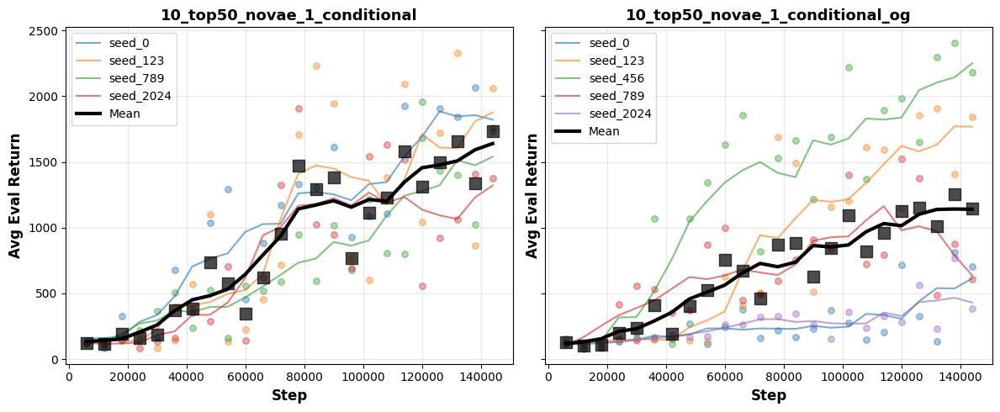

✓ Saved plot: results/cross_seed_eval_success_comparison_all_scores.png


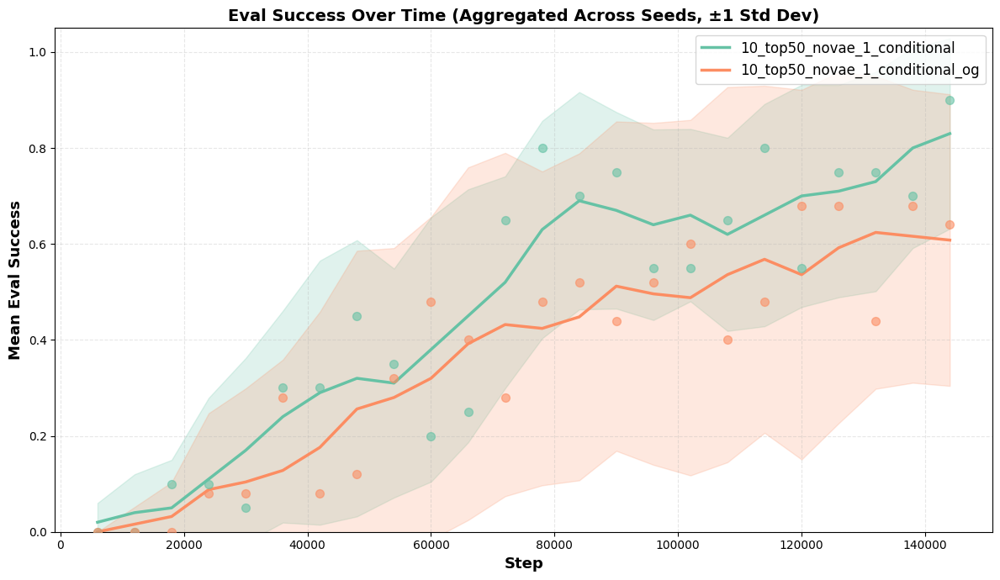

✓ Saved plot: results/individual_seeds_success_comparison_all_scores.png


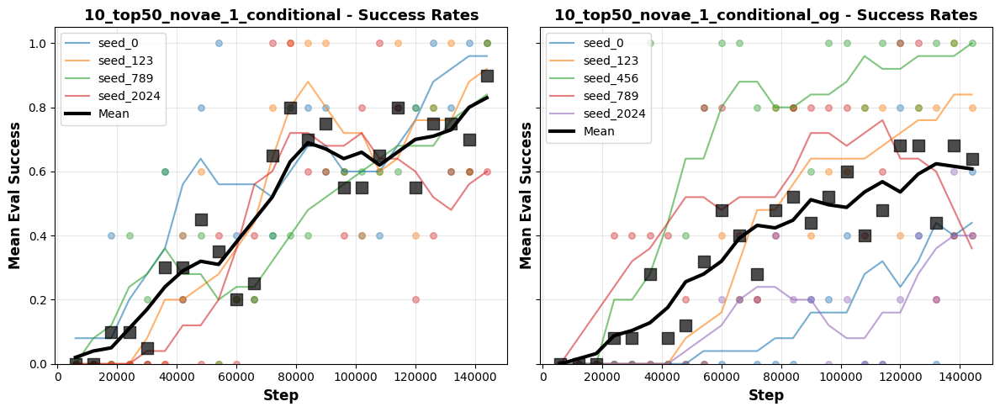

✓ Saved plot: results/variance_trend_eval_return_all_scores.png


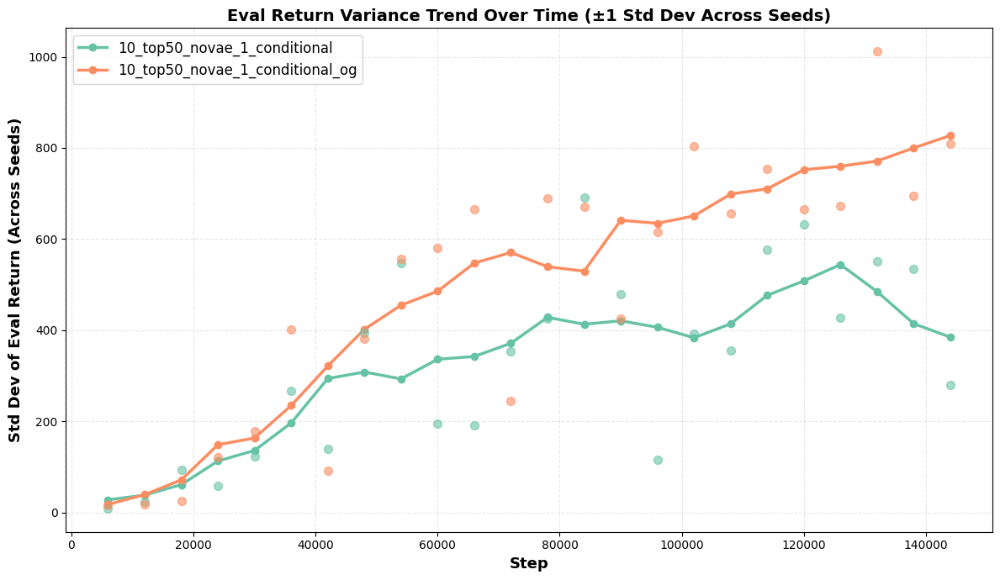

✓ Saved plot: results/variance_trend_eval_success_all_scores.png


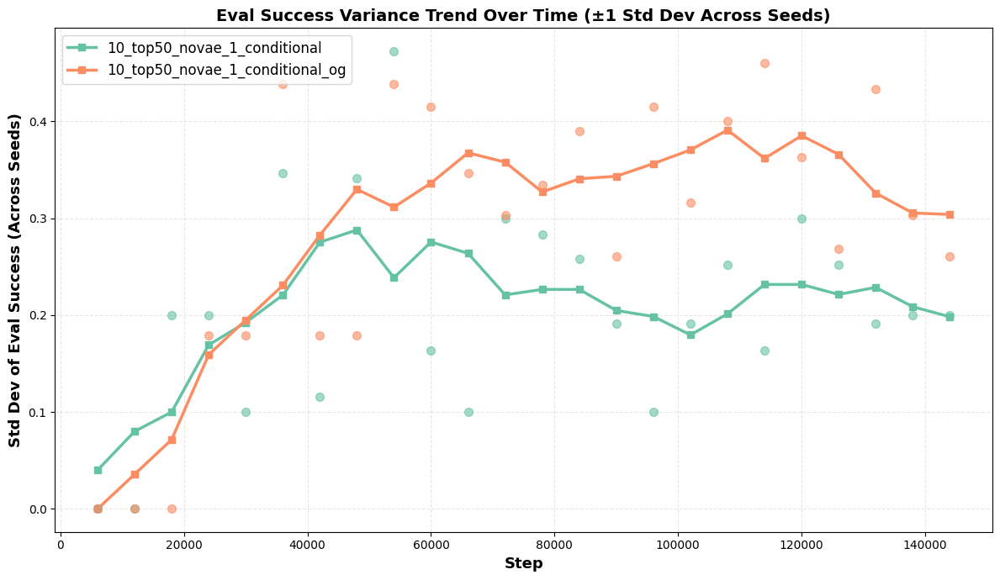

✓ Saved plot: results/variance_trend_combined_all_scores.png


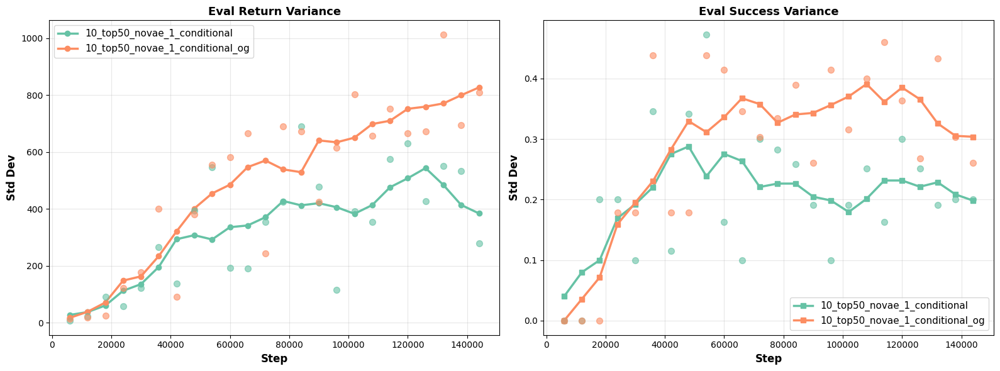


SUMMARY STATISTICS (Aggregated Across Seeds)

10_top50_novae_1_conditional:
  - Number of seeds: 4
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1732.9860
  - Final std_eval_return: 279.6975
  - Max mean_eval_return: 1732.9860
  - Min mean_eval_return: 113.9328
  - Overall mean_eval_return: 880.7988
  - Final mean_eval_success: 0.9000
  - Final std_eval_success: 0.2000
  - Max mean_eval_success: 0.9000
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.4667

10_top50_novae_1_conditional_og:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1144.8134
  - Final std_eval_return: 809.3931
  - Max mean_eval_return: 1254.8259
  - Min mean_eval_return: 100.7686
  - Overall mean_eval_return: 666.4882
  - Final mean_eval_success: 0.6400
  - Final std_eval_success: 0.2608
  - Max mean_eval_success: 0.6800
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.3617

✓ All processing complete!


In [5]:
# Define your experiment paths
experiment_paths = {
    '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed*",
    '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed*",
    
}


# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=False    # True to remove lowest score per step
)

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: KEEP ALL SCORES
Smoothness: 5

📊 Processing experiment: 10_top50_novae_1_conditional
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Processing seed 2024...
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 5 seed(s)

📊 Processing experiment: 10_top50_novae_1_conditional_og
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation 

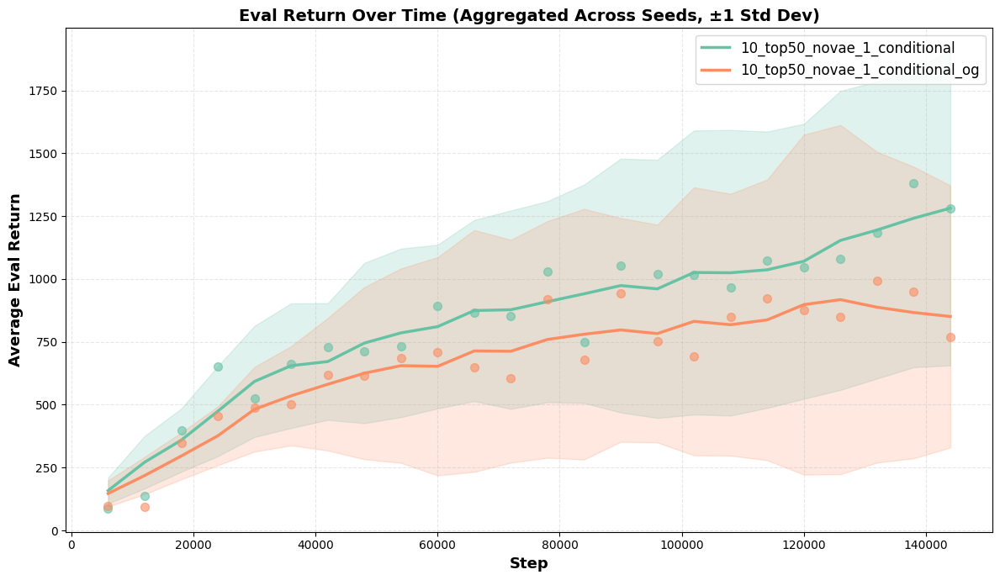

✓ Saved plot: results/individual_seeds_comparison_all_scores.png


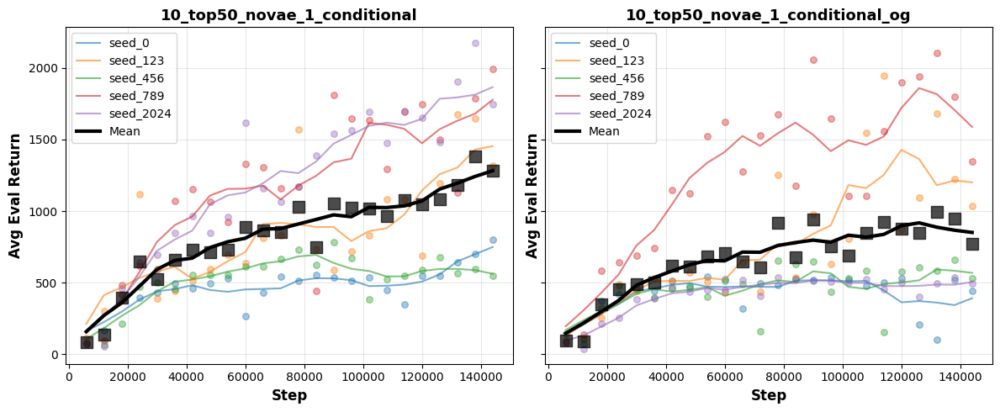

✓ Saved plot: results/cross_seed_eval_success_comparison_all_scores.png


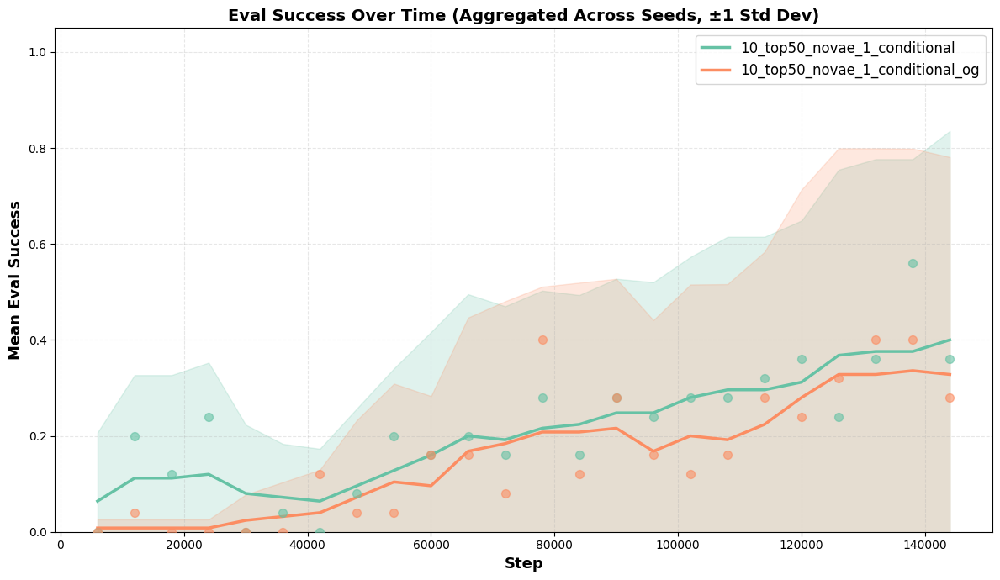

✓ Saved plot: results/individual_seeds_success_comparison_all_scores.png


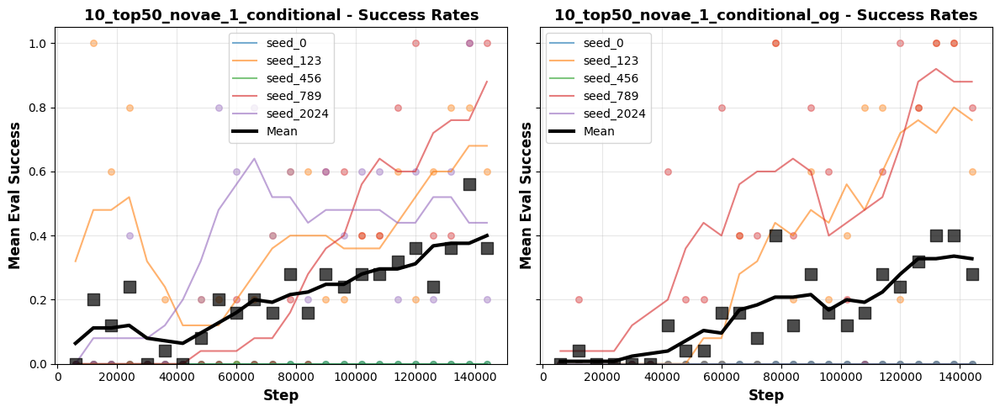

✓ Saved plot: results/variance_trend_eval_return_all_scores.png


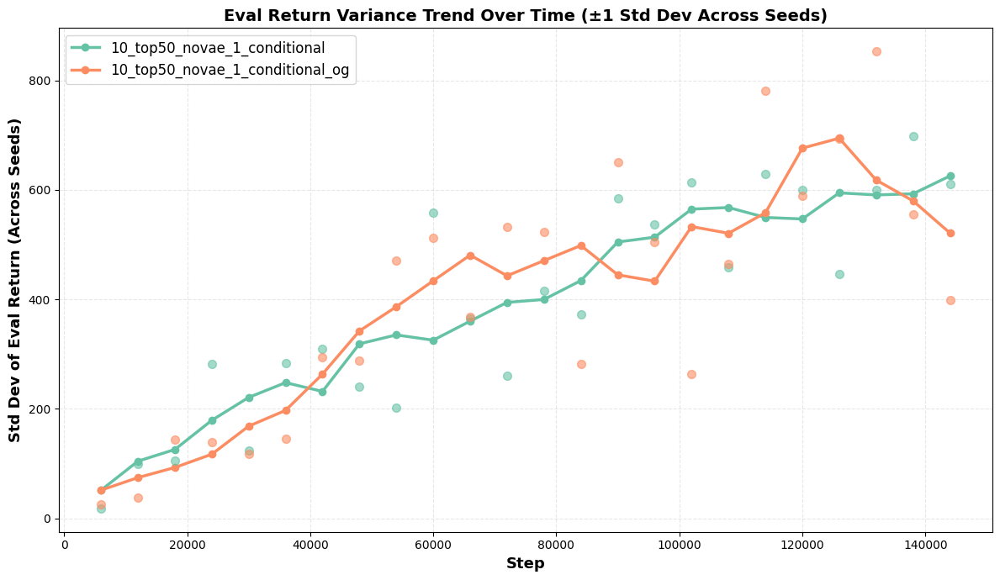

✓ Saved plot: results/variance_trend_eval_success_all_scores.png


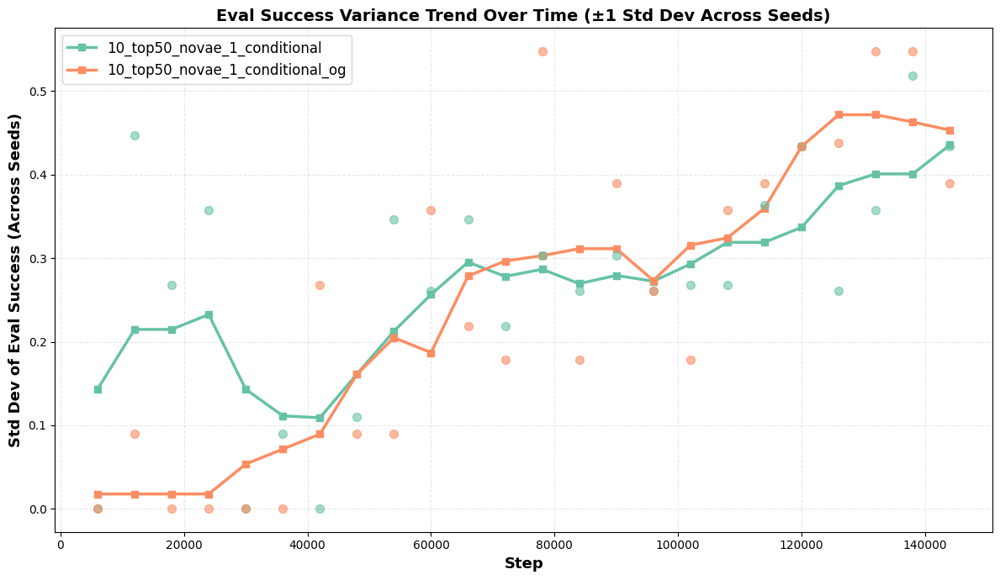

✓ Saved plot: results/variance_trend_combined_all_scores.png


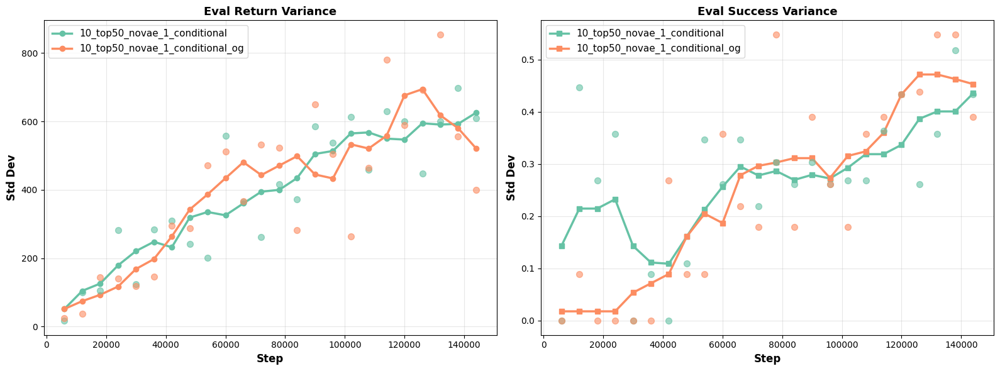


SUMMARY STATISTICS (Aggregated Across Seeds)

10_top50_novae_1_conditional:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1281.2702
  - Final std_eval_return: 610.1415
  - Max mean_eval_return: 1381.5169
  - Min mean_eval_return: 85.3832
  - Overall mean_eval_return: 838.6324
  - Final mean_eval_success: 0.3600
  - Final std_eval_success: 0.4336
  - Max mean_eval_success: 0.5600
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.2133

10_top50_novae_1_conditional_og:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 770.8597
  - Final std_eval_return: 399.0240
  - Max mean_eval_return: 994.7564
  - Min mean_eval_return: 92.8832
  - Overall mean_eval_return: 669.2710
  - Final mean_eval_success: 0.2800
  - Final std_eval_success: 0.3899
  - Max mean_eval_success: 0.4000
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.1583

✓ All processing complete!


In [3]:
# Define your experiment paths
experiment_paths = {
    '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed*",
    '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed*",
    
}


# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=False    # True to remove lowest score per step
)

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: KEEP ALL SCORES
Smoothness: 5

📊 Processing experiment: 10_top50_novae_1_conditional
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Processing seed 2024...
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 5 seed(s)

📊 Processing experiment: 10_top50_novae_1_conditional_og
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation st

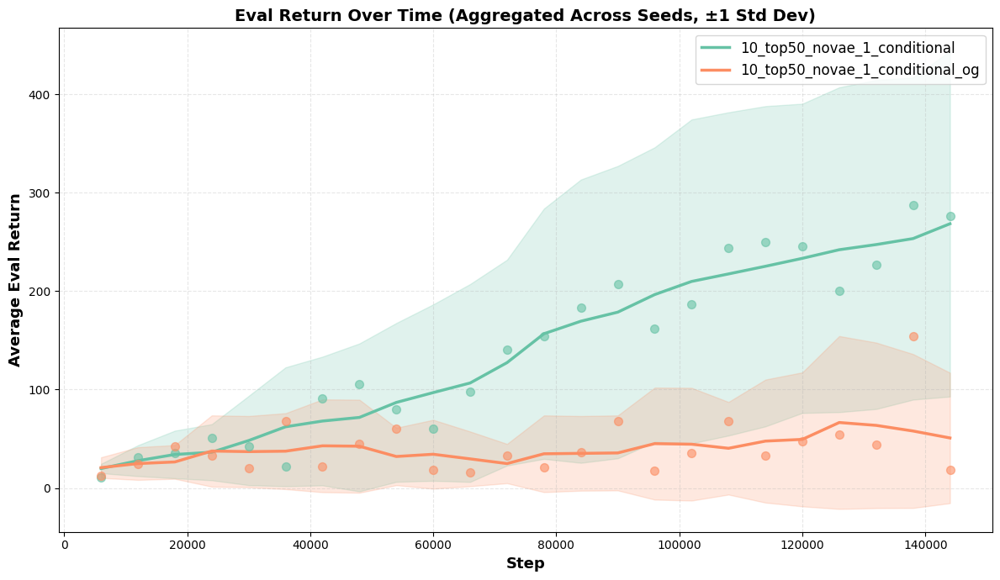

✓ Saved plot: results/individual_seeds_comparison_all_scores.png


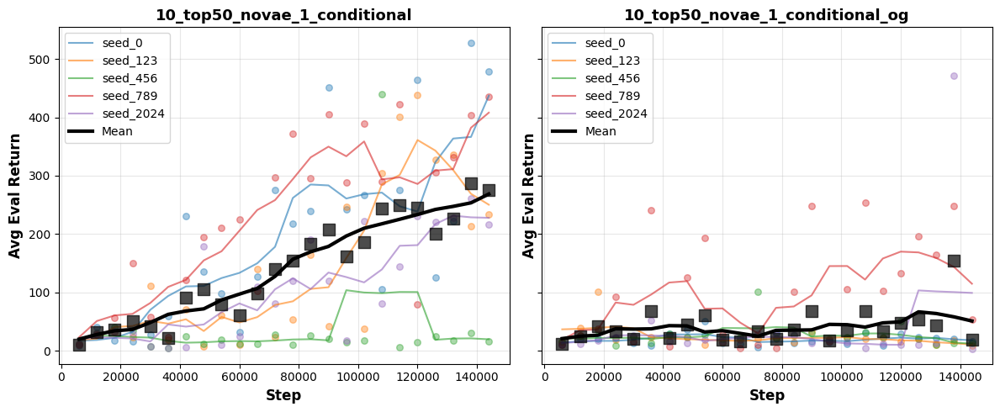

✓ Saved plot: results/cross_seed_eval_success_comparison_all_scores.png


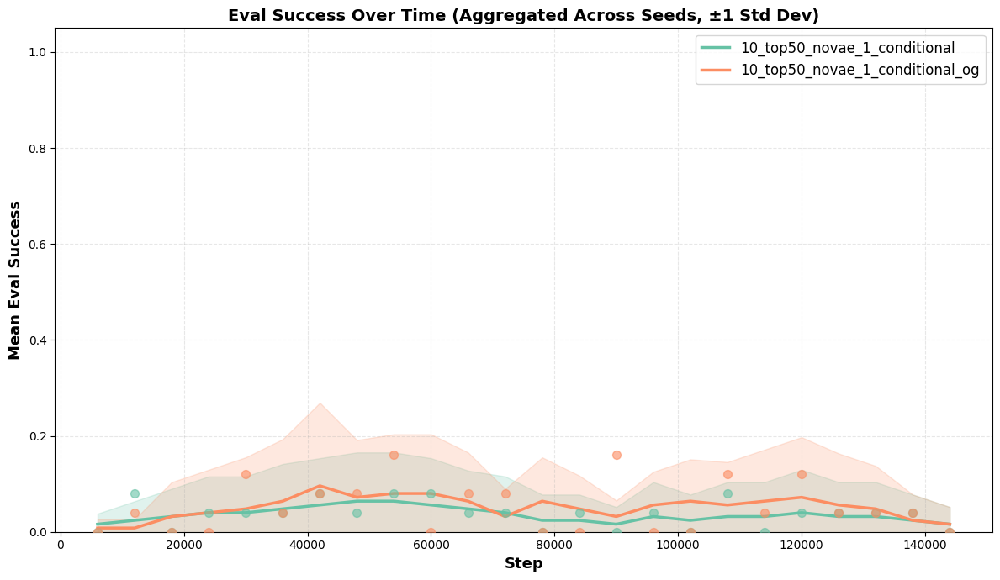

✓ Saved plot: results/individual_seeds_success_comparison_all_scores.png


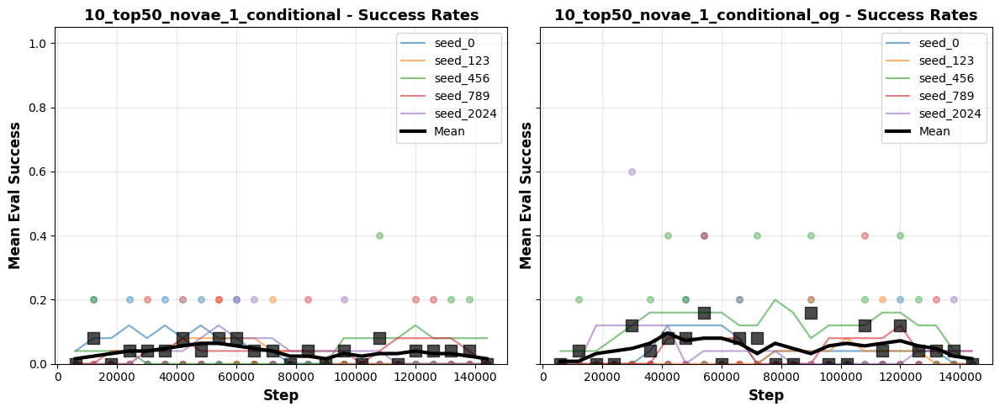

✓ Saved plot: results/variance_trend_eval_return_all_scores.png


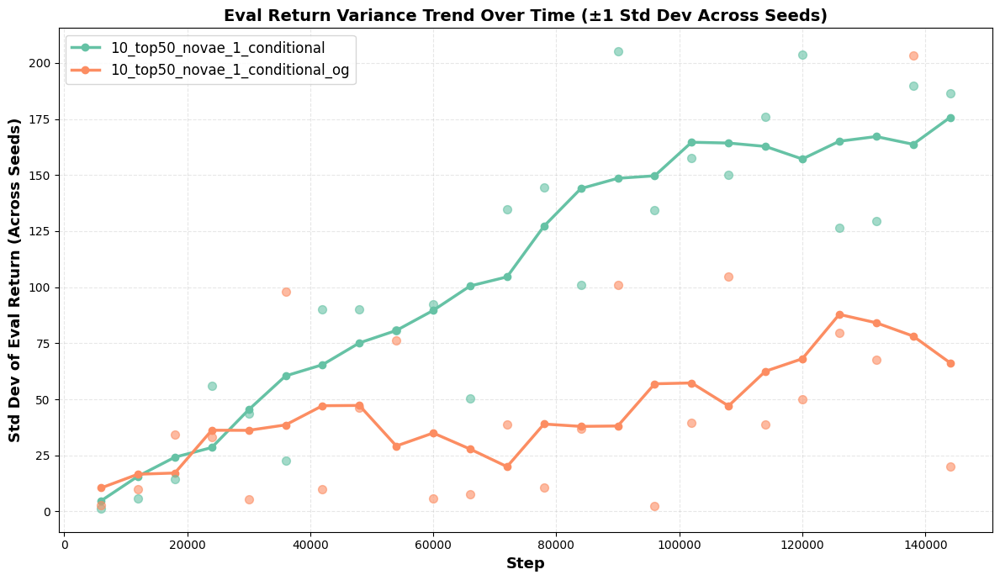

✓ Saved plot: results/variance_trend_eval_success_all_scores.png


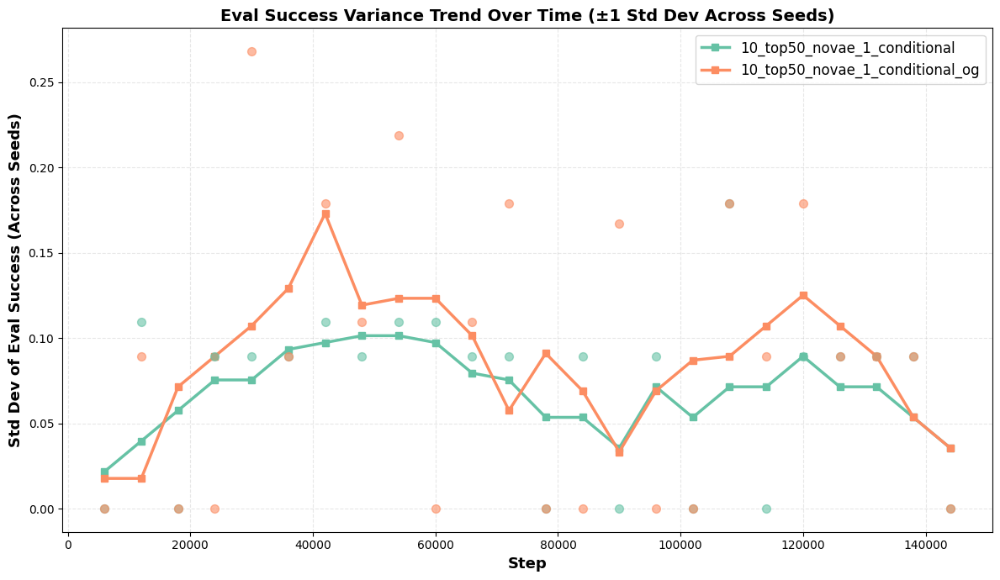

✓ Saved plot: results/variance_trend_combined_all_scores.png


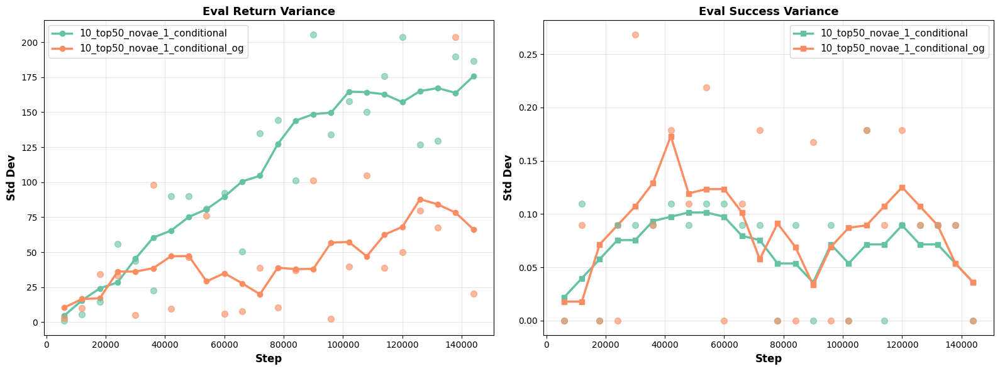


SUMMARY STATISTICS (Aggregated Across Seeds)

10_top50_novae_1_conditional:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 276.1080
  - Final std_eval_return: 186.3508
  - Max mean_eval_return: 287.5287
  - Min mean_eval_return: 10.6147
  - Overall mean_eval_return: 141.3135
  - Final mean_eval_success: 0.0000
  - Final std_eval_success: 0.0000
  - Max mean_eval_success: 0.0800
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.0367

10_top50_novae_1_conditional_og:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 18.7404
  - Final std_eval_return: 20.1841
  - Max mean_eval_return: 153.9371
  - Min mean_eval_return: 12.1919
  - Overall mean_eval_return: 41.2651
  - Final mean_eval_success: 0.0000
  - Final std_eval_success: 0.0000
  - Max mean_eval_success: 0.1600
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.0517

✓ All processing complete!


In [2]:
# Define your experiment paths
experiment_paths = {
    '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed*",
    '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed*",
    
}


# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=False    # True to remove lowest score per step
)

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: REMOVE LOWEST SCORE
Smoothness: 5

📊 Processing experiment: 10_top50_novae_1
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_10_top50/moe_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0... (removing lowest score)
    ✓ Processed 24 evaluation steps
  Processing seed 123... (removing lowest score)
    ✓ Processed 24 evaluation steps
  Processing seed 456... (removing lowest score)
    ✓ Processed 24 evaluation steps
  Processing seed 789... (removing lowest score)
    ✓ Processed 24 evaluation steps
  Processing seed 2024... (removing lowest score)
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 5 seed(s)

📊 Processing experiment: tier10_withvae_0.1
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_50tier10/moe_with_vae/moe_with_vae_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0... (removing lowest score)
    ✓ Processe

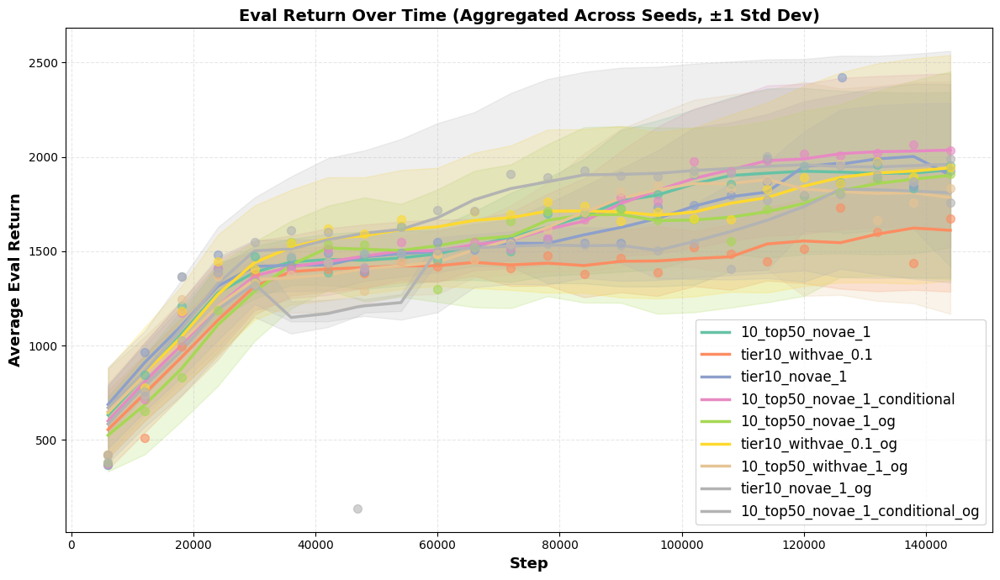

✓ Saved plot: results/individual_seeds_comparison_remove_lowest.png


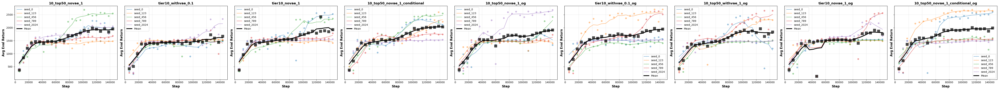

✓ Saved plot: results/cross_seed_eval_success_comparison_remove_lowest.png


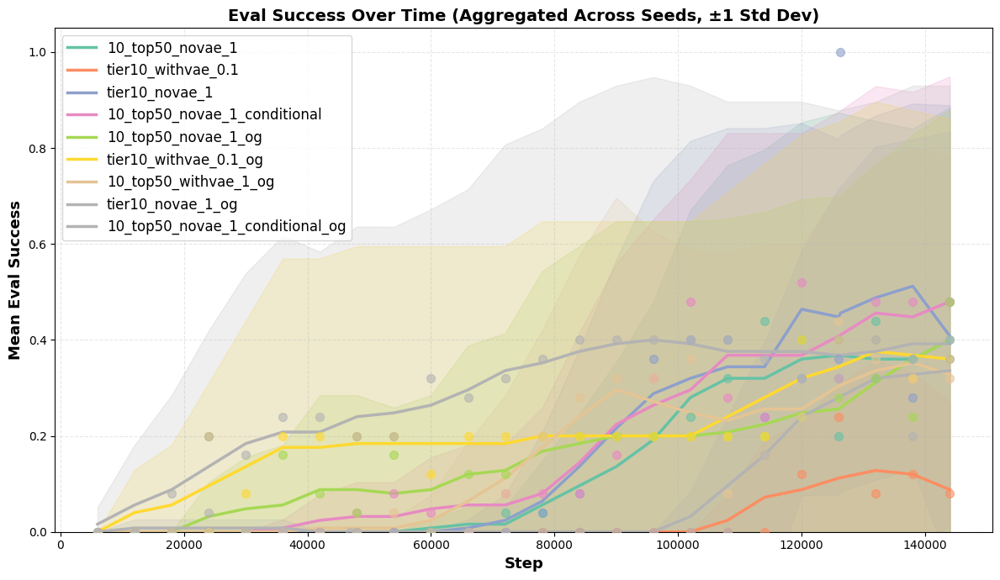

✓ Saved plot: results/individual_seeds_success_comparison_remove_lowest.png


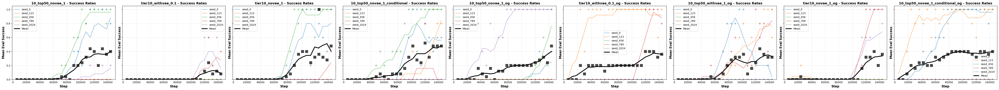

✓ Saved plot: results/variance_trend_eval_return_remove_lowest.png


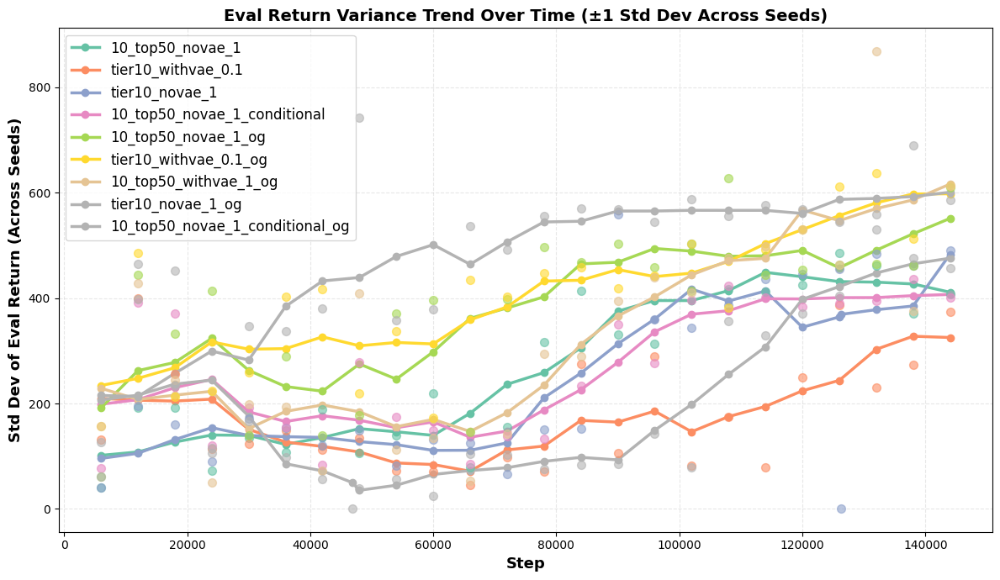

✓ Saved plot: results/variance_trend_eval_success_remove_lowest.png


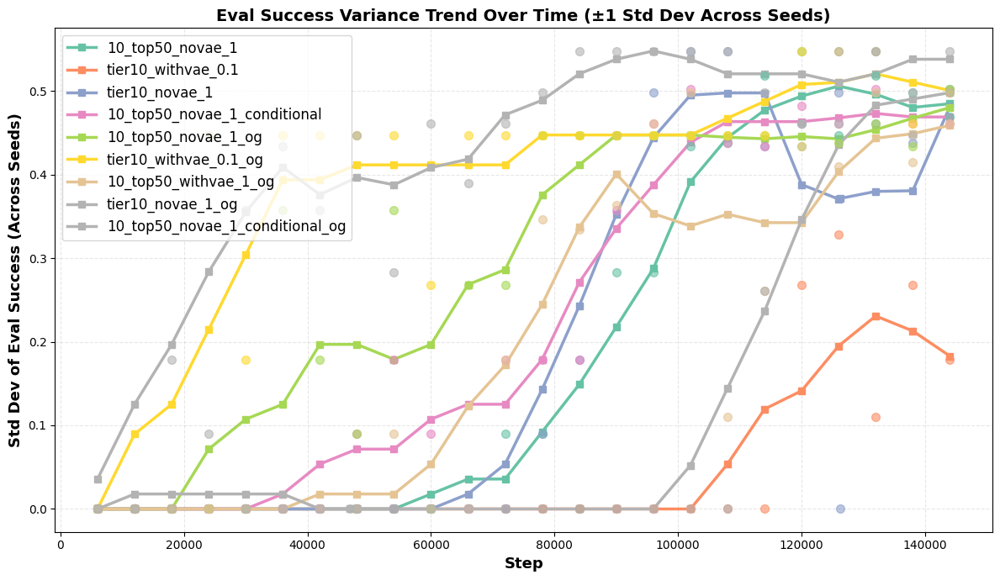

✓ Saved plot: results/variance_trend_combined_remove_lowest.png


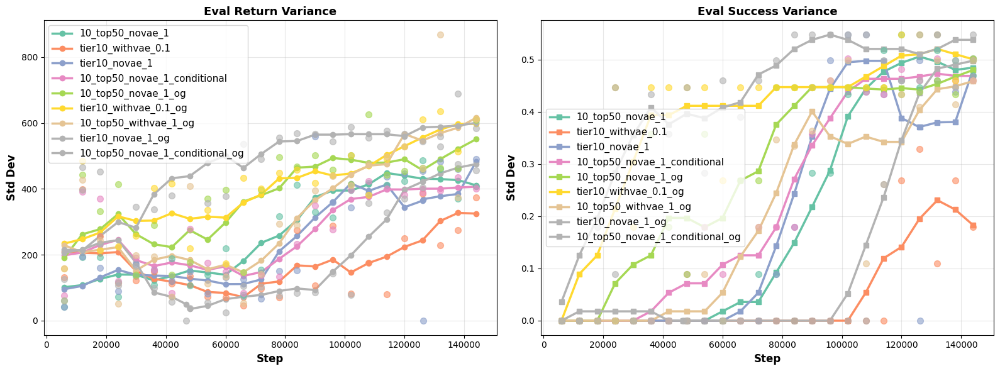


SUMMARY STATISTICS (Aggregated Across Seeds)

10_top50_novae_1:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1955.6651
  - Final std_eval_return: 407.7183
  - Max mean_eval_return: 1988.7876
  - Min mean_eval_return: 368.5373
  - Overall mean_eval_return: 1576.0501
  - Final mean_eval_success: 0.4000
  - Final std_eval_success: 0.4690
  - Max mean_eval_success: 0.4400
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.1367

tier10_withvae_0.1:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1671.4884
  - Final std_eval_return: 373.8672
  - Max mean_eval_return: 1730.8478
  - Min mean_eval_return: 421.8905
  - Overall mean_eval_return: 1363.7016
  - Final mean_eval_success: 0.0800
  - Final std_eval_success: 0.1789
  - Max mean_eval_success: 0.2400
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.0267

tier10_novae_1:
  - Number of seeds: 5
  - Number of evaluation steps: 25

In [11]:
# Define your experiment paths
experiment_paths = {
    '10_top50_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_10_top50/moe_seed*",
    'tier10_withvae_0.1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_50tier10/moe_with_vae/moe_with_vae_seed*",
    'tier10_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed*",
    '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed*",
    '10_top50_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_10_top50/original_seed*",
    'tier10_withvae_0.1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_50tier10/original_with_vae/original_with_vae_seed*",
    '10_top50_withvae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open/original_with_vae1.0/original_with_vae_seed*",
    'tier10_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/original_seed*",
    '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed*",
    
}


# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=True    # True to remove lowest score per step
)

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: KEEP ALL SCORES
Smoothness: 5

📊 Processing experiment: 10_top50_novae_1
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_10_top50/moe_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Processing seed 2024...
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 5 seed(s)

📊 Processing experiment: tier10_withvae_0.1
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_50tier10/moe_with_vae/moe_with_vae_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Pr

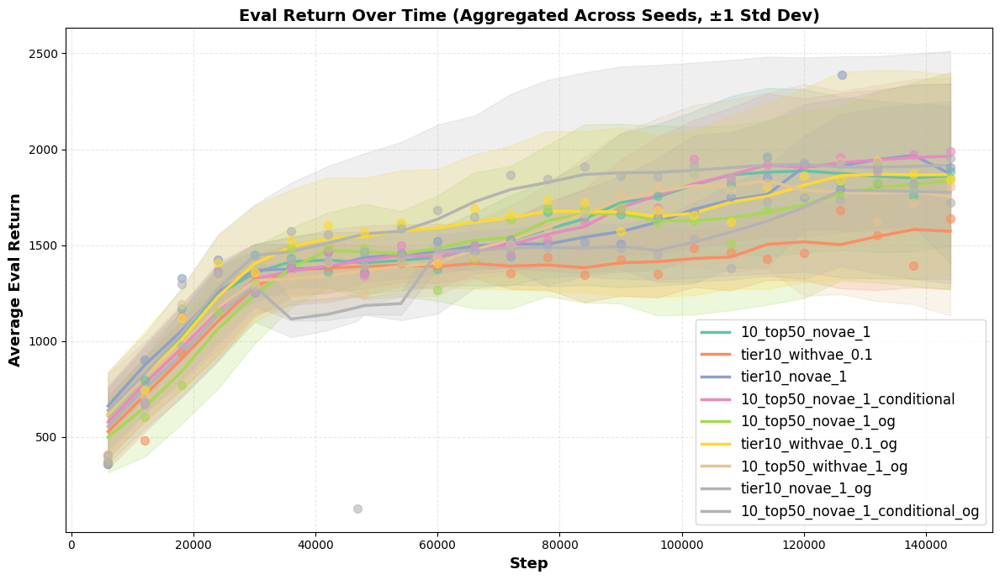

✓ Saved plot: results/individual_seeds_comparison_all_scores.png


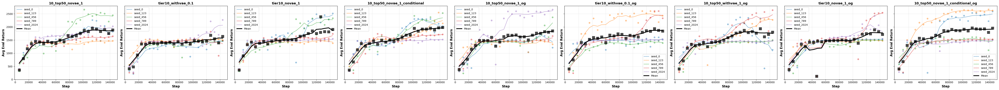

✓ Saved plot: results/cross_seed_eval_success_comparison_all_scores.png


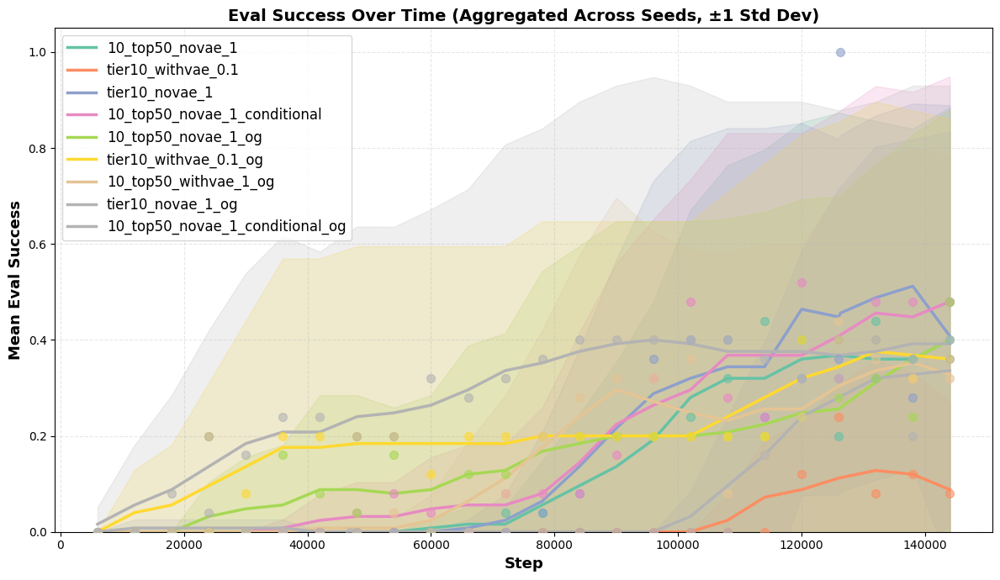

✓ Saved plot: results/individual_seeds_success_comparison_all_scores.png


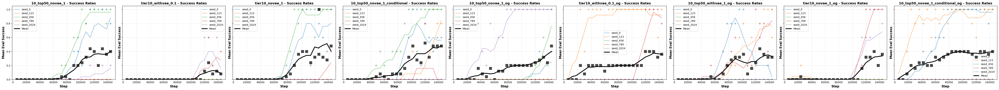

✓ Saved plot: results/variance_trend_eval_return_all_scores.png


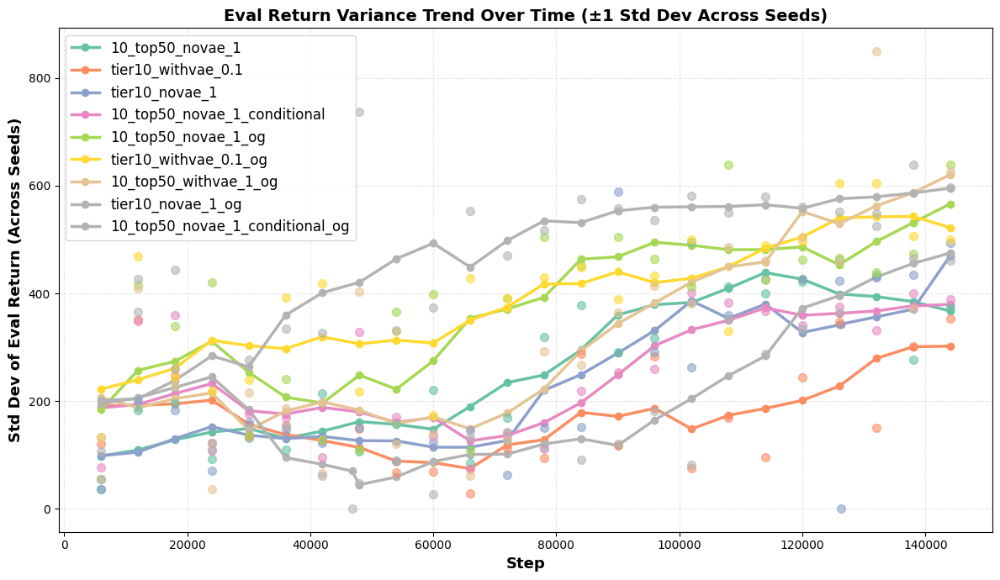

✓ Saved plot: results/variance_trend_eval_success_all_scores.png


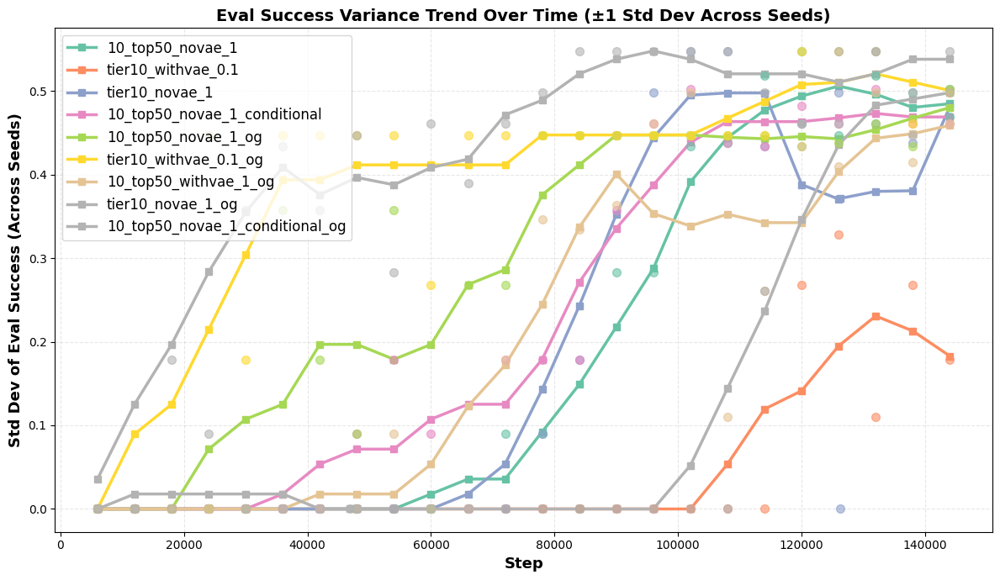

✓ Saved plot: results/variance_trend_combined_all_scores.png


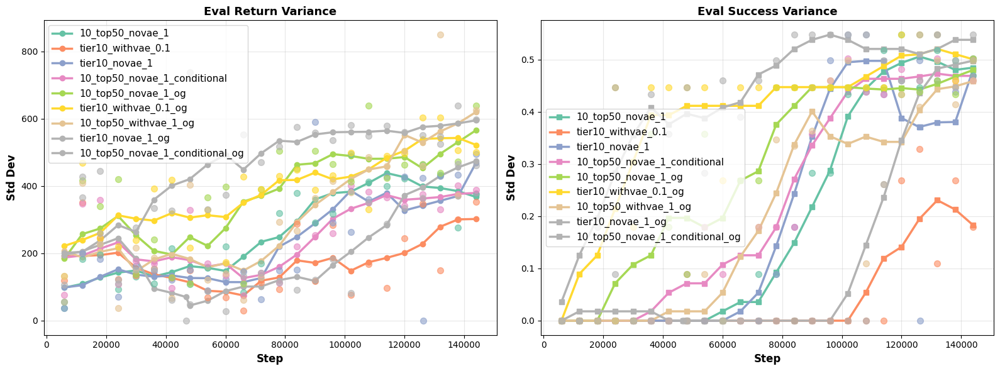


SUMMARY STATISTICS (Aggregated Across Seeds)

10_top50_novae_1:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1883.7355
  - Final std_eval_return: 375.8350
  - Max mean_eval_return: 1959.5399
  - Min mean_eval_return: 361.3377
  - Overall mean_eval_return: 1533.7795
  - Final mean_eval_success: 0.4000
  - Final std_eval_success: 0.4690
  - Max mean_eval_success: 0.4400
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.1367

tier10_withvae_0.1:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1640.3524
  - Final std_eval_return: 353.2788
  - Max mean_eval_return: 1684.4756
  - Min mean_eval_return: 408.1734
  - Overall mean_eval_return: 1329.9933
  - Final mean_eval_success: 0.0800
  - Final std_eval_success: 0.1789
  - Max mean_eval_success: 0.2400
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.0267

tier10_novae_1:
  - Number of seeds: 5
  - Number of evaluation steps: 25

In [4]:
# Define your experiment paths
experiment_paths = {
    '10_top50_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_10_top50/moe_seed*",
    'tier10_withvae_0.1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_50tier10/moe_with_vae/moe_with_vae_seed*",
    'tier10_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed*",
    '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_conditional_distill/moe_seed*",
    '10_top50_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_10_top50/original_seed*",
    'tier10_withvae_0.1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_50tier10/original_with_vae/original_with_vae_seed*",
    '10_top50_withvae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open/original_with_vae1.0/original_with_vae_seed*",
    'tier10_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/original_seed*",
    '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_conditional_distill/original_seed*",
    
}


# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=False    # True to remove lowest score per step
)

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: KEEP ALL SCORES
Smoothness: 5

📊 Processing experiment: 10_top50_novae_1
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_10_top50/moe_seed*
   ✓ Found 4 seed(s): [0, 123, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Processing seed 2024...
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 4 seed(s)

📊 Processing experiment: tier10_withvae_0.1
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_50tier10/moe_with_vae/moe_with_vae_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Process

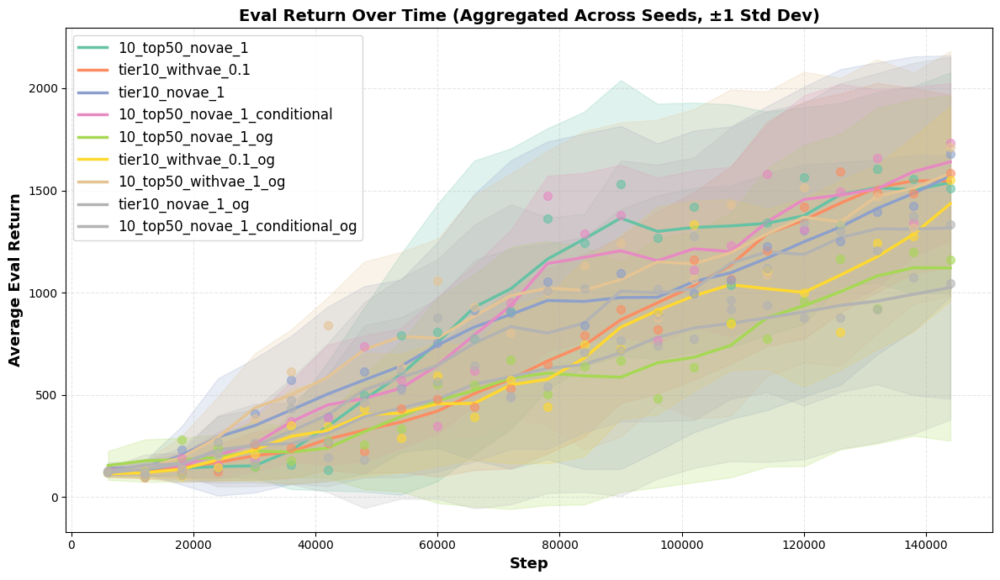

✓ Saved plot: results/individual_seeds_comparison_all_scores.png


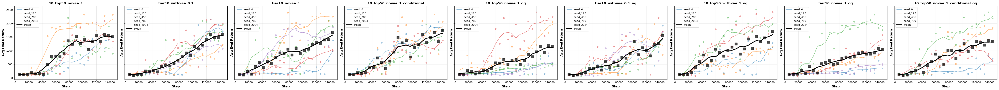

✓ Saved plot: results/cross_seed_eval_success_comparison_all_scores.png


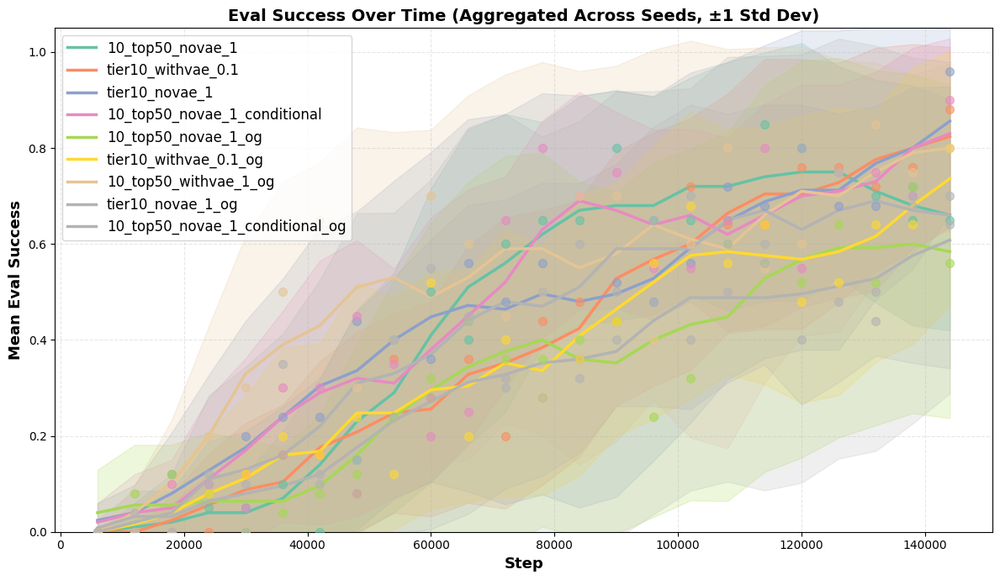

✓ Saved plot: results/individual_seeds_success_comparison_all_scores.png


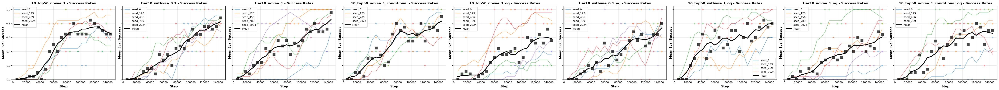

✓ Saved plot: results/variance_trend_eval_return_all_scores.png


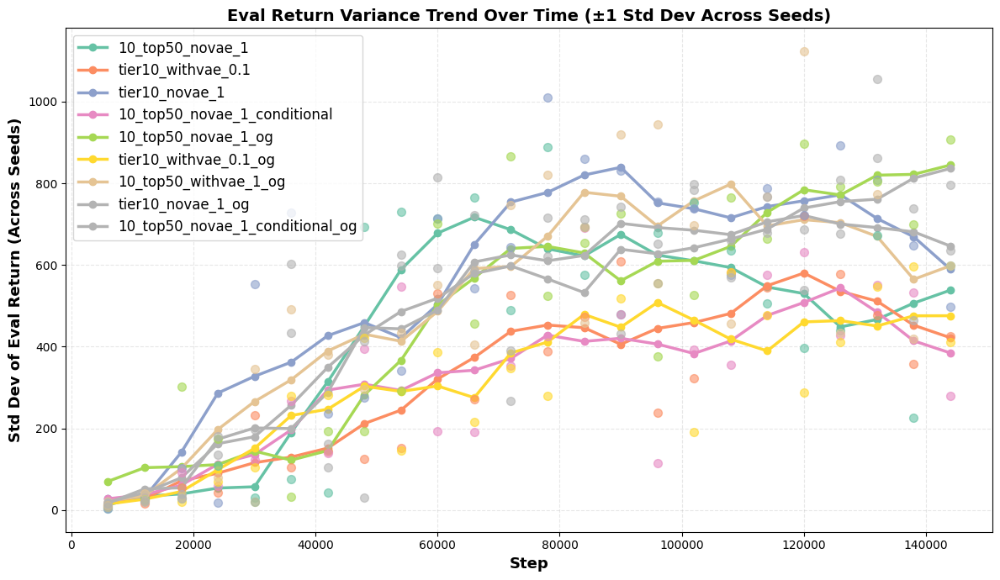

✓ Saved plot: results/variance_trend_eval_success_all_scores.png


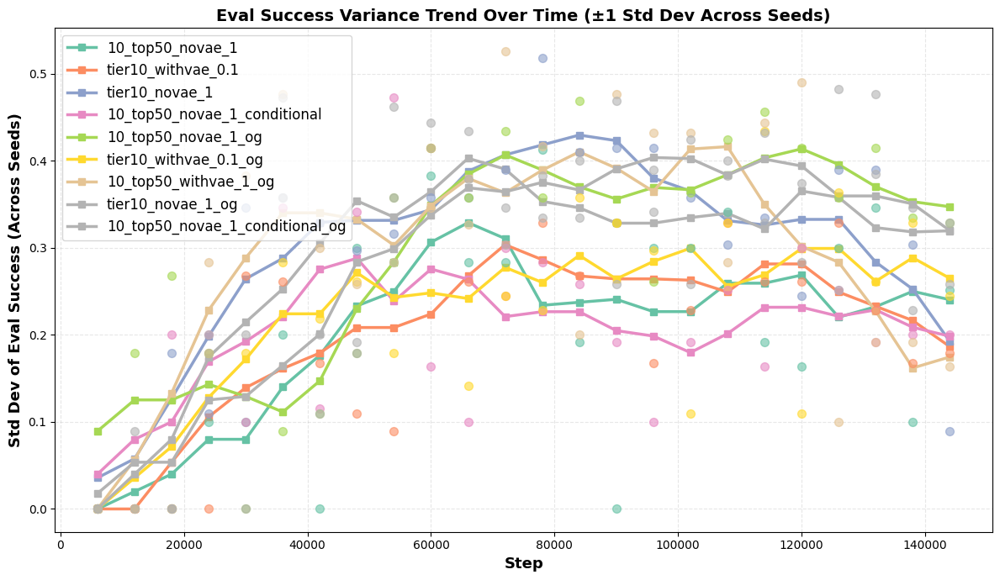

✓ Saved plot: results/variance_trend_combined_all_scores.png


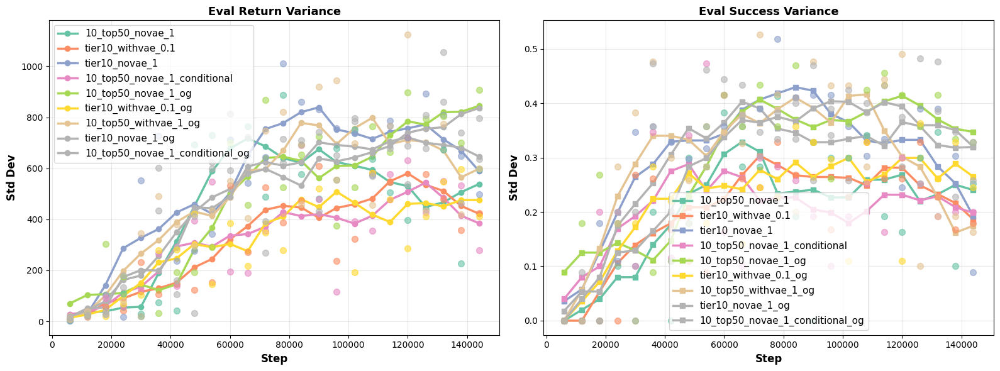


SUMMARY STATISTICS (Aggregated Across Seeds)

10_top50_novae_1:
  - Number of seeds: 4
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1510.4751
  - Final std_eval_return: 597.4350
  - Max mean_eval_return: 1605.3880
  - Min mean_eval_return: 115.4590
  - Overall mean_eval_return: 898.1246
  - Final mean_eval_success: 0.6500
  - Final std_eval_success: 0.2517
  - Max mean_eval_success: 0.8500
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.4458

tier10_withvae_0.1:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1586.2014
  - Final std_eval_return: 424.6977
  - Max mean_eval_return: 1591.3813
  - Min mean_eval_return: 97.4564
  - Overall mean_eval_return: 730.0458
  - Final mean_eval_success: 0.8800
  - Final std_eval_success: 0.1789
  - Max mean_eval_success: 0.8800
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.3967

tier10_novae_1:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  

In [14]:
# Define your experiment paths
experiment_paths = {
    '10_top50_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_10_top50/moe_seed*",
    'tier10_withvae_0.1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_50tier10/moe_with_vae/moe_with_vae_seed*",
    'tier10_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_tier10/moe_seed*",
    '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed*",
    '10_top50_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_10_top50/original_seed*",
    'tier10_withvae_0.1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_50tier10/original_with_vae/original_with_vae_seed*",
    '10_top50_withvae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open/original_with_vae1.0/original_with_vae_seed*",
    'tier10_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_tier10/original_seed*",
    '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed*",
    
}

# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=False    # True to remove lowest score per step
)

MULTI-SEED EVALUATION METRICS AGGREGATOR
Mode: KEEP ALL SCORES
Smoothness: 5

📊 Processing experiment: tier10_novae_1
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_tier10/moe_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
    ✓ Processed 24 evaluation steps
  Processing seed 2024...
    ✓ Processed 24 evaluation steps
   ✓ Successfully processed 5 seed(s)

📊 Processing experiment: tier10_novae_1_og
   Pattern: /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_tier10/original_seed*
   ✓ Found 5 seed(s): [0, 123, 456, 789, 2024]
  Processing seed 0...
    ✓ Processed 24 evaluation steps
  Processing seed 123...
    ✓ Processed 24 evaluation steps
  Processing seed 456...
    ✓ Processed 24 evaluation steps
  Processing seed 789...
   

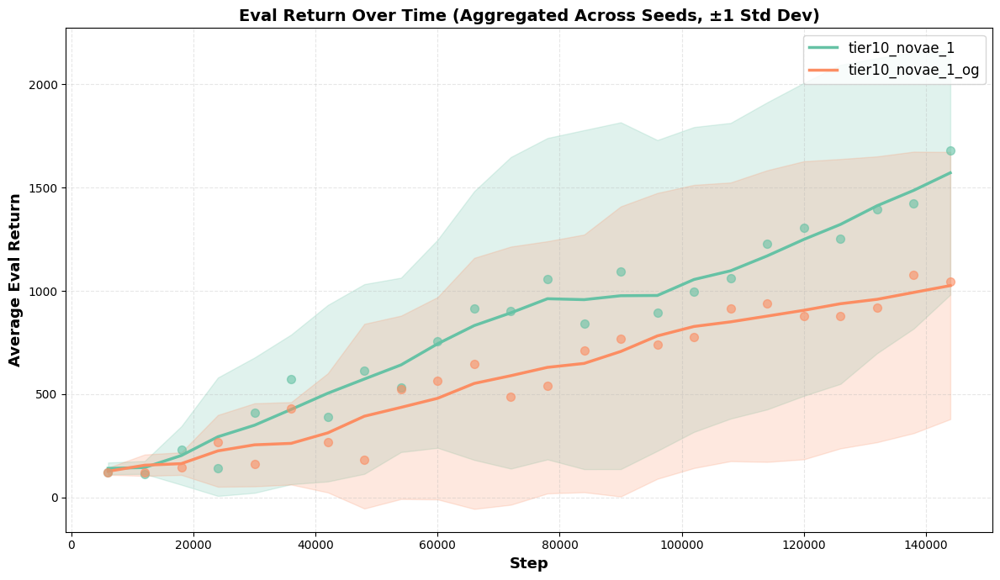

✓ Saved plot: results/individual_seeds_comparison_all_scores.png


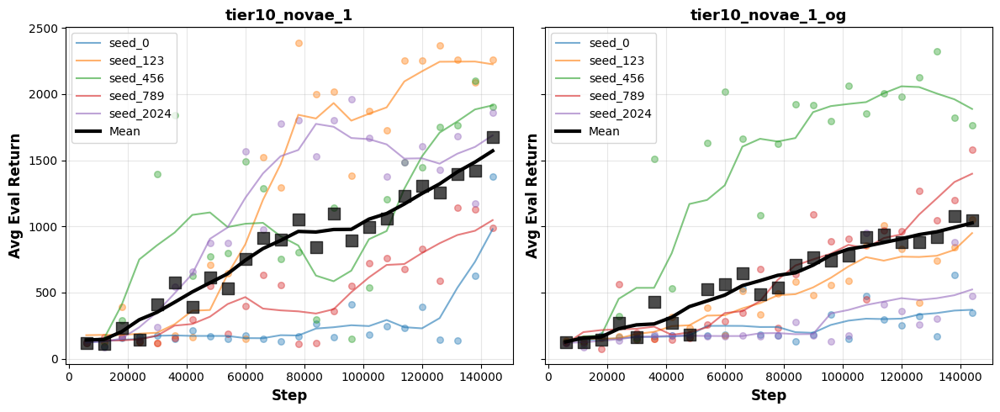

✓ Saved plot: results/cross_seed_eval_success_comparison_all_scores.png


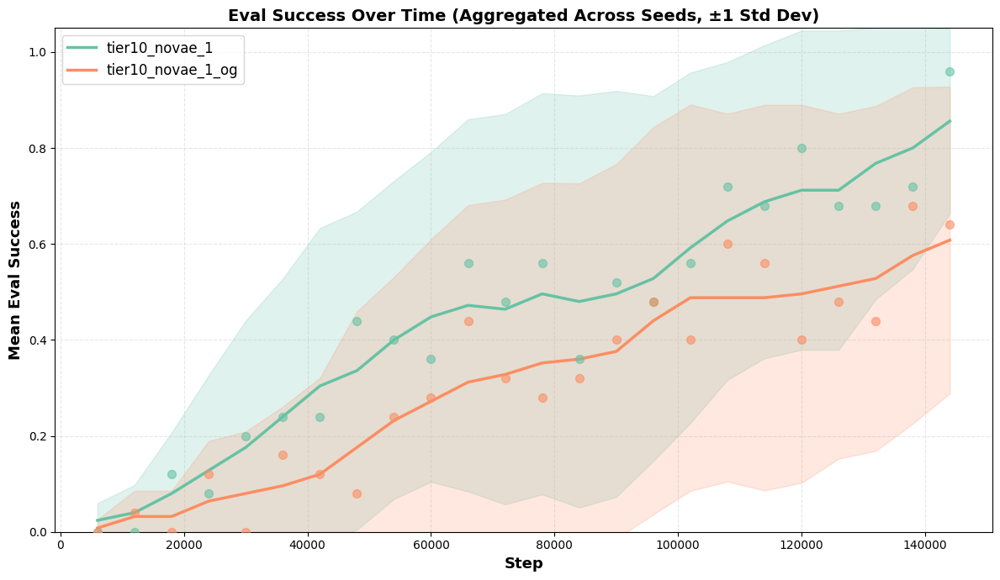

✓ Saved plot: results/individual_seeds_success_comparison_all_scores.png


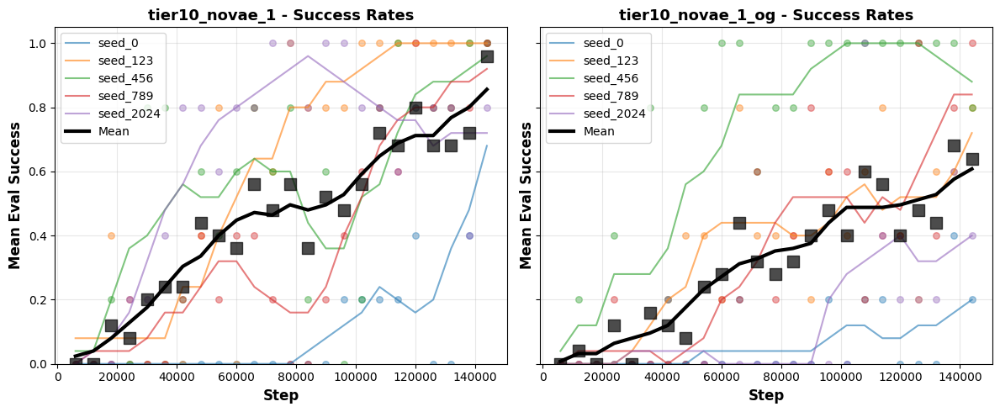

✓ Saved plot: results/variance_trend_eval_return_all_scores.png


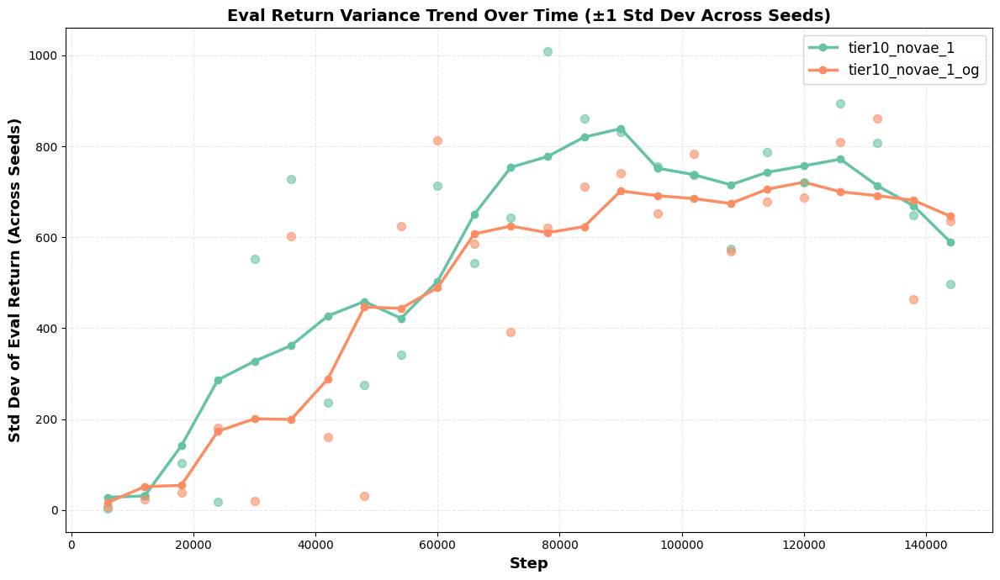

✓ Saved plot: results/variance_trend_eval_success_all_scores.png


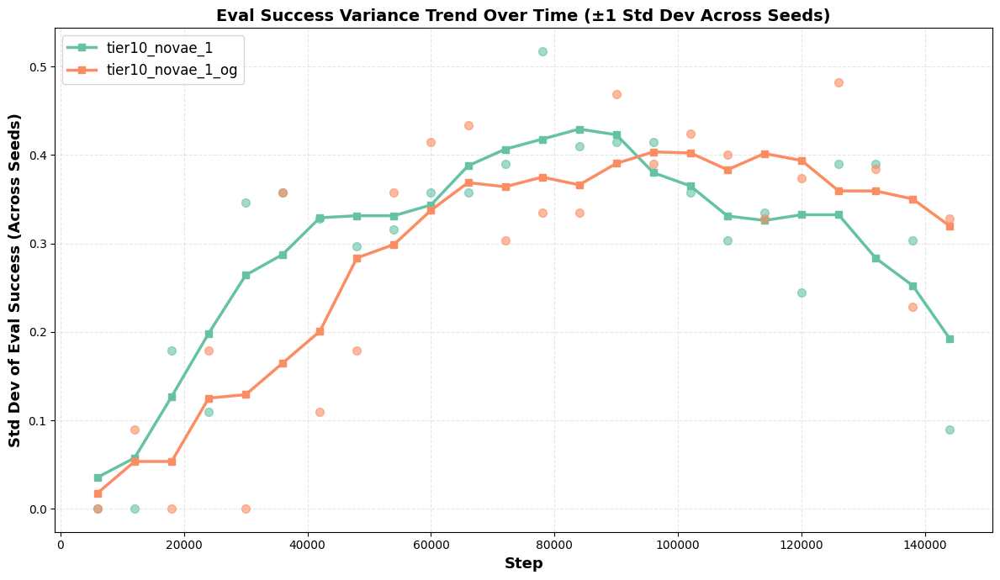

✓ Saved plot: results/variance_trend_combined_all_scores.png


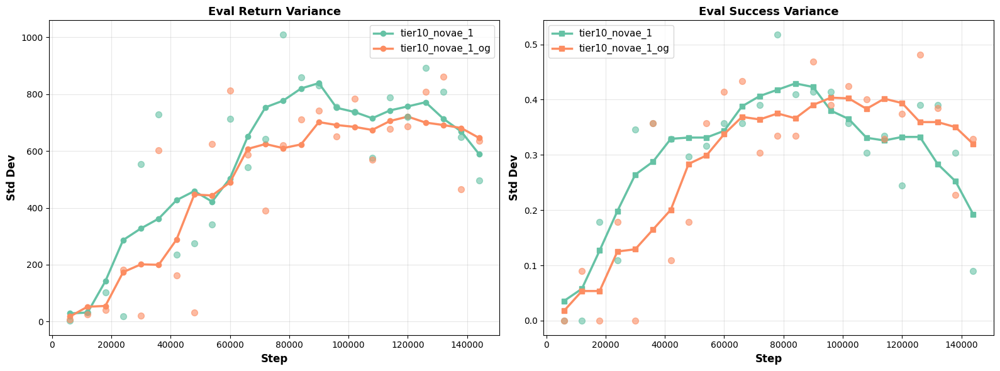


SUMMARY STATISTICS (Aggregated Across Seeds)

tier10_novae_1:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1678.6530
  - Final std_eval_return: 497.2113
  - Max mean_eval_return: 1678.6530
  - Min mean_eval_return: 111.8446
  - Overall mean_eval_return: 830.4092
  - Final mean_eval_success: 0.9600
  - Final std_eval_success: 0.0894
  - Max mean_eval_success: 0.9600
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.4517

tier10_novae_1_og:
  - Number of seeds: 5
  - Number of evaluation steps: 24
  - Final mean_eval_return: 1044.9705
  - Final std_eval_return: 635.4456
  - Max mean_eval_return: 1075.8318
  - Min mean_eval_return: 120.8364
  - Overall mean_eval_return: 587.6457
  - Final mean_eval_success: 0.6400
  - Final std_eval_success: 0.3286
  - Max mean_eval_success: 0.6800
  - Min mean_eval_success: 0.0000
  - Overall mean_eval_success: 0.3117

✓ All processing complete!


In [5]:
# Define your experiment paths
experiment_paths = {
    # '10_top50_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_10_top50/moe_seed*",
    # 'tier10_withvae_0.1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_50tier10/moe_with_vae/moe_with_vae_seed*",
    'tier10_novae_1': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_tier10/moe_seed*",
    # '10_top50_novae_1_conditional': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_conditional_distill/moe_seed*",
    # '10_top50_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_10_top50/original_seed*",
    # 'tier10_withvae_0.1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_50tier10/original_with_vae/original_with_vae_seed*",
    # '10_top50_withvae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open/original_with_vae1.0/original_with_vae_seed*",
    'tier10_novae_1_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_tier10/original_seed*",
    # '10_top50_novae_1_conditional_og': "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/window_open_conditional_distill/original_seed*",
    
}

# Run with all parameters
results = analyze_metrics(
    experiment_paths=experiment_paths,
    output_dir='results',
    smoothness=5,          # 3=minimal, 5=default, 7-9=more, 11+=heavy
    remove_lowest=False    # True to remove lowest score per step
)

In [6]:
import glob
import pandas as pd
import matplotlib.pyplot as plt

def average_and_plot_seeds(path_pattern, title="Average Incident Percentage Across Seeds"):
    """
    Loads all CSV files matching the path pattern, averages their percentage
    columns by Step, plots the averaged curves, and returns the averaged DataFrame.

    Example:
        average_and_plot_seeds(
            "/storage/.../moe_seed*/incident_counts.csv"
        )
    """
    # Find all matching seed CSVs
    file_paths = sorted(glob.glob(path_pattern))
    if len(file_paths) == 0:
        raise FileNotFoundError(f"No CSV files found for pattern: {path_pattern}")

    print(f"Found {len(file_paths)} seed files:")
    for f in file_paths:
        print("  -", f)

    # Load all seed CSVs
    dfs = [pd.read_csv(f) for f in file_paths]

    # Combine all CSVs into one big DF
    full_df = pd.concat(dfs, axis=0)

    # Extract all percentage columns
    percentage_cols = [col for col in full_df.columns if col.startswith("Percentage_")]
    if not percentage_cols:
        raise ValueError("No columns starting with 'Percentage_' were found.")

    # Average across seeds → group by Step
    avg_df = (
        full_df.groupby("Step")[percentage_cols]
        .mean()
        .reset_index()
    )

    # --- Plot using NumPy arrays to avoid the pandas indexing issue ---
    x = avg_df["Step"].to_numpy()

    plt.figure(figsize=(10, 6))
    for col in percentage_cols:
        # Ensure numeric & 1D
        y = pd.to_numeric(avg_df[col], errors="coerce").to_numpy()
        plt.plot(x, y, label=col)

    plt.xlabel("Step")
    plt.ylabel("Average Percentage")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return avg_df

In [ ]:
avg_df = average_and_plot_seeds(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_seed/original_dw*_seed0/incident_counts.csv"
)


[moe_seed] Found seeds:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed123
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed2024
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed0
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed789
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed456
Seed /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed123 has data for: ['prior_ent', 'post_ent', 'distillation_loss', 'actor_ent', 'actor_loss', 'kl_loss']
Seed /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed2024 has data for: ['prior_ent', 'post_ent', 'distillation_loss', 'actor_ent', 'actor_loss', 'kl_loss']
Seed /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10/moe_seed0 has data for: ['prior_ent', 'post_ent', 'distillation_loss', 'actor_ent'

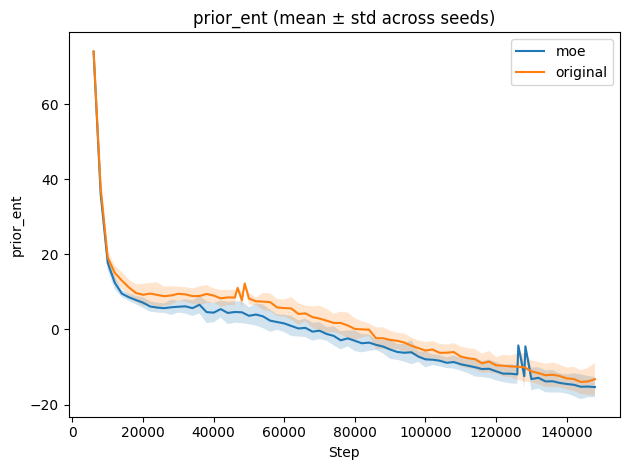

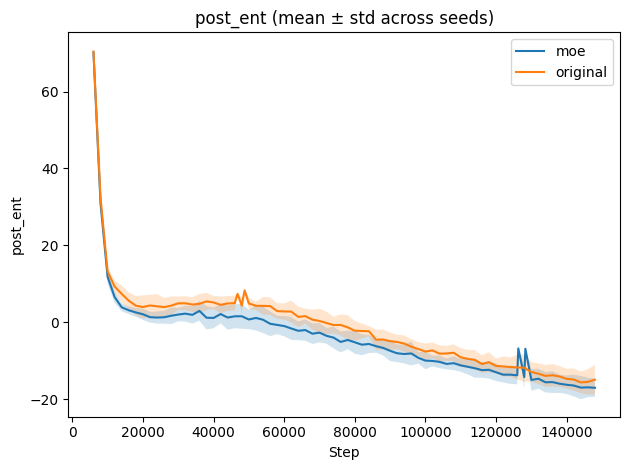

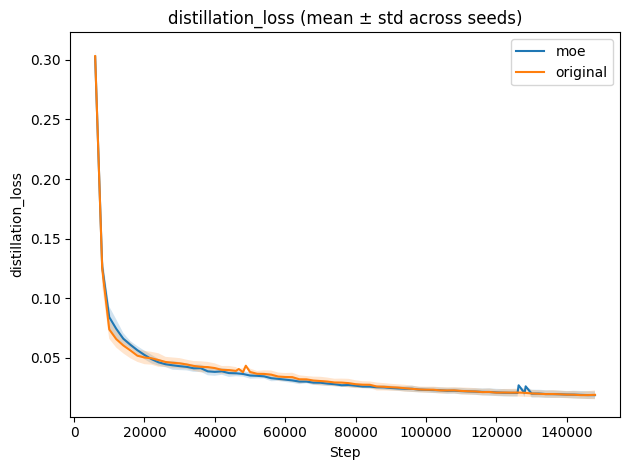

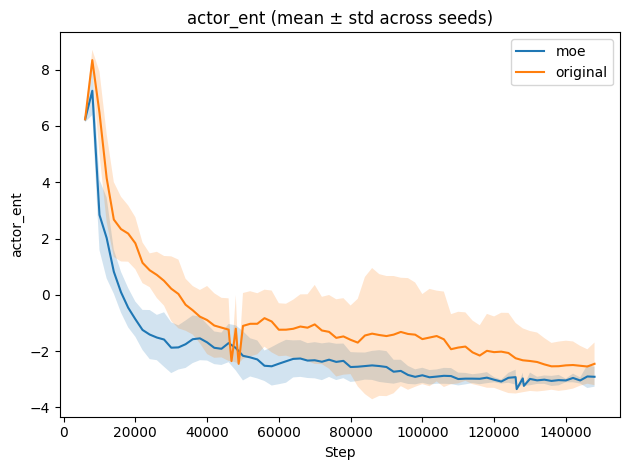

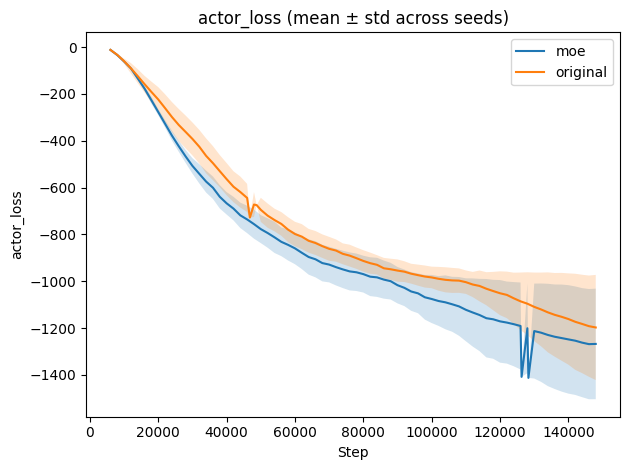

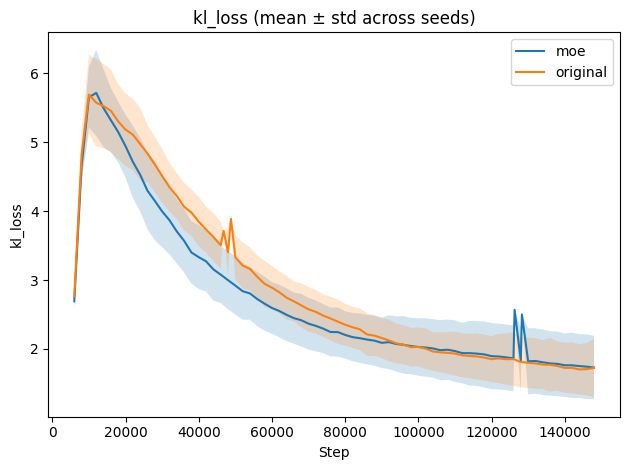

In [7]:
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

# Adjust this to your experiment directory
BASE_DIR = "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/drawer_open_tier10"

# Any metrics you care about:
TARGET_KEYS = [
    "prior_ent",
    "post_ent",
    "distillation_loss",
    "actor_ent",
    "actor_loss",
    "kl_loss",
]


def load_metrics(seed_path, target_keys):
    metrics_file = os.path.join(seed_path, "metrics.jsonl")
    if not os.path.exists(metrics_file):
        print(f"⚠ No metrics file in {seed_path}")
        return None

    # key -> list[(step, value)]
    metric_data = {k: [] for k in target_keys}

    with open(metrics_file, "r") as f:
        for line in f:
            if not line.strip():
                continue
            entry = json.loads(line)

            step = entry.get("step")
            if step is None:
                continue

            for k in target_keys:
                if k in entry and entry[k] is not None:
                    metric_data[k].append((step, entry[k]))

    # Optional: print which keys actually had data in this seed
    non_empty = [k for k, v in metric_data.items() if len(v) > 0]
    print(f"Seed {seed_path} has data for: {non_empty}")

    return metric_data


def collect_group(prefix, target_keys):
    """
    prefix: e.g. 'moe_seed' or 'original_seed'
    """
    seeds = [
        os.path.join(BASE_DIR, d)
        for d in os.listdir(BASE_DIR)
        if d.startswith(prefix) and os.path.isdir(os.path.join(BASE_DIR, d))
    ]

    print(f"\n[{prefix}] Found seeds:")
    for s in seeds:
        print("  -", s)

    # combined[key][step] -> list of values (one per seed)
    combined = {k: defaultdict(list) for k in target_keys}

    for seed in seeds:
        seed_data = load_metrics(seed, target_keys)
        if seed_data is None:
            continue

        for key, records in seed_data.items():
            for step, value in records:
                combined[key][step].append(value)

    # aggregate into mean/std arrays
    aggregated = {}
    for key in target_keys:
        steps = sorted(combined[key].keys())
        if not steps:
            aggregated[key] = (np.array([]), np.array([]), np.array([]))
            continue

        mean = np.array([np.mean(combined[key][s]) for s in steps])
        std = np.array([np.std(combined[key][s]) for s in steps])
        aggregated[key] = (np.array(steps), mean, std)

    return aggregated


def plot_metric(metric_name, moe_stats, orig_stats):
    steps_m, mean_m, std_m = moe_stats
    steps_o, mean_o, std_o = orig_stats

    if len(steps_m) == len(steps_o) == 0:
        print(f"⚠ Skipping {metric_name}: no data in moe or original")
        return

    plt.figure()
    if len(steps_m) > 0:
        plt.plot(steps_m, mean_m, label="moe")
        plt.fill_between(steps_m, mean_m - std_m, mean_m + std_m, alpha=0.2)

    if len(steps_o) > 0:
        plt.plot(steps_o, mean_o, label="original")
        plt.fill_between(steps_o, mean_o - std_o, mean_o + std_o, alpha=0.2)

    plt.title(f"{metric_name} (mean ± std across seeds)")
    plt.xlabel("Step")
    plt.ylabel(metric_name)
    plt.legend()
    plt.tight_layout()


# ===================== Run =====================

moe_stats = collect_group("moe_seed", TARGET_KEYS)
orig_stats = collect_group("original_seed", TARGET_KEYS)

for metric in TARGET_KEYS:
    plot_metric(metric, moe_stats[metric], orig_stats[metric])

plt.show()


Available keys: ['image', 'reward', 'is_first', 'is_last', 'is_terminal', 'success', 'discount', 'action', 'logprob']
Episode length: 151
Image shape: (151, 64, 64, 3)
Action shape: (151, 4)
Total reward: 2603.58349609375


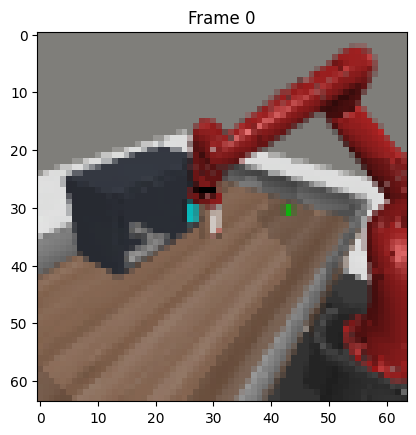

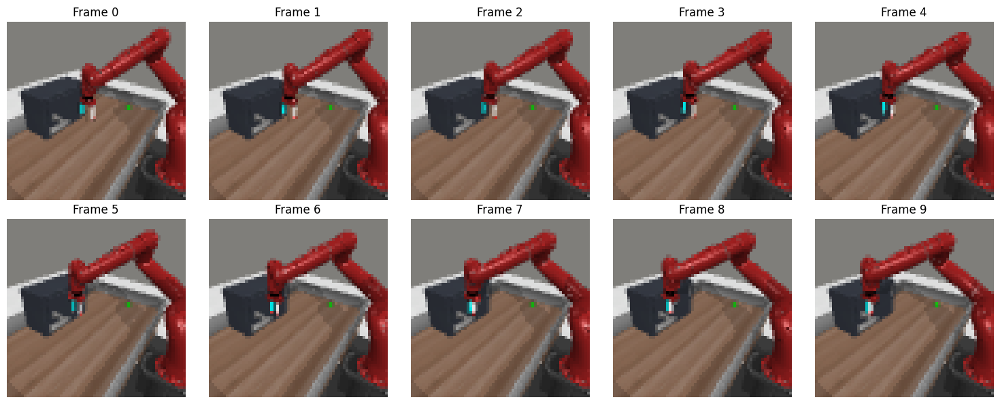

In [3]:
import numpy as np
import matplotlib.pyplot as plt

# Load the episode file
episode = np.load('/storage/ssd1/richtsai1103/vid2act/pretrain/metaworld/pretrain_data/top50/dreamer_door-open/20251120T061612-60cf13679ac24c7c9c44a4900c39f92f-151.npz')

# See all available keys
print("Available keys:", episode.files)

# Access specific attributes
images = episode['image']  # Shape: (T, H, W, C) where T is episode length
actions = episode['action']
rewards = episode['reward']
discount = episode['discount']

print(f"Episode length: {len(rewards)}")
print(f"Image shape: {images.shape}")
print(f"Action shape: {actions.shape}")
print(f"Total reward: {rewards.sum()}")


# Display a single frame
plt.imshow(images[0])  # First frame
plt.title('Frame 0')
plt.show()

# Display multiple frames
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for idx, ax in enumerate(axes.flat):
    if idx < len(images):
        ax.imshow(images[idx])
        ax.set_title(f'Frame {idx}')
        ax.axis('off')
plt.tight_layout()
plt.show()

In [1]:
import glob
import pandas as pd
import matplotlib.pyplot as plt

def average_and_plot_seeds(path_pattern, title="Average Incident Percentage Across Seeds"):
    """
    Loads all CSV files matching the path pattern, averages their percentage
    columns by Step, plots the averaged curves, and returns the averaged DataFrame.

    Example:
        average_and_plot_seeds(
            "/storage/.../moe_seed*/incident_counts.csv"
        )
    """
    # Find all matching seed CSVs
    file_paths = sorted(glob.glob(path_pattern))
    if len(file_paths) == 0:
        raise FileNotFoundError(f"No CSV files found for pattern: {path_pattern}")

    print(f"Found {len(file_paths)} seed files:")
    for f in file_paths:
        print("  -", f)

    # Load all seed CSVs
    dfs = [pd.read_csv(f) for f in file_paths]

    # Combine all CSVs into one big DF
    full_df = pd.concat(dfs, axis=0)

    # Extract all percentage columns
    percentage_cols = [col for col in full_df.columns if col.startswith("Percentage_")]
    if not percentage_cols:
        raise ValueError("No columns starting with 'Percentage_' were found.")

    # Average across seeds → group by Step
    avg_df = (
        full_df.groupby("Step")[percentage_cols]
        .mean()
        .reset_index()
    )

    # --- Plot using NumPy arrays to avoid the pandas indexing issue ---
    x = avg_df["Step"].to_numpy()

    plt.figure(figsize=(10, 6))
    for col in percentage_cols:
        # Ensure numeric & 1D
        y = pd.to_numeric(avg_df[col], errors="coerce").to_numpy()
        plt.plot(x, y, label=col)

    plt.xlabel("Step")
    plt.ylabel("Average Percentage")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()

    return avg_df

Found 5 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed789/incident_counts.csv


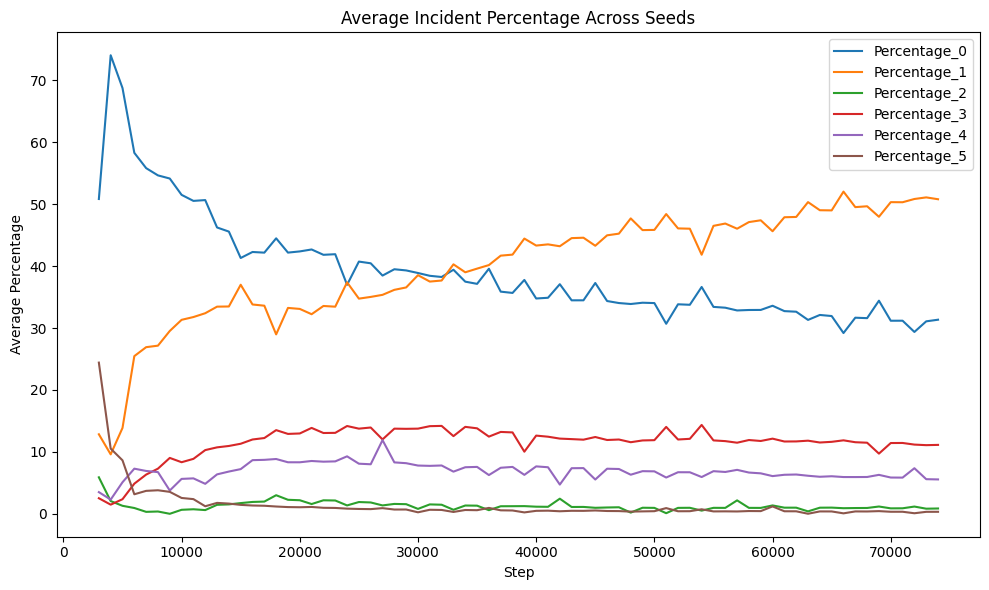

Found 6 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed2024fix/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed789/incident_counts.csv


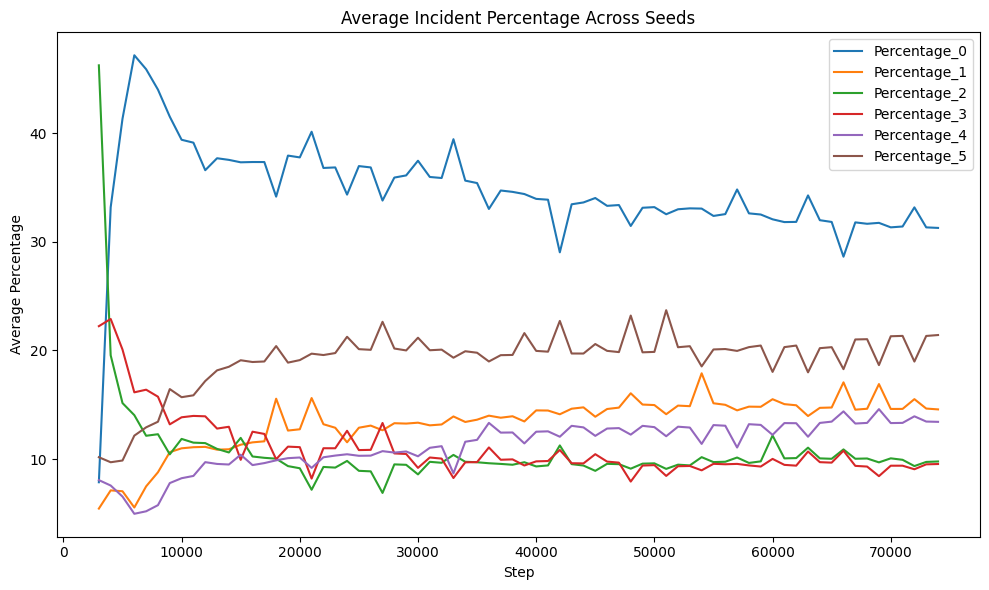

In [9]:
avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_seed*/incident_counts.csv"
)

avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_seed*/incident_counts.csv"
)

Found 5 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed789/incident_counts.csv


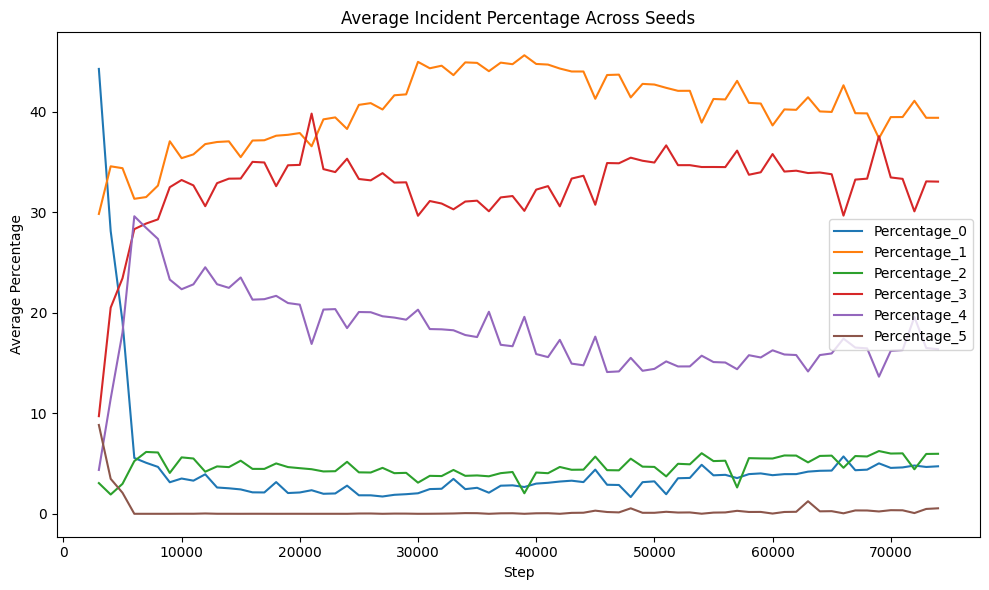

Found 5 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed789/incident_counts.csv


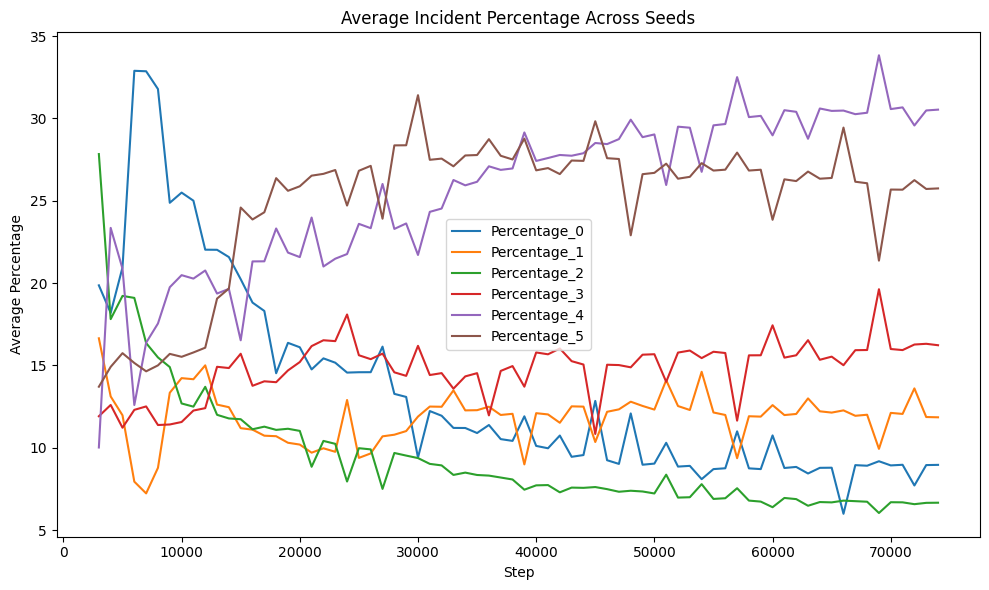

In [10]:
avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_seed*/incident_counts.csv"
)

avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_seed*/incident_counts.csv"
)

Found 5 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed789/incident_counts.csv


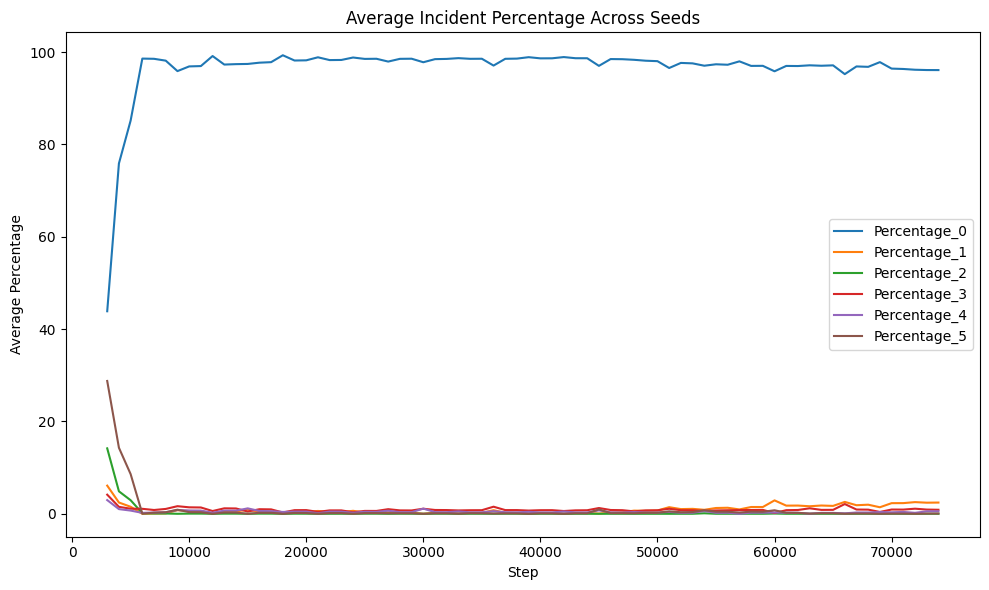

Found 5 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed789/incident_counts.csv


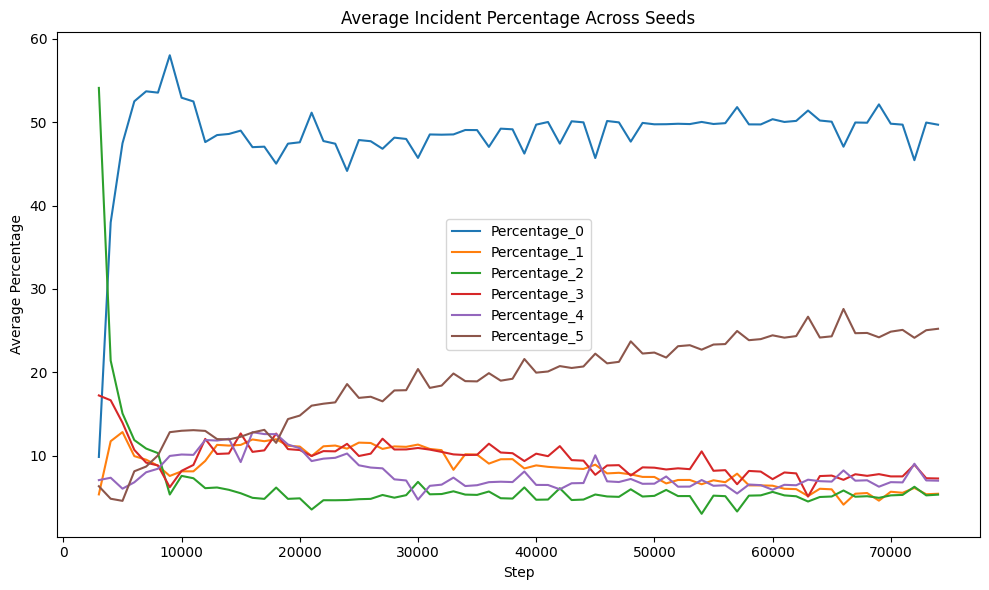

In [11]:
avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_seed*/incident_counts.csv"
)

avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_seed*/incident_counts.csv"
)

Found 5 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed789/incident_counts.csv


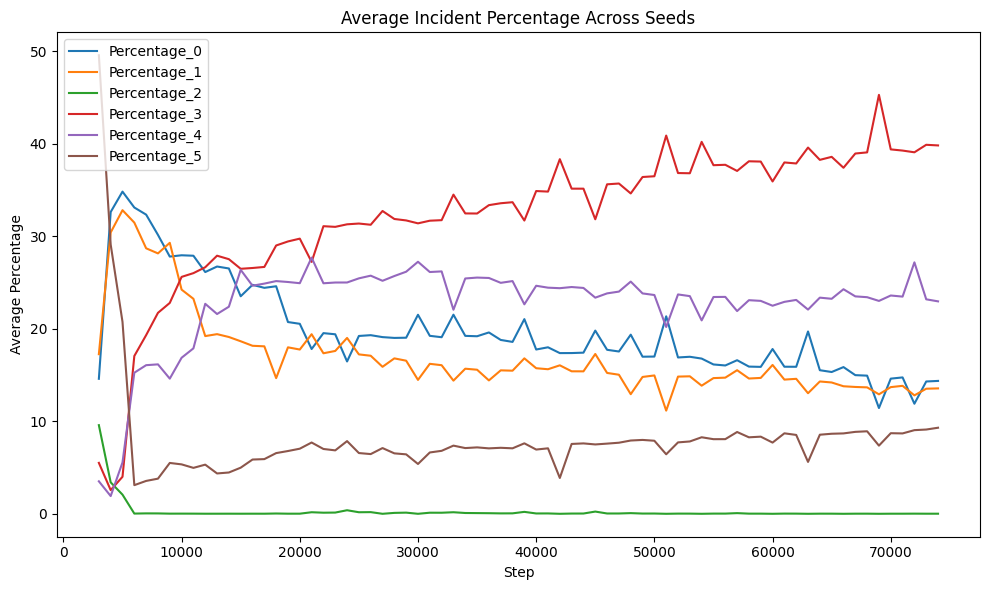

Found 5 seed files:
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed0/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed123/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed2024/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed456/incident_counts.csv
  - /storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed789/incident_counts.csv


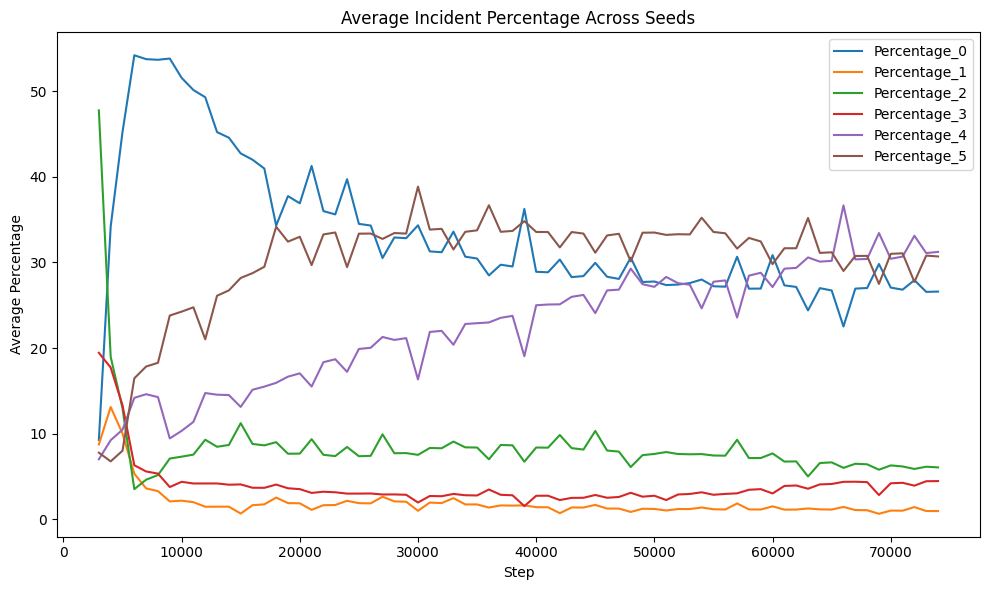

In [12]:
avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_seed*/incident_counts.csv"
)

avg_df = average_and_plot_seeds(
   "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_seed*/incident_counts.csv"
)

In [1]:
def analyze_training_metrics(
    metrics_path: str,
    step_key: str = "step",
    plot: bool = True,
    smooth: int = 0,          # e.g., 50 for rolling mean
    max_points: int = 20000,  # downsample for plotting if file is huge
    eps: float = 1e-12,
):
    """
    Minimal + robust JSONL metrics analyzer for multi-teacher distillation.

    Loads metrics.jsonl -> DataFrame, cleans step + distill/* columns, computes:
      Raw (df):
        - distill/mean_w_sum
        - distill/collapse_index = max(w)/mean(w)
        - distill/alignment_corr = corr(w, -mse) across teachers per step
        - per-teacher distill/eff_k = w_k/(mse_k+eps)
        - per-teacher distill/ignored_good_k (low MSE but low weight)
        - distill/ignored_good_rate

      Smoothed view (df_s) for plotting:
        IMPORTANT: derived metrics are recomputed FROM smoothed base columns,
        so mean_w_sum matches your original behavior: sum(rolling(mean_w_i)).

    Returns: (df, summary)
    """
    import json
    import numpy as np
    import pandas as pd
    import re

    # -------------------- load --------------------
    rows = []
    with open(metrics_path, "r") as f:
        for line in f:
            line = line.strip()
            if line:
                rows.append(json.loads(line))
    if not rows:
        raise ValueError(f"No JSON lines found in {metrics_path}")
    df = pd.DataFrame(rows)

    # -------------------- helpers --------------------
    def _scalarize(x):
        if isinstance(x, (list, tuple, np.ndarray)):
            return x[0] if len(x) else np.nan
        return x

    def _indexed_cols(frame, prefix):
        # only prefix + integer index, e.g., distill/mean_w_0
        pat = re.compile(rf"^{re.escape(prefix)}(\d+)$")
        cols = []
        for c in frame.columns:
            m = pat.match(c)
            if m:
                cols.append((int(m.group(1)), c))
        cols.sort(key=lambda x: x[0])
        return [c for _, c in cols]

    def _downsample_xy(x, y, max_n):
        x = np.asarray(x).reshape(-1)
        y = np.asarray(y).reshape(-1)
        mask = np.isfinite(x) & np.isfinite(y)
        x, y = x[mask], y[mask]
        if len(x) <= max_n:
            return x, y
        idx = np.linspace(0, len(x) - 1, max_n).astype(int)
        return x[idx], y[idx]

    def _indices_map(cols, prefix):
        # cols must be like f"{prefix}{i}"
        out = {}
        for c in cols:
            out[int(c.split(prefix)[1])] = c
        return out

    # -------------------- step cleaning --------------------
    if step_key not in df.columns:
        for alt in ("global_step", "train/step", "trainer/global_step", "iter", "iteration"):
            if alt in df.columns:
                df[step_key] = df[alt]
                break
        else:
            df[step_key] = np.arange(len(df), dtype=np.int64)

    df[step_key] = df[step_key].map(_scalarize)
    df[step_key] = pd.to_numeric(df[step_key], errors="coerce")
    df = df.dropna(subset=[step_key]).copy()
    df = df.sort_values(step_key).reset_index(drop=True)

    # -------------------- distill column cleaning --------------------
    distill_cols = [c for c in df.columns if c.startswith("distill/")]
    for c in distill_cols:
        df[c] = df[c].map(_scalarize)
        df[c] = pd.to_numeric(df[c], errors="coerce")

    # teacher-indexed base columns
    w_cols = _indexed_cols(df, "distill/mean_w_")
    mse_cols = _indexed_cols(df, "distill/mse_")
    contrib_cols = _indexed_cols(df, "distill/contrib_")

    w_map = _indices_map(w_cols, "distill/mean_w_") if w_cols else {}
    mse_map = _indices_map(mse_cols, "distill/mse_") if mse_cols else {}
    common_idx = sorted(set(w_map.keys()) & set(mse_map.keys()))

    # -------------------- derived metrics on RAW df --------------------
    if w_cols:
        df["distill/mean_w_sum"] = df[w_cols].sum(axis=1)
        df["distill/collapse_index"] = df[w_cols].max(axis=1) / (df[w_cols].mean(axis=1) + eps)

    if common_idx:
        w_mat = np.vstack([df[w_map[i]].to_numpy() for i in common_idx]).T  # [T, K]
        mse_mat = np.vstack([df[mse_map[i]].to_numpy() for i in common_idx]).T

        # alignment corr per step: corr(w, -mse) across teachers
        align = np.full(len(df), np.nan, dtype=float)
        for t in range(len(df)):
            wv = w_mat[t, :]
            mv = mse_mat[t, :]
            mask = np.isfinite(wv) & np.isfinite(mv)
            if mask.sum() >= 2:
                a = wv[mask]
                b = (-mv[mask])
                if np.std(a) > 0 and np.std(b) > 0:
                    align[t] = np.corrcoef(a, b)[0, 1]
        df["distill/alignment_corr"] = align

        # per-teacher efficiency + ignored-good
        mse_median = np.nanmedian(mse_mat, axis=1)
        w_median = np.nanmedian(w_mat, axis=1)

        ign_cols = []
        for i in common_idx:
            df[f"distill/eff_{i}"] = df[w_map[i]] / (df[mse_map[i]] + eps)
            ign_col = f"distill/ignored_good_{i}"
            df[ign_col] = (
                (df[mse_map[i]] < mse_median) &
                (df[w_map[i]] < w_median)
            ).astype(float)
            ign_cols.append(ign_col)

        df["distill/ignored_good_rate"] = df[ign_cols].mean(axis=1) if ign_cols else np.nan

    # -------------------- smoothed view for plotting --------------------
    df_s = df.copy()
    if smooth and smooth > 1:
        metric_cols = [c for c in df_s.columns if c != step_key]
        df_s[metric_cols] = df_s[metric_cols].rolling(smooth, min_periods=1).mean()

    # IMPORTANT: recompute derived metrics FROM smoothed base columns (matches your original w_sum behavior)
    if w_cols:
        df_s["distill/mean_w_sum"] = df_s[w_cols].sum(axis=1)
        df_s["distill/collapse_index"] = df_s[w_cols].max(axis=1) / (df_s[w_cols].mean(axis=1) + eps)

    if common_idx:
        w_mat_s = np.vstack([df_s[w_map[i]].to_numpy() for i in common_idx]).T
        mse_mat_s = np.vstack([df_s[mse_map[i]].to_numpy() for i in common_idx]).T

        align_s = np.full(len(df_s), np.nan, dtype=float)
        for t in range(len(df_s)):
            wv = w_mat_s[t, :]
            mv = mse_mat_s[t, :]
            mask = np.isfinite(wv) & np.isfinite(mv)
            if mask.sum() >= 2:
                a = wv[mask]
                b = (-mv[mask])
                if np.std(a) > 0 and np.std(b) > 0:
                    align_s[t] = np.corrcoef(a, b)[0, 1]
        df_s["distill/alignment_corr"] = align_s

        # recompute smoothed ignored_good_rate from smoothed base cols
        mse_median_s = np.nanmedian(mse_mat_s, axis=1)
        w_median_s = np.nanmedian(w_mat_s, axis=1)
        ign_cols_s = []
        for i in common_idx:
            ign_col = f"distill/ignored_good_{i}"
            df_s[ign_col] = (
                (df_s[mse_map[i]] < mse_median_s) &
                (df_s[w_map[i]] < w_median_s)
            ).astype(float)
            ign_cols_s.append(ign_col)
            df_s[f"distill/eff_{i}"] = df_s[w_map[i]] / (df_s[mse_map[i]] + eps)
        df_s["distill/ignored_good_rate"] = df_s[ign_cols_s].mean(axis=1) if ign_cols_s else np.nan

    # -------------------- summary (small) --------------------
    summary = {
        "rows": int(len(df)),
        "step_min": float(df[step_key].min()),
        "step_max": float(df[step_key].max()),
        "n_teachers_common_w_mse": int(len(common_idx)),
        "last_raw": {k: float(df[k].iloc[-1]) for k in [
            "distill/entropy_w", "distill/mean_w_sum", "distill/collapse_index",
            "distill/alignment_corr", "distill/ignored_good_rate"
        ] if k in df.columns and np.isfinite(df[k].iloc[-1])},
    }

    # -------------------- plotting (use df_s) --------------------
    if plot:
        import matplotlib.pyplot as plt

        def plot_series(col, title=None):
            if col not in df_s.columns:
                return
            x = df_s[step_key].to_numpy()
            y = df_s[col].to_numpy()
            x, y = _downsample_xy(x, y, max_points)
            if len(x) == 0:
                return
            plt.figure()
            plt.plot(x, y)
            plt.xlabel(step_key)
            plt.ylabel(col)
            plt.title(title or col)
            plt.show()

        def plot_group(title, cols):
            if not cols:
                return
            plt.figure()
            x = df_s[step_key].to_numpy()
            for c in cols:
                y = df_s[c].to_numpy()
                xd, yd = _downsample_xy(x, y, max_points)
                if len(xd):
                    plt.plot(xd, yd, label=c)
            plt.xlabel(step_key)
            plt.title(title)
            plt.legend()
            plt.show()

        if "distill/entropy_w" in df_s.columns:
            plot_series("distill/entropy_w", "distill/entropy_w (higher = more uniform weights)")
        if "distill/mean_w_sum" in df_s.columns:
            plot_series("distill/mean_w_sum", "Sum of distill/mean_w_* (should be ~1)")
        if "distill/collapse_index" in df_s.columns:
            plot_series("distill/collapse_index", "Collapse index = max(w)/mean(w) (higher = more peaked)")
        if "distill/alignment_corr" in df_s.columns:
            plot_series("distill/alignment_corr", "Alignment corr = corr(w, -mse) (higher = better)")
        if "distill/ignored_good_rate" in df_s.columns:
            plot_series("distill/ignored_good_rate", "Ignored-good rate (fraction of teachers ignored though low MSE)")

        plot_group("distill/mean_w_i", _indexed_cols(df_s, "distill/mean_w_"))
        plot_group("distill/mse_i", _indexed_cols(df_s, "distill/mse_"))
        if contrib_cols:
            plot_group("distill/contrib_i", _indexed_cols(df_s, "distill/contrib_"))
        plot_group("distill/eff_i = w_i/(mse_i+eps)", _indexed_cols(df_s, "distill/eff_"))
        plot_group("distill/ignored_good_i (1=low MSE but low weight)", _indexed_cols(df_s, "distill/ignored_good_"))

    return df, df_s, summary



/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


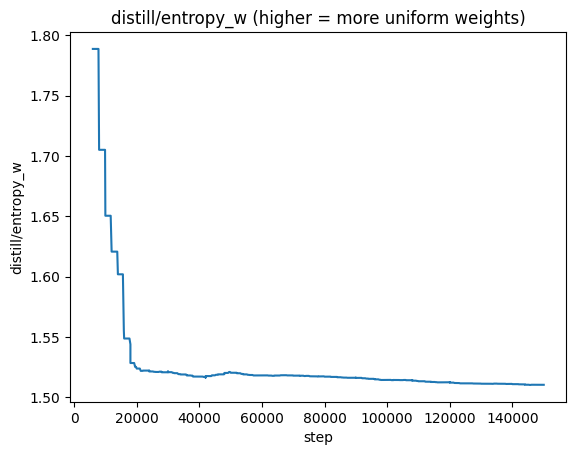

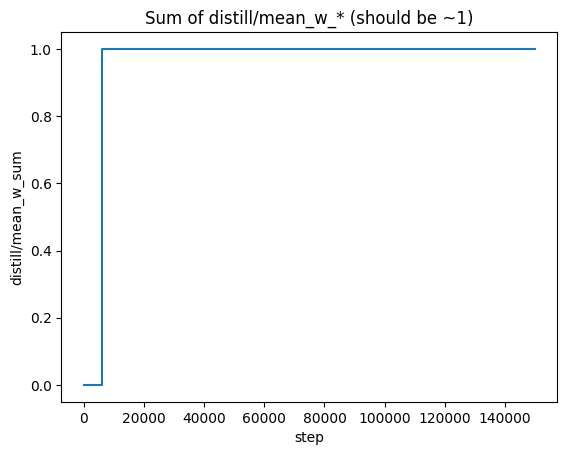

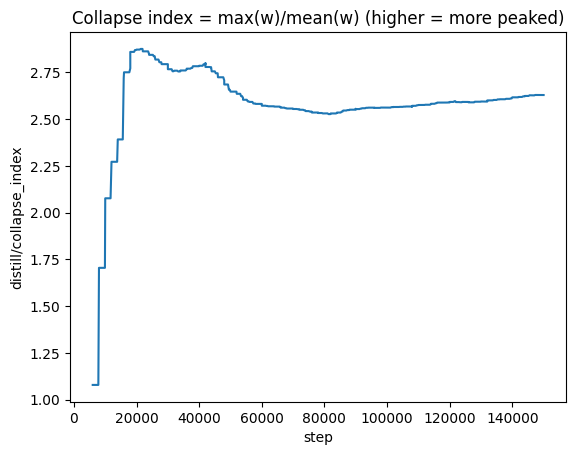

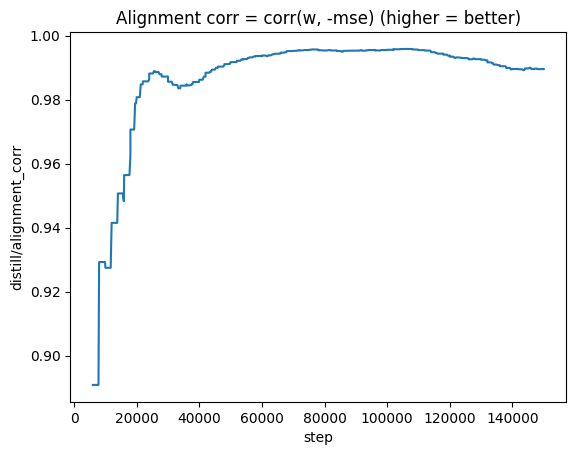

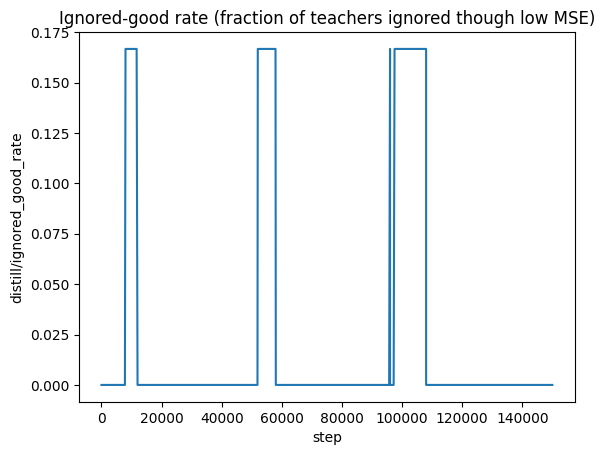

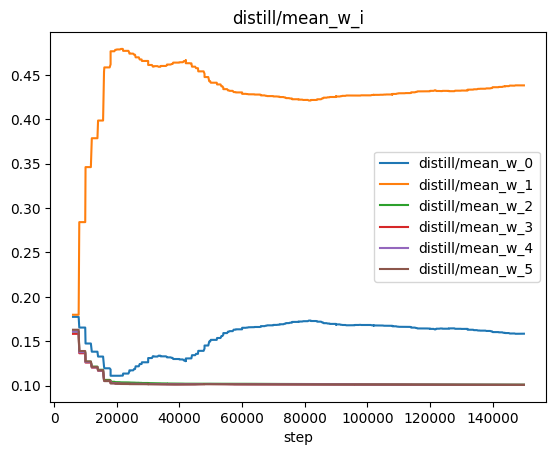

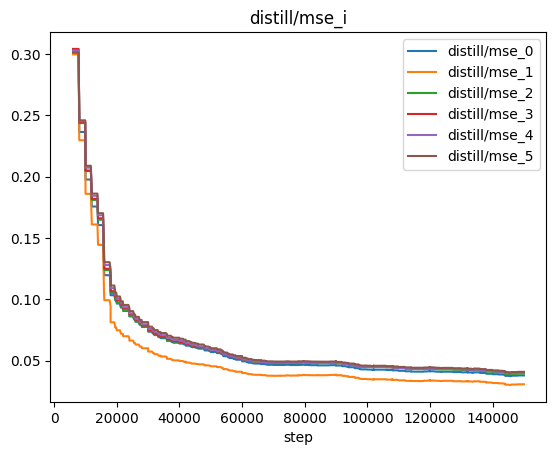

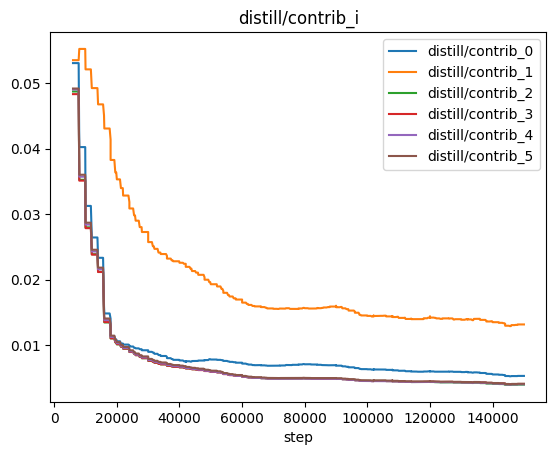

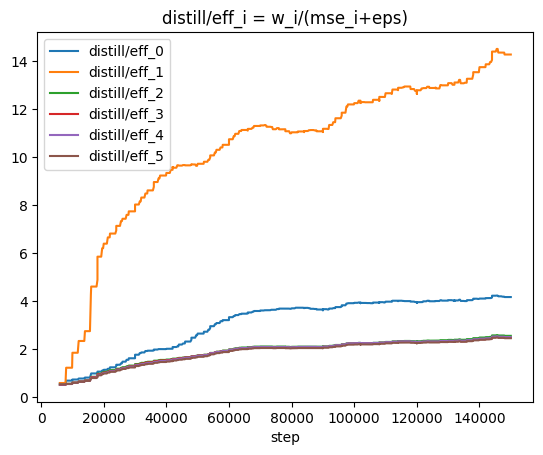

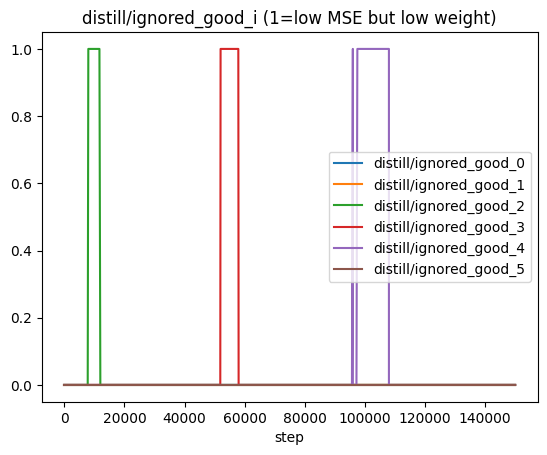

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [2]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_metrics_seed456/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


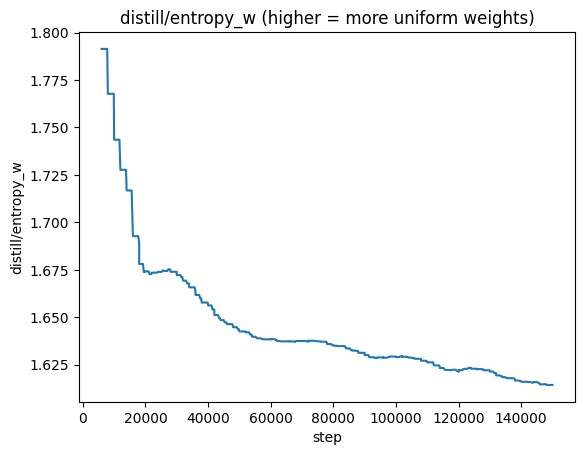

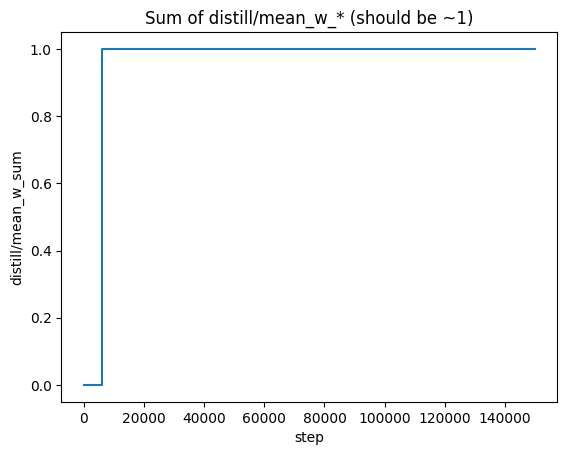

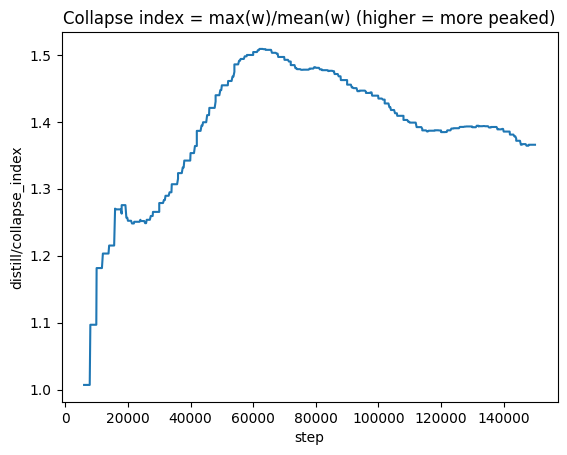

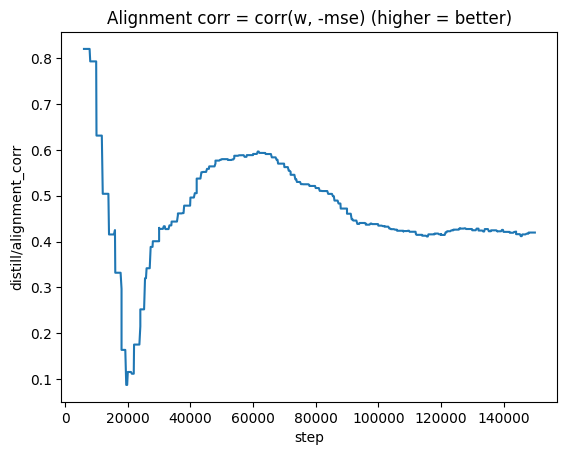

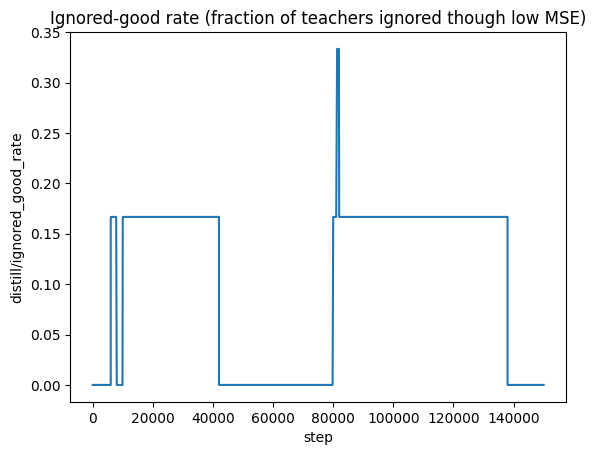

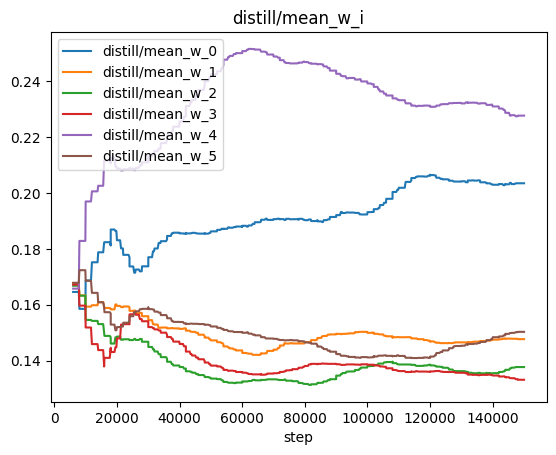

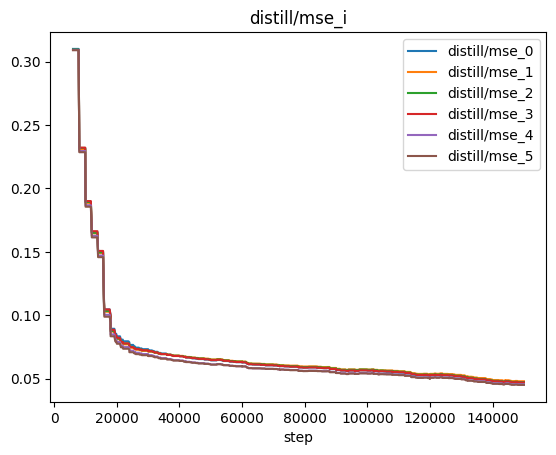

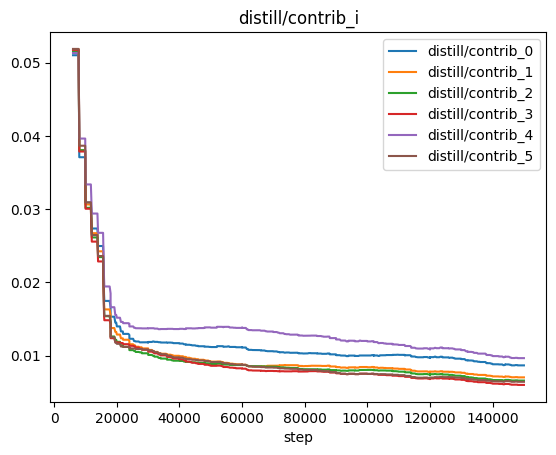

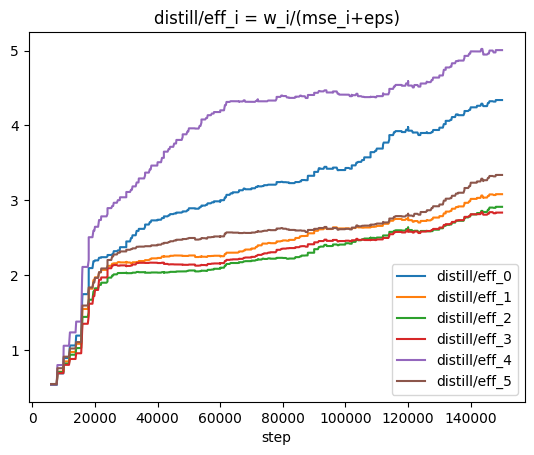

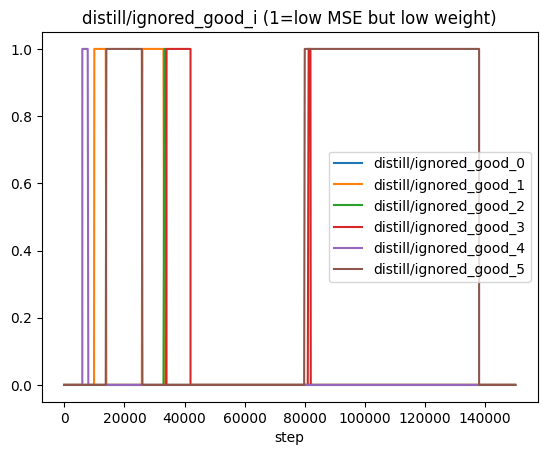

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [3]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_metrics_seed456/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


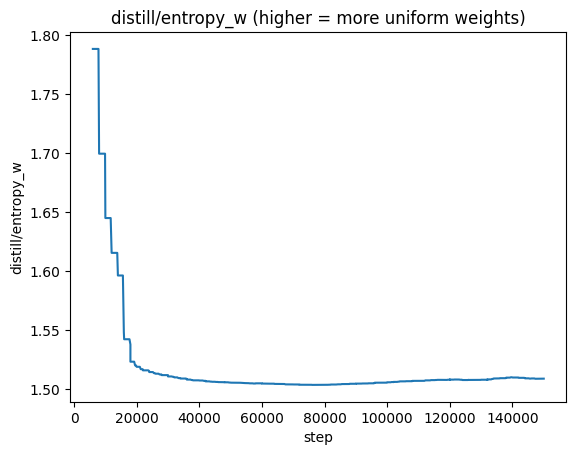

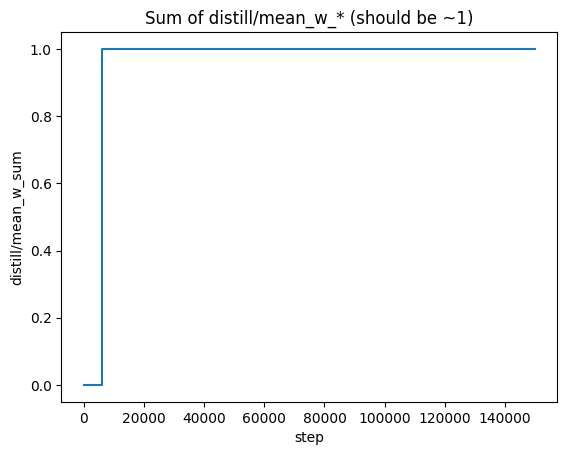

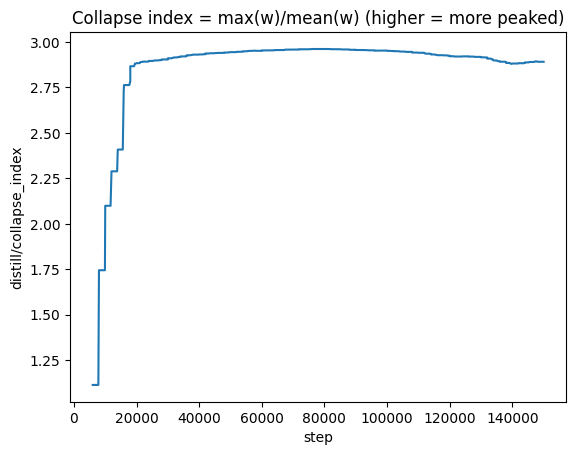

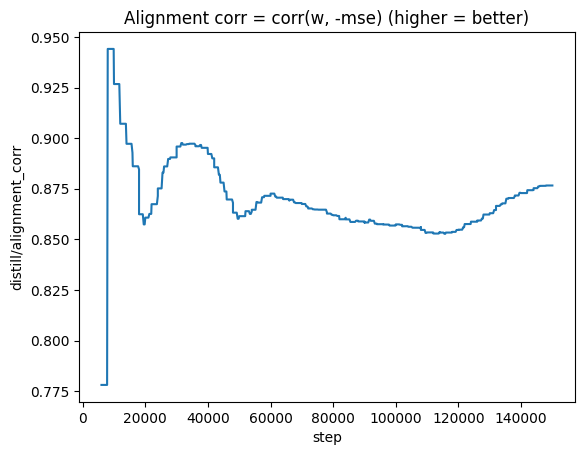

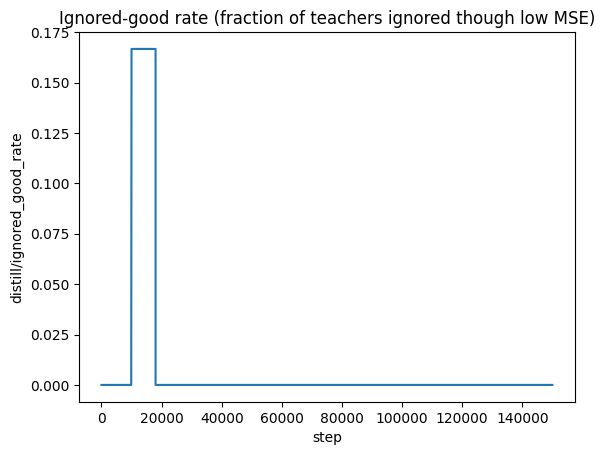

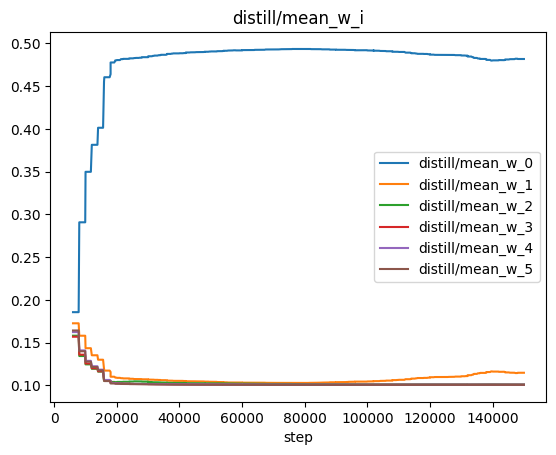

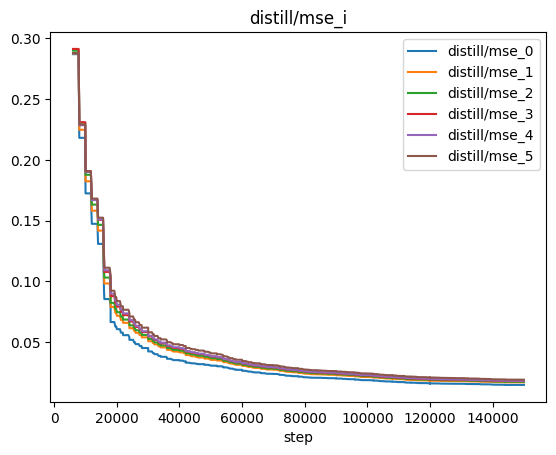

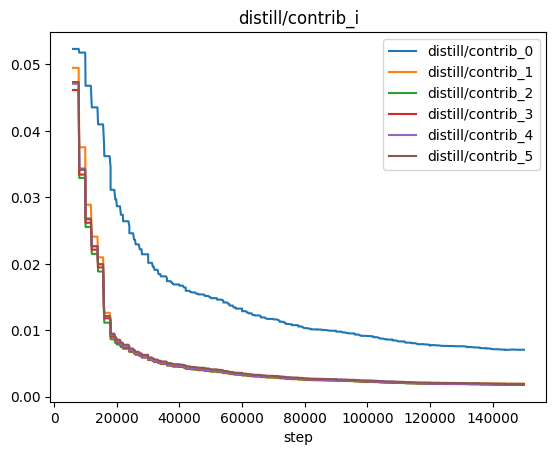

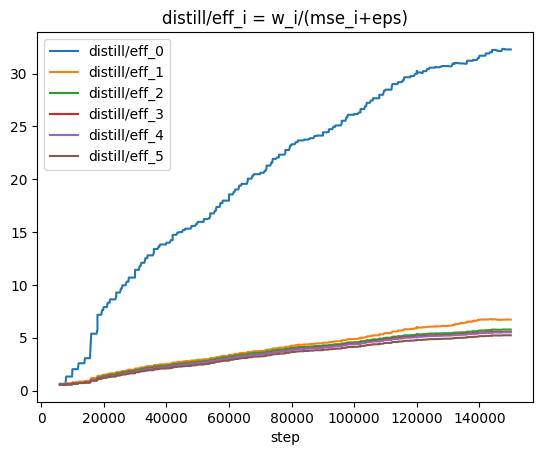

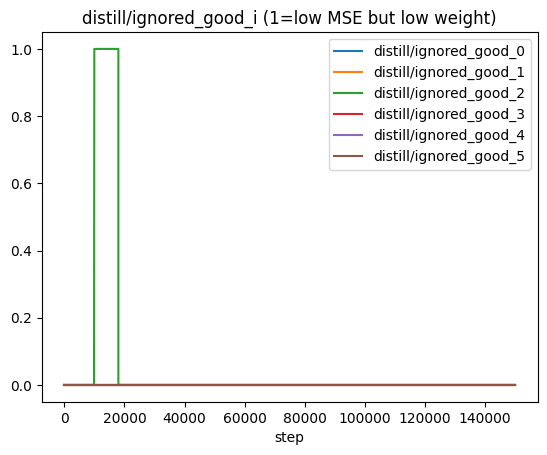

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [4]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_metrics_seed456/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


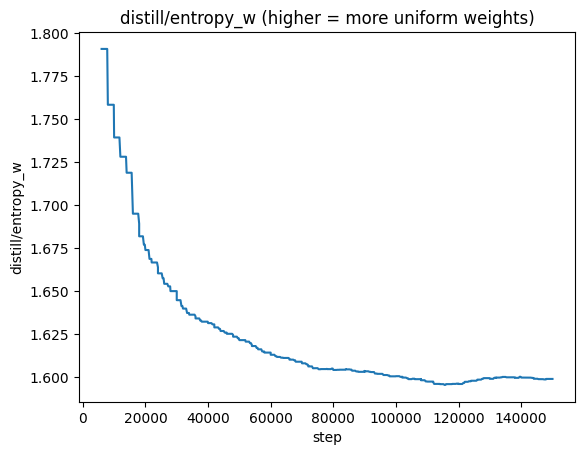

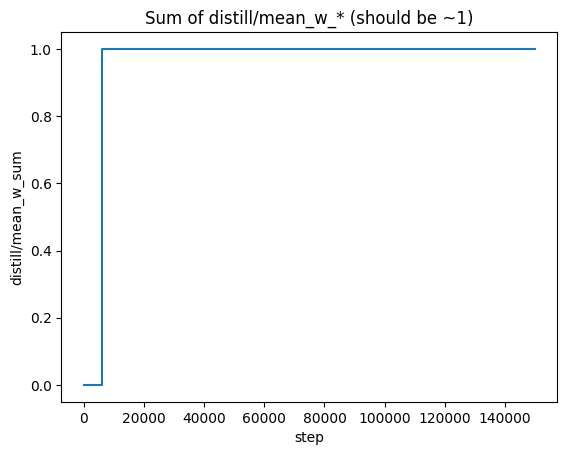

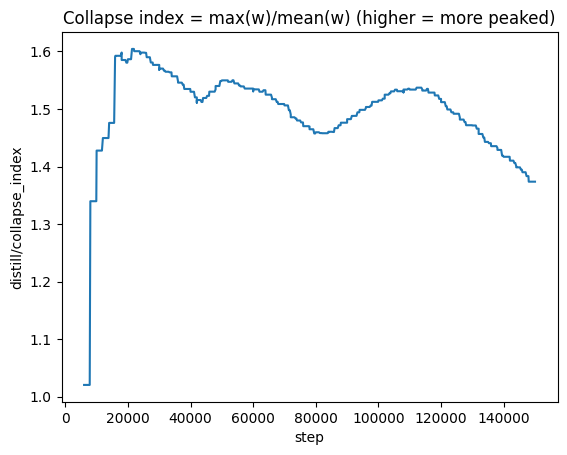

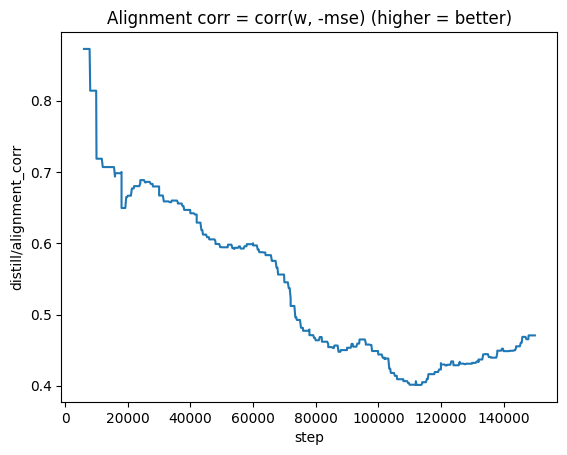

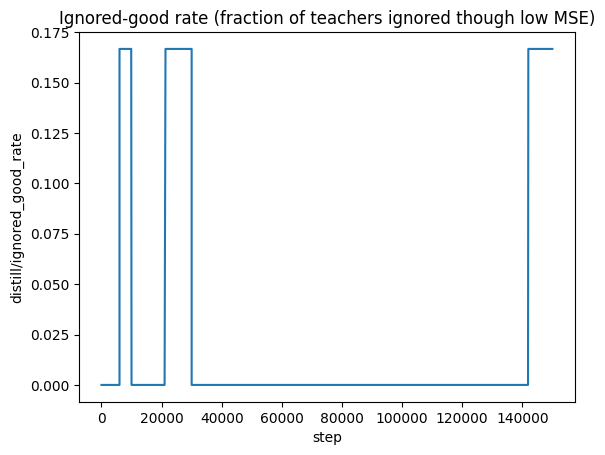

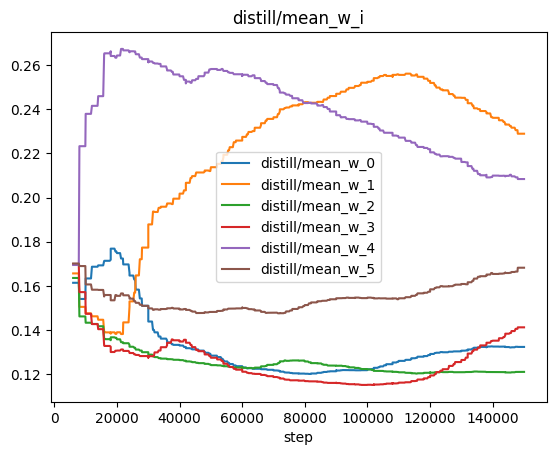

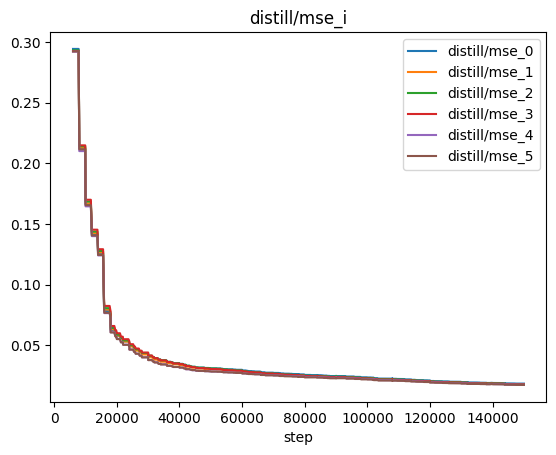

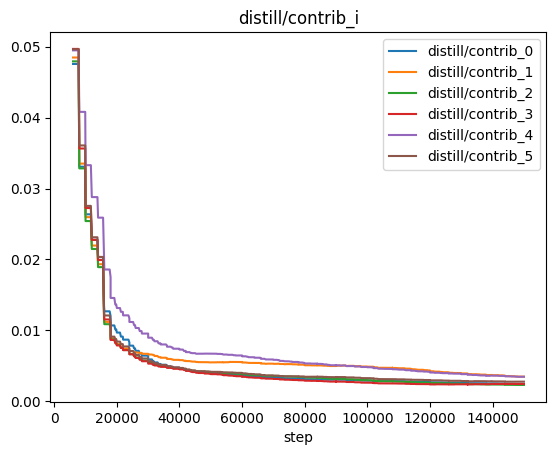

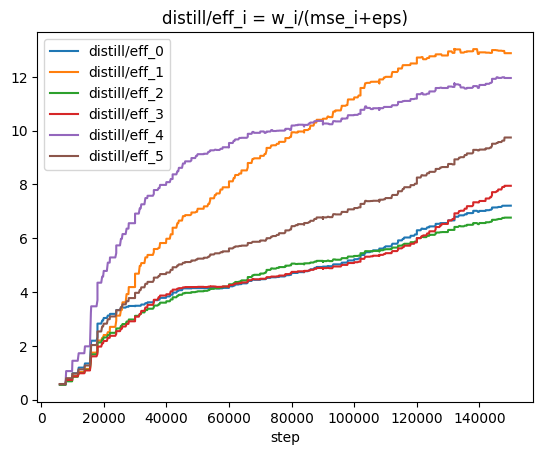

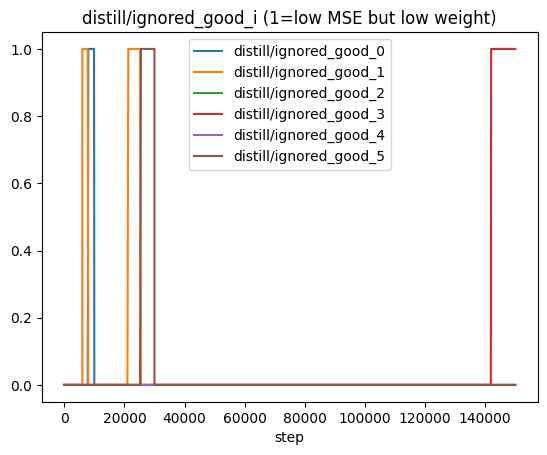

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [5]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_metrics_seed456/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


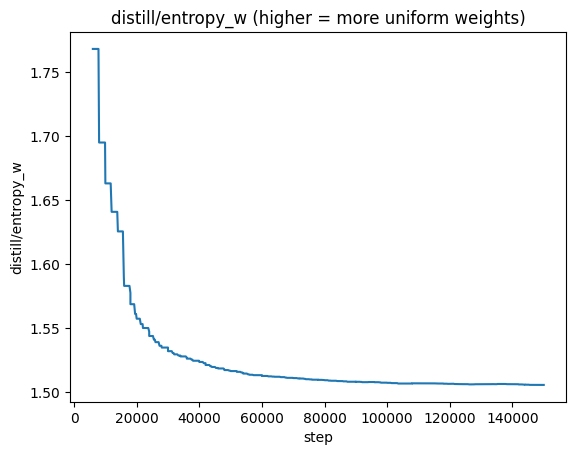

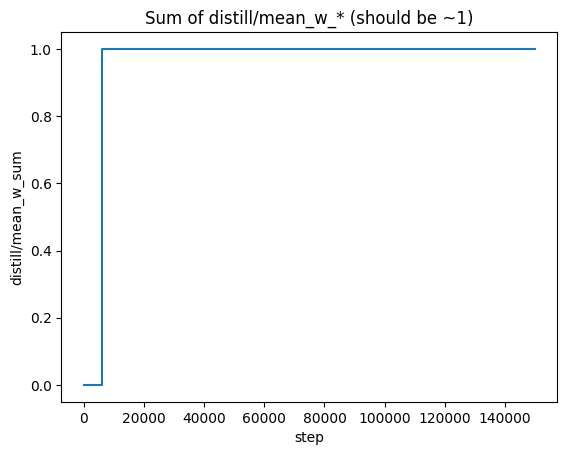

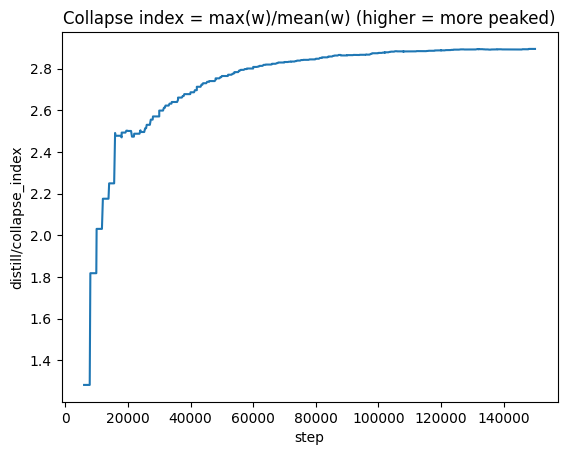

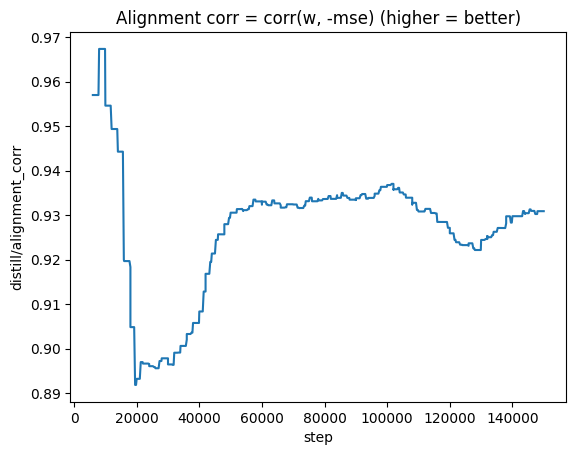

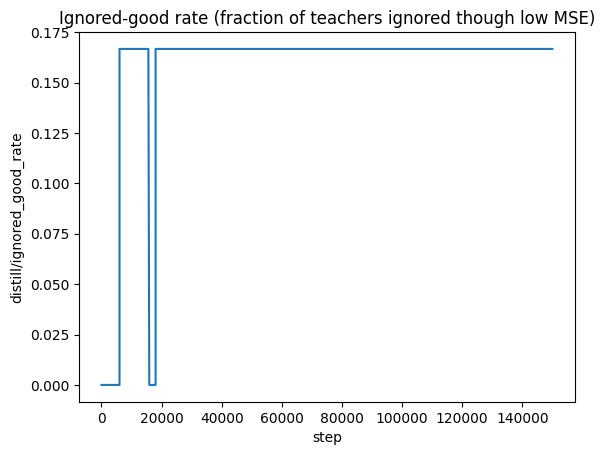

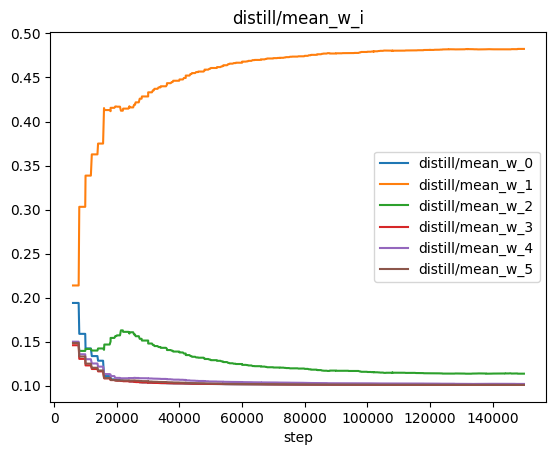

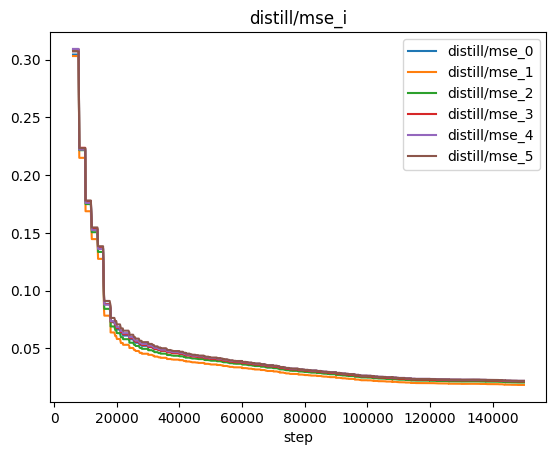

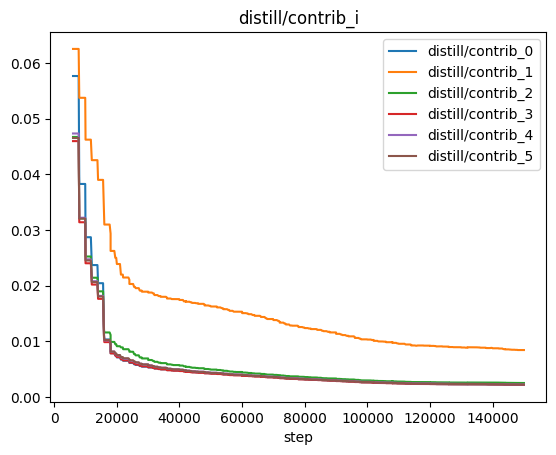

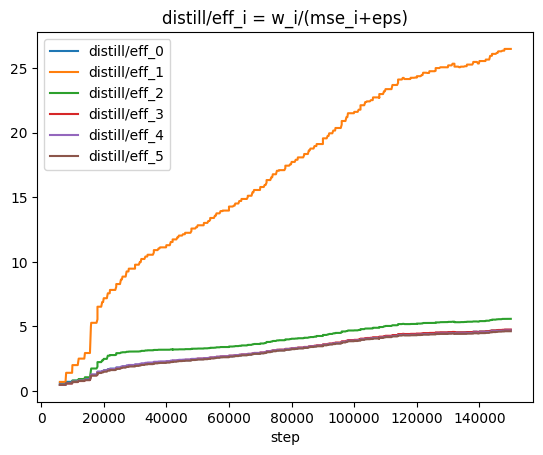

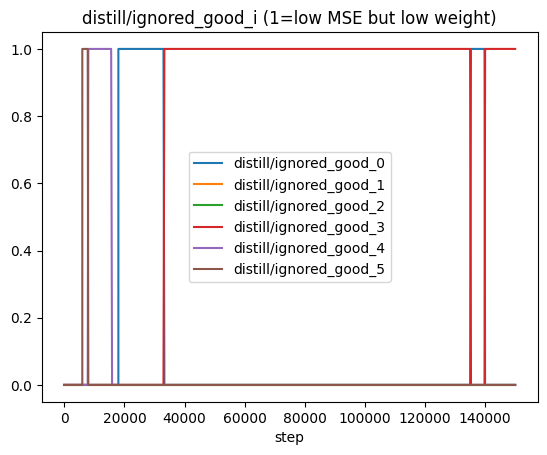

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [6]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_metrics_seed2024/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


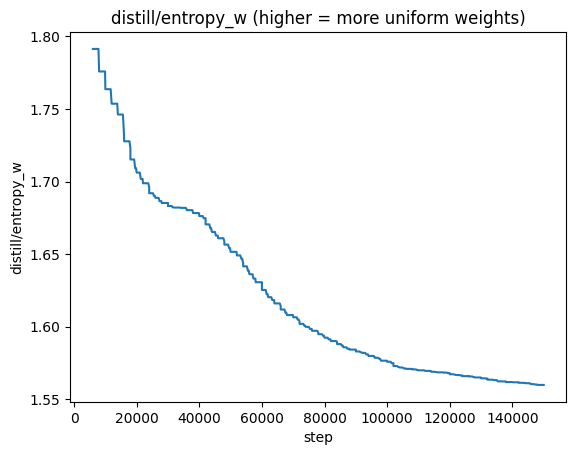

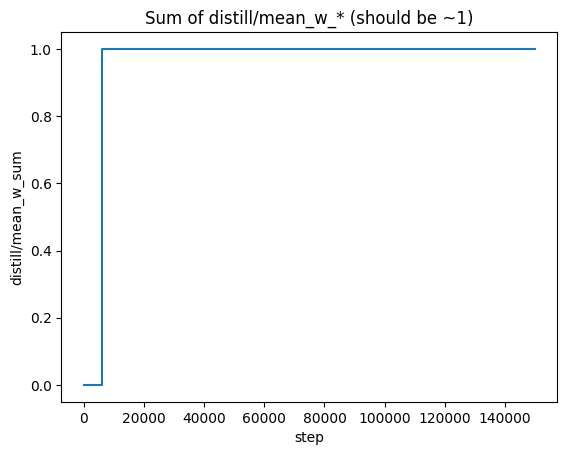

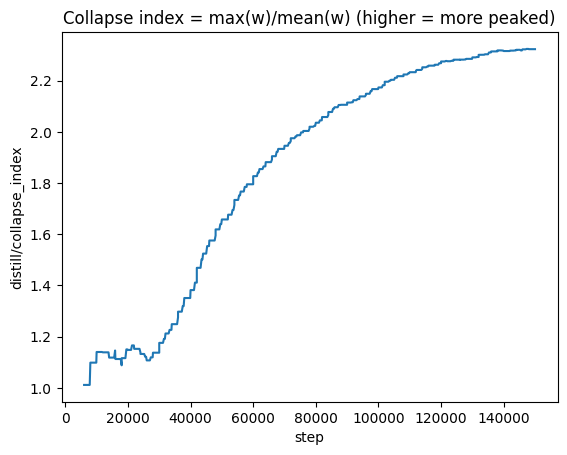

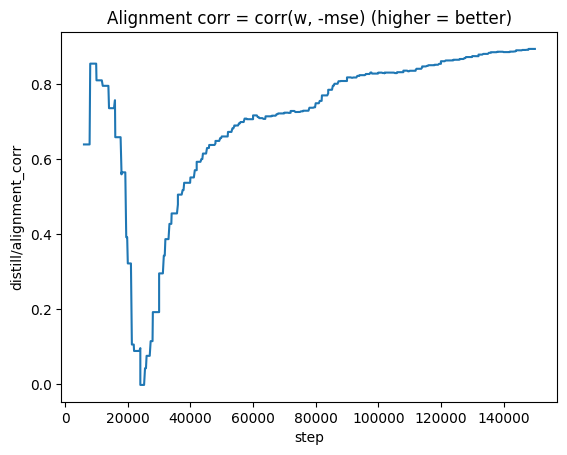

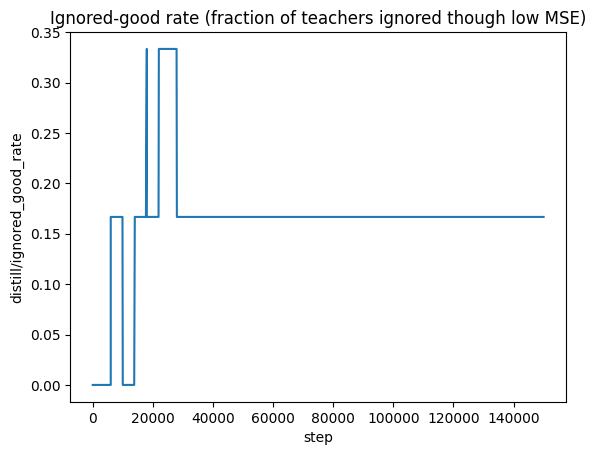

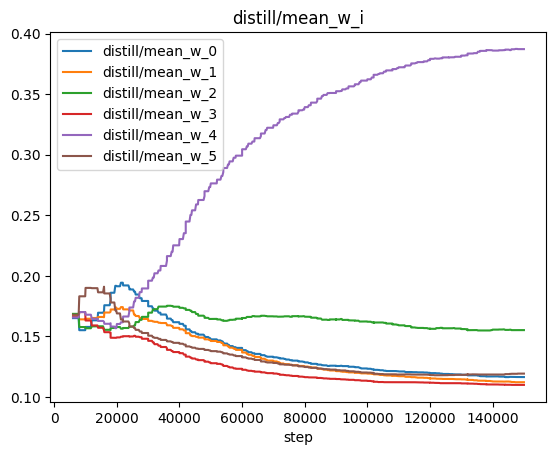

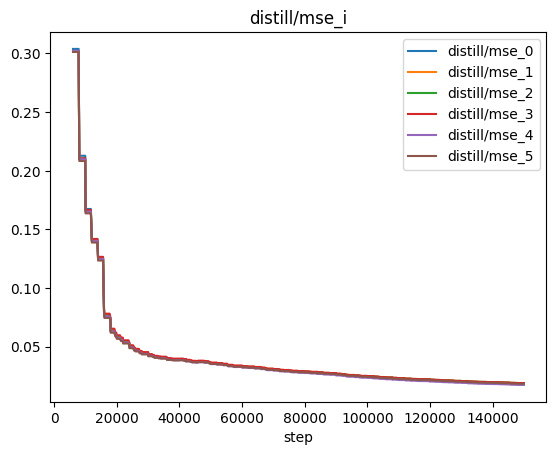

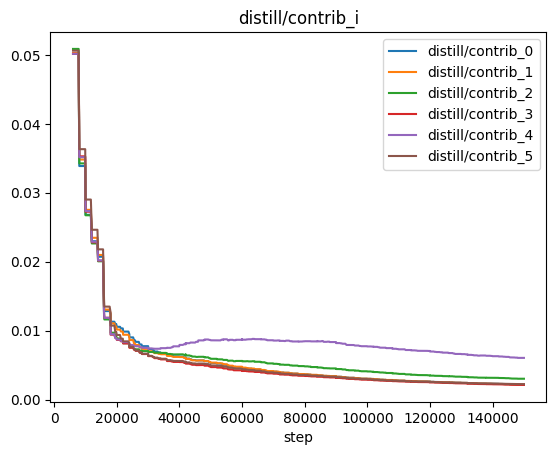

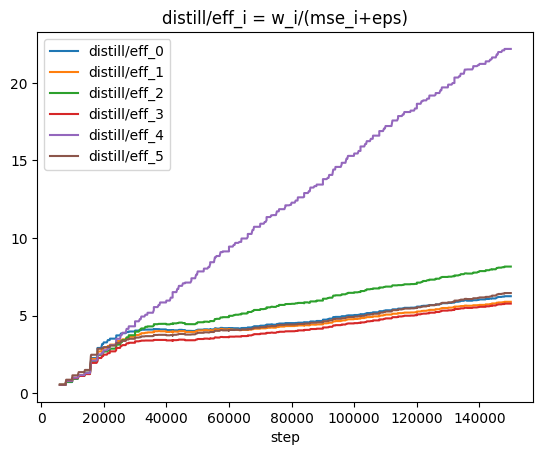

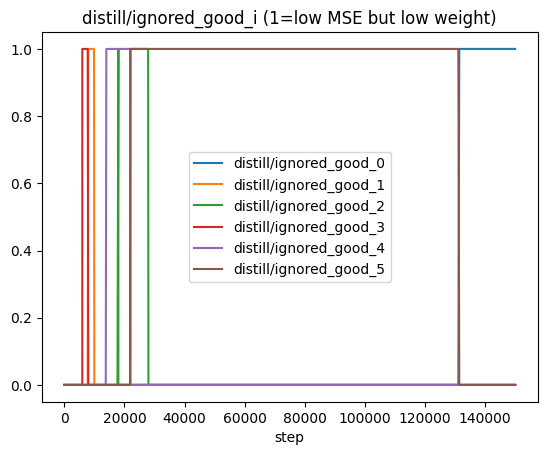

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [7]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_metrics_seed2024/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


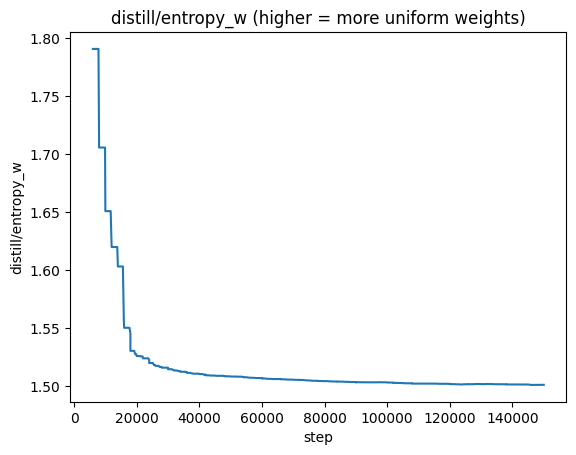

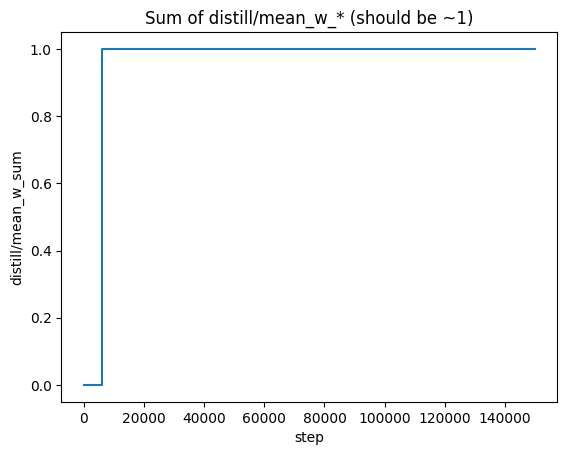

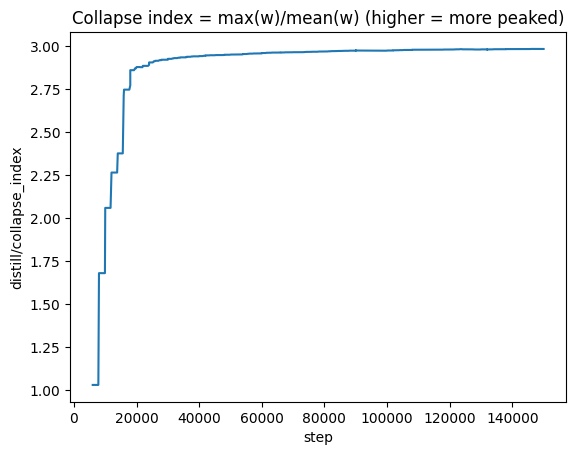

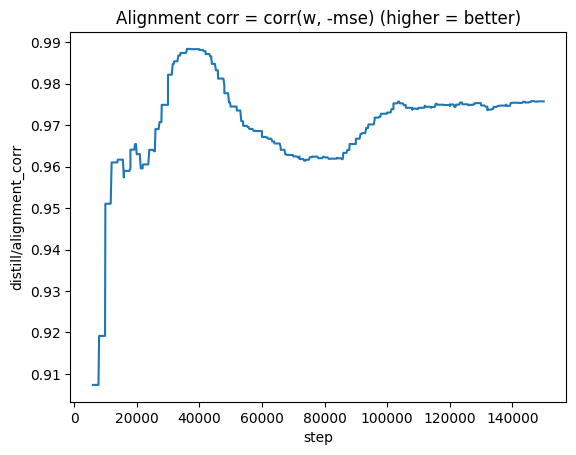

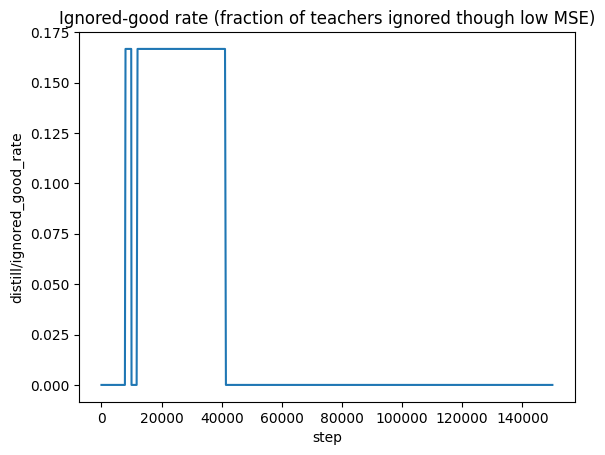

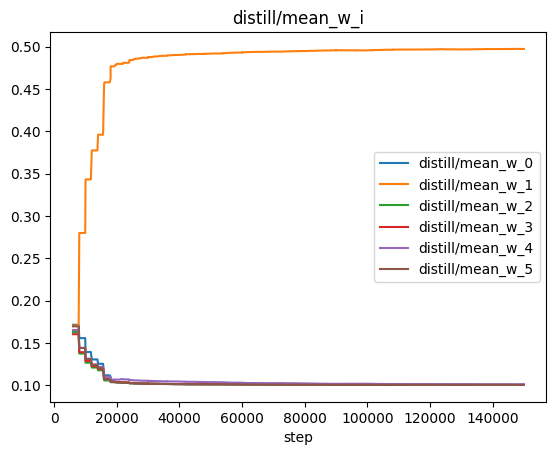

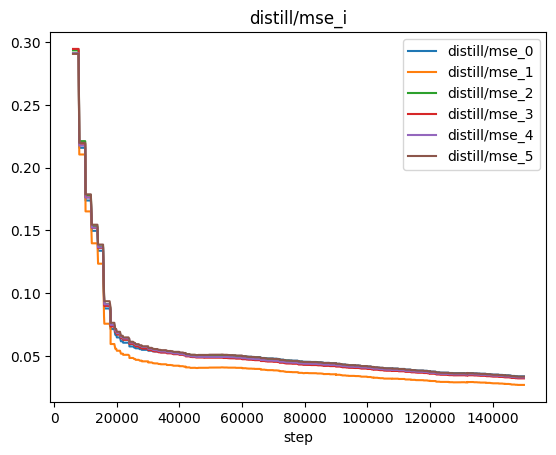

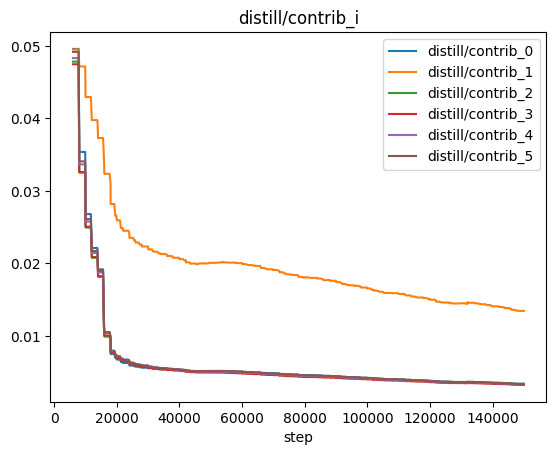

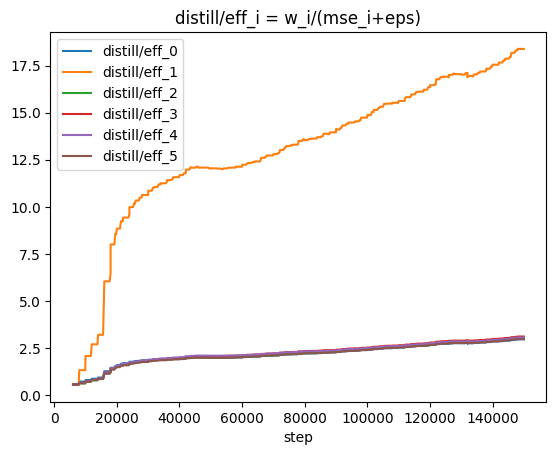

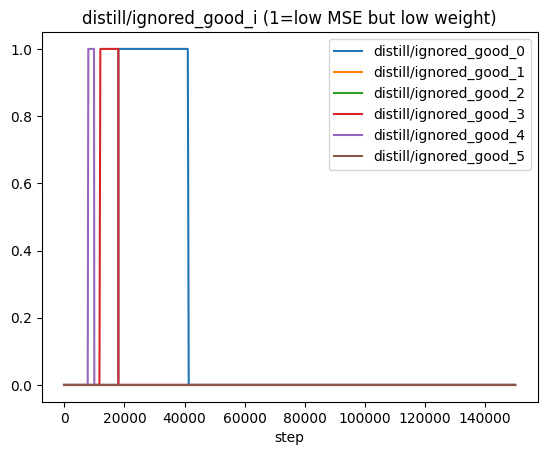

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [8]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_metrics_seed456/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


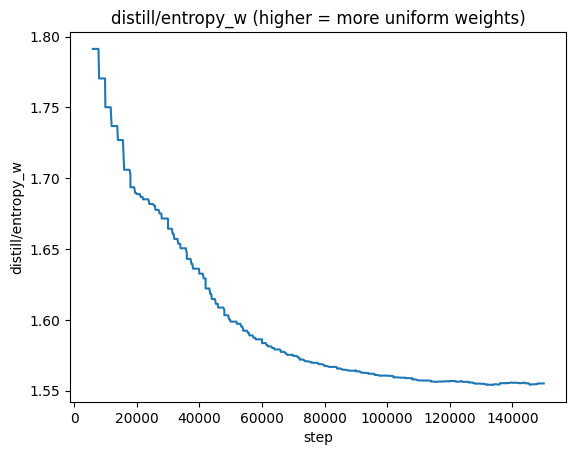

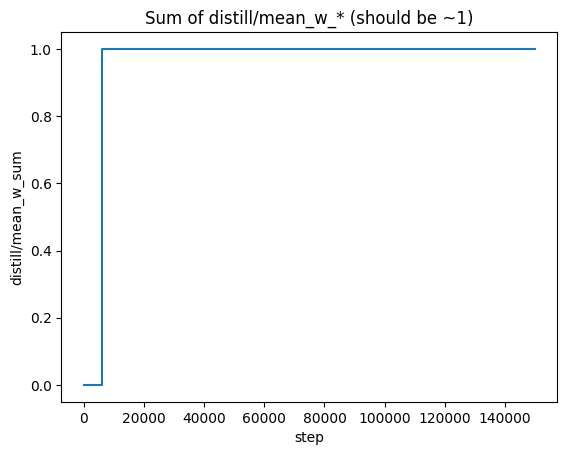

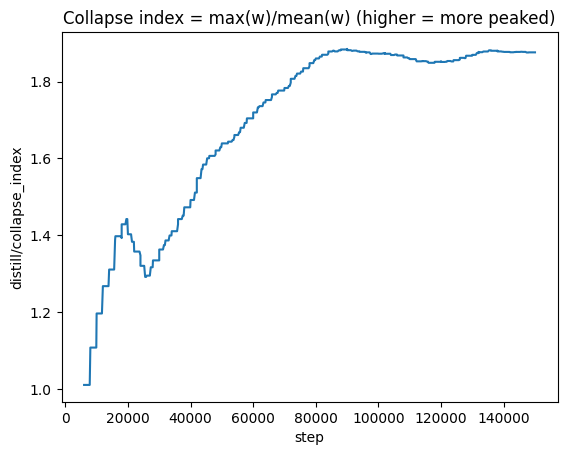

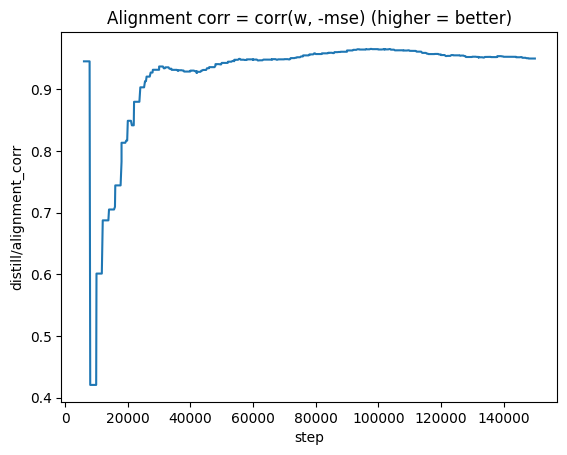

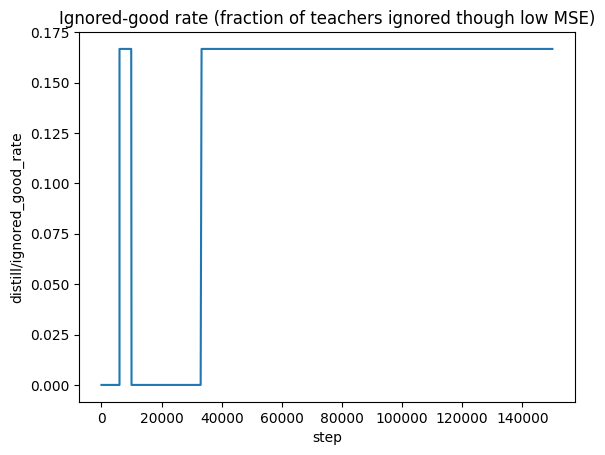

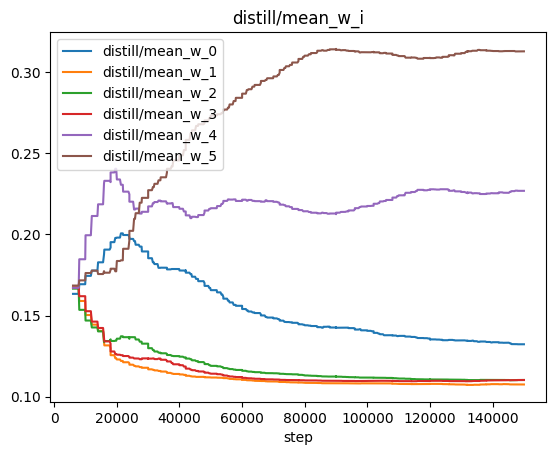

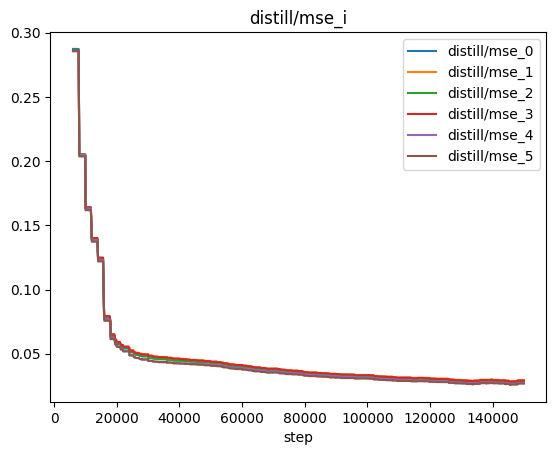

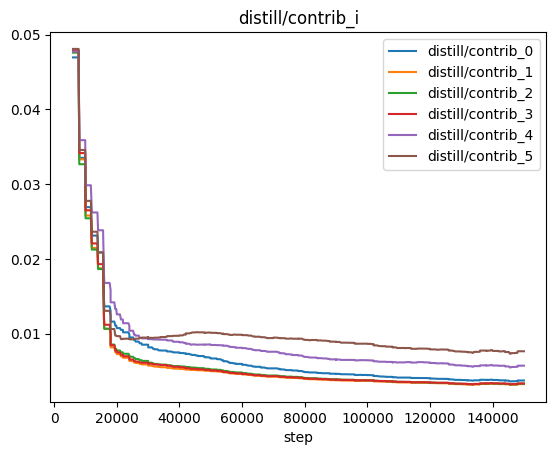

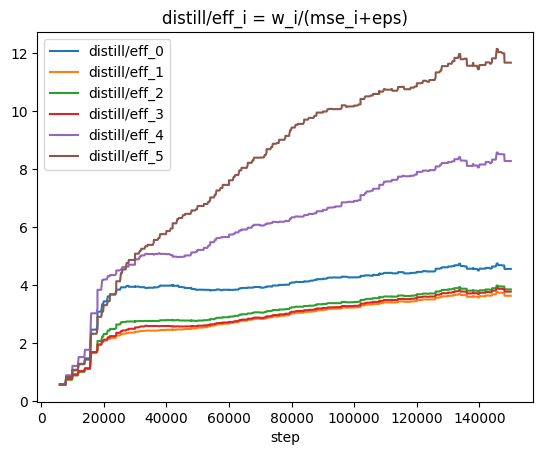

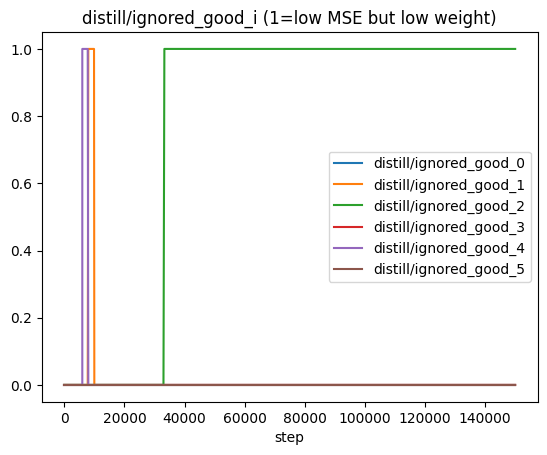

{'rows': 740,
 'step_min': 0.0,
 'step_max': 150000.0,
 'n_teachers_common_w_mse': 6,
 'last_raw': {'distill/mean_w_sum': 0.0, 'distill/ignored_good_rate': 0.0}}

In [9]:
df, df_s, summary = analyze_training_metrics(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_metrics_seed456/metrics.jsonl",
    plot=True,
    smooth=50,
)
summary

In [13]:
import os
import json
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Optional, List


def load_aggregated_distill_metrics(
    metrics_path: str,
    step_key: str = "step",
    smooth: int = 0,
    eps: float = 1e-12,
) -> pd.DataFrame:
    """
    Returns ONLY one-line (aggregated) distill metrics:
      - distill/entropy_w (if present)
      - distill/mean_w_sum (sanity check)
      - distill/collapse_index
      - distill/alignment_corr
      - distill/ignored_good_rate

    Uses distill/mean_w_{i} (NOT mean_w_raw_{i} or mean_w_clip_{i}).
    """
    rows = []
    with open(metrics_path, "r") as f:
        for line in f:
            line = line.strip()
            if line:
                rows.append(json.loads(line))
    if not rows:
        raise ValueError(f"No JSON lines found in {metrics_path}")
    df = pd.DataFrame(rows)

    # ---- helpers ----
    def _scalarize(x):
        if isinstance(x, (list, tuple, np.ndarray)):
            return x[0] if len(x) else np.nan
        return x

    def _indexed_cols(frame, prefix):
        # exact match: prefix + integer index, e.g. distill/mean_w_0
        pat = re.compile(r"^" + re.escape(prefix) + r"(\d+)$")
        cols = []
        for c in frame.columns:
            m = pat.match(c)
            if m:
                cols.append((int(m.group(1)), c))
        cols.sort(key=lambda x: x[0])
        return [c for _, c in cols]

    def _indices_map(cols, prefix):
        out = {}
        for c in cols:
            out[int(c.split(prefix)[1])] = c
        return out

    # ---- step ----
    if step_key not in df.columns:
        for alt in ("global_step", "train/step", "trainer/global_step", "iter", "iteration"):
            if alt in df.columns:
                df[step_key] = df[alt]
                break
        else:
            df[step_key] = np.arange(len(df), dtype=np.int64)

    df[step_key] = pd.to_numeric(df[step_key].map(_scalarize), errors="coerce")
    df = df.dropna(subset=[step_key]).sort_values(step_key).reset_index(drop=True)

    # ---- numeric distill cols ----
    distill_cols = [c for c in df.columns if c.startswith("distill/")]
    for c in distill_cols:
        df[c] = pd.to_numeric(df[c].map(_scalarize), errors="coerce")

    # ---- base columns (per-teacher, used ONLY to derive aggregated metrics) ----
    w_cols = _indexed_cols(df, "distill/mean_w_")
    mse_cols = _indexed_cols(df, "distill/mse_")

    w_map = _indices_map(w_cols, "distill/mean_w_") if w_cols else {}
    mse_map = _indices_map(mse_cols, "distill/mse_") if mse_cols else {}
    common_idx = sorted(set(w_map.keys()) & set(mse_map.keys()))

    def _compute_derived(frame):
        out = pd.DataFrame({step_key: frame[step_key].to_numpy()})

        if "distill/entropy_w" in frame.columns:
            out["distill/entropy_w"] = frame["distill/entropy_w"].to_numpy()

        if w_cols:
            w_mat = frame[w_cols].to_numpy()
            out["distill/mean_w_sum"] = np.nansum(w_mat, axis=1)
            out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)

        if common_idx:
            w_mat = np.vstack([frame[w_map[i]].to_numpy() for i in common_idx]).T
            mse_mat = np.vstack([frame[mse_map[i]].to_numpy() for i in common_idx]).T

            # alignment corr per step: corr(w, -mse) across teachers
            align = np.full(len(frame), np.nan, dtype=float)
            for t in range(len(frame)):
                wv = w_mat[t]
                mv = mse_mat[t]
                mask = np.isfinite(wv) & np.isfinite(mv)
                if mask.sum() >= 2:
                    a = wv[mask]
                    b = (-mv[mask])
                    if np.std(a) > 0 and np.std(b) > 0:
                        align[t] = np.corrcoef(a, b)[0, 1]
            out["distill/alignment_corr"] = align

            # ignored_good_rate: mse below median but weight below median
            mse_med = np.nanmedian(mse_mat, axis=1)
            w_med = np.nanmedian(w_mat, axis=1)
            ignored = (mse_mat < mse_med[:, None]) & (w_mat < w_med[:, None])
            out["distill/ignored_good_rate"] = np.nanmean(ignored.astype(float), axis=1)

        return out

    # ---- smooth base cols, then recompute derived (recommended) ----
    if smooth and smooth > 1:
        df_s = df.copy()
        num_cols = [c for c in df_s.columns if c != step_key]
        df_s[num_cols] = df_s[num_cols].rolling(smooth, min_periods=1).mean()
        df_out = _compute_derived(df_s)
    else:
        df_out = _compute_derived(df)

    # keep only the aggregated lines you care about (and step)
    keep = [step_key]
    for c in [
        "distill/entropy_w",
        "distill/collapse_index",
        "distill/alignment_corr",
        "distill/ignored_good_rate",
        "distill/mean_w_sum",  # optional sanity check
    ]:
        if c in df_out.columns:
            keep.append(c)
    return df_out[keep].copy()


def plot_compare_stacked(
    metrics_path_a: str,
    metrics_path_b: str,
    step_key: str = "step",
    smooth: int = 0,
    metrics: Optional[List[str]] = None,
    label_a: Optional[str] = None,
    label_b: Optional[str] = None,
    max_points: int = 20000,
):
    """
    Stacked subplots. Each subplot overlays 2 lines: run A vs run B.
    """
    if metrics is None:
        metrics = [
            "distill/entropy_w",
            "distill/collapse_index",
            "distill/alignment_corr",
            "distill/ignored_good_rate",
            # "distill/mean_w_sum",  # uncomment if you want the sanity check in the stack
        ]

    df_a = load_aggregated_distill_metrics(metrics_path_a, step_key=step_key, smooth=smooth)
    df_b = load_aggregated_distill_metrics(metrics_path_b, step_key=step_key, smooth=smooth)

    label_a = "moe"
    label_b = "original"

    # only keep metrics that exist in BOTH
    metrics_ok = [m for m in metrics if (m in df_a.columns and m in df_b.columns)]
    if not metrics_ok:
        raise ValueError("None of the requested metrics exist in BOTH files.")

    def _downsample(x, y, n=max_points):
        x = np.asarray(x).reshape(-1)
        y = np.asarray(y).reshape(-1)
        mask = np.isfinite(x) & np.isfinite(y)
        x, y = x[mask], y[mask]
        if len(x) <= n:
            return x, y
        idx = np.linspace(0, len(x) - 1, n).astype(int)
        return x[idx], y[idx]

    nrows = len(metrics_ok)
    fig, axes = plt.subplots(nrows=nrows, ncols=1, sharex=True, figsize=(10, 2.6 * nrows))
    if nrows == 1:
        axes = [axes]

    xa = df_a[step_key].to_numpy()
    xb = df_b[step_key].to_numpy()

    for ax, m in zip(axes, metrics_ok):
        ya = df_a[m].to_numpy()
        yb = df_b[m].to_numpy()

        xad, yad = _downsample(xa, ya)
        xbd, ybd = _downsample(xb, yb)

        ax.plot(xad, yad, label=label_a)
        ax.plot(xbd, ybd, label=label_b)
        ax.set_ylabel(m)
        ax.grid(True, alpha=0.25)
        ax.legend(loc="best", fontsize=9)

    axes[-1].set_xlabel(step_key)
    title = "Aggregated distill metrics (stacked)"
    if smooth and smooth > 1:
        title += " | smooth={}".format(smooth)
    fig.suptitle(title, y=0.995)
    fig.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()


# ---- Example ----
# plot_compare_stacked("runA/metrics.jsonl", "runB/metrics.jsonl", smooth=50)


/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfun

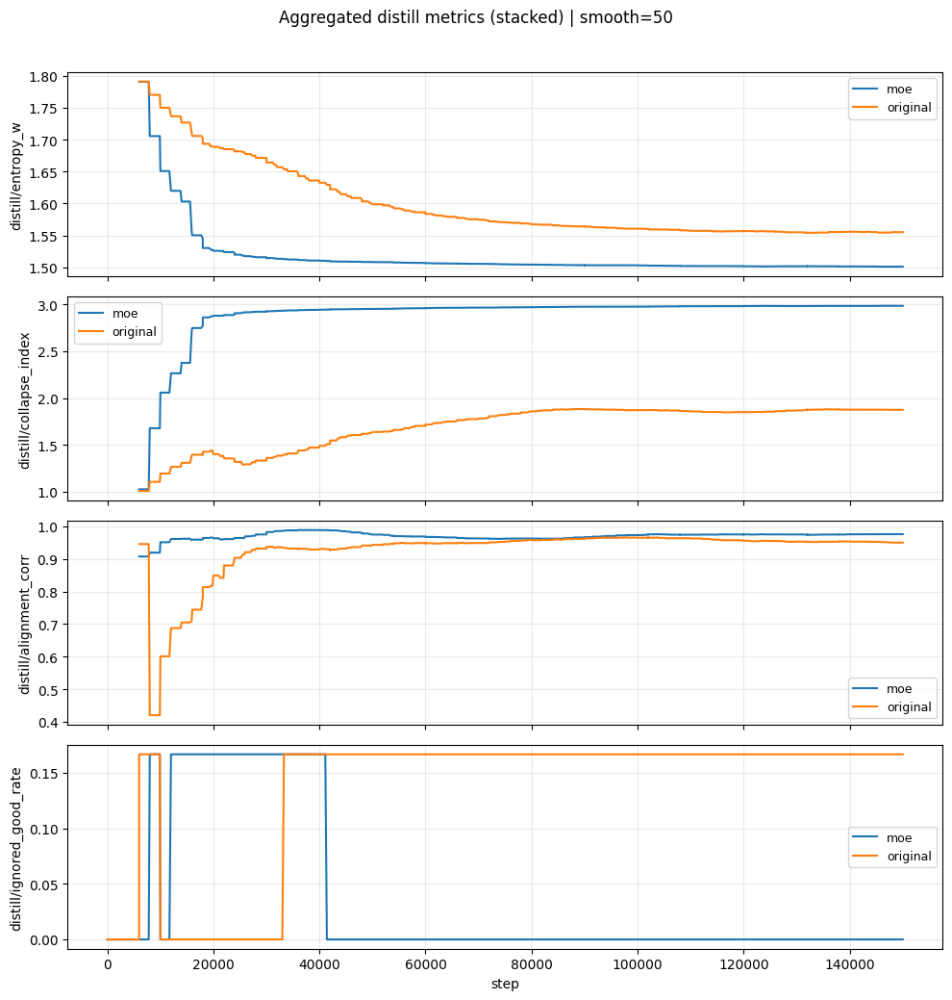

In [14]:
# ---- Example ----
plot_compare_stacked(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/moe_metrics_seed456/metrics.jsonl",
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/coffee_push/original_metrics_seed456/metrics.jsonl",
    smooth=50,
)

/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfun

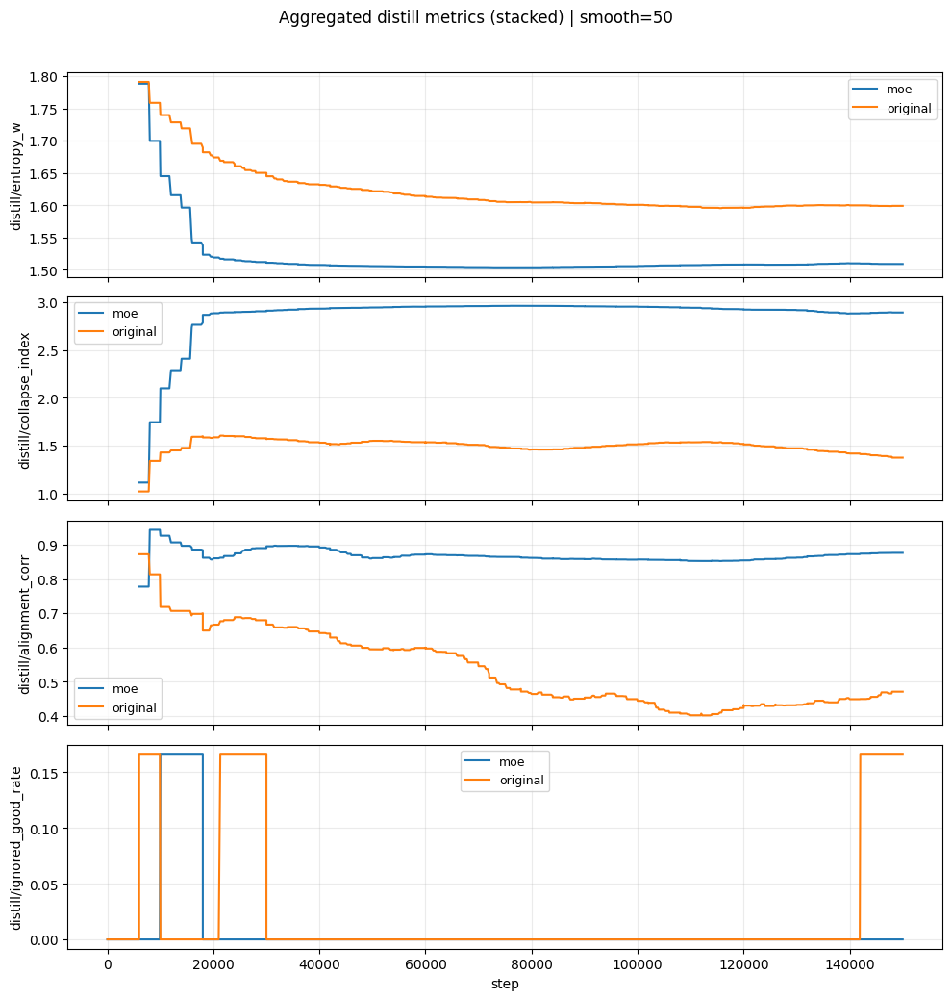

In [15]:
plot_compare_stacked(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/moe_metrics_seed456/metrics.jsonl",
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/button_press/original_metrics_seed456/metrics.jsonl",
    smooth=50,
)

/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfun

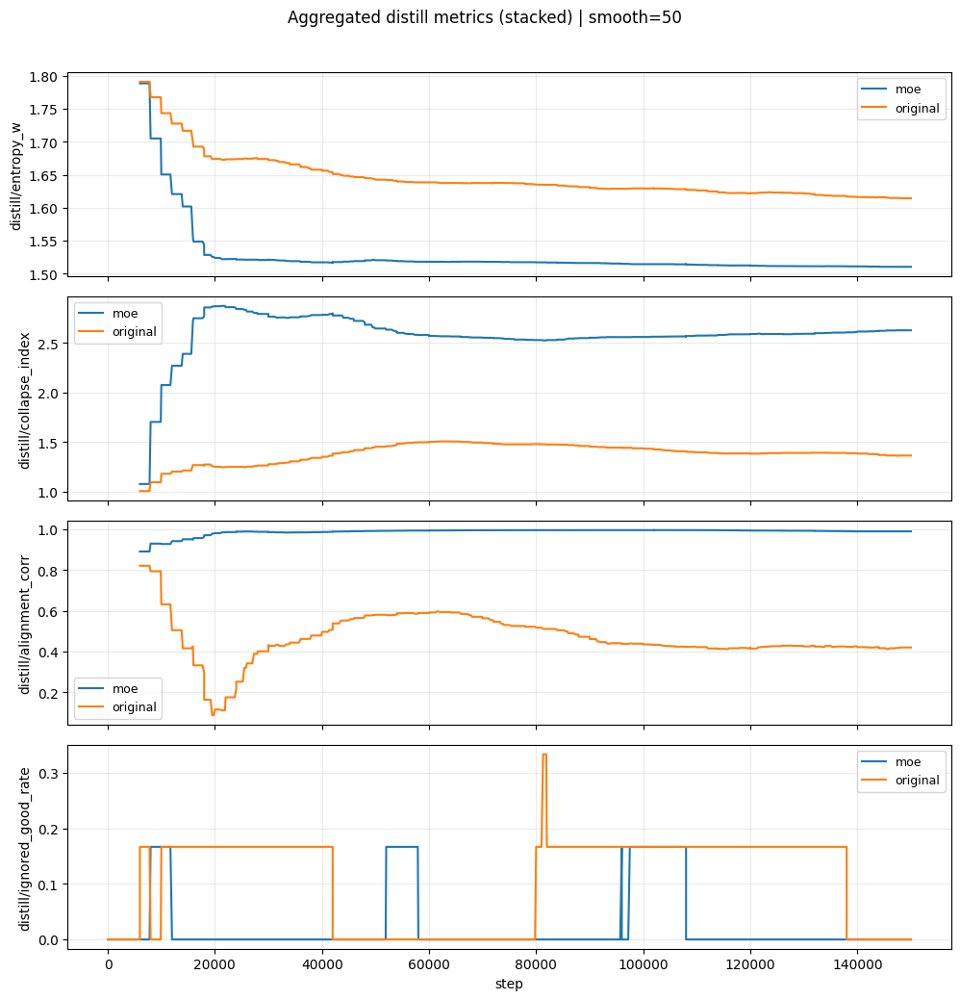

In [16]:
plot_compare_stacked(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/moe_metrics_seed456/metrics.jsonl",
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/window_open/original_metrics_seed456/metrics.jsonl",
    smooth=50,
)

/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1217: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: All-NaN slice encountered
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/tmp/ipykernel_2176750/2938095118.py:93: RuntimeWarning: Mean of empty slice
  out["distill/collapse_index"] = np.nanmax(w_mat, axis=1) / (np.nanmean(w_mat, axis=1) + eps)
/home/richtsai1103/miniconda3/envs/hrssm/lib/python3.9/site-packages/numpy/lib/nanfun

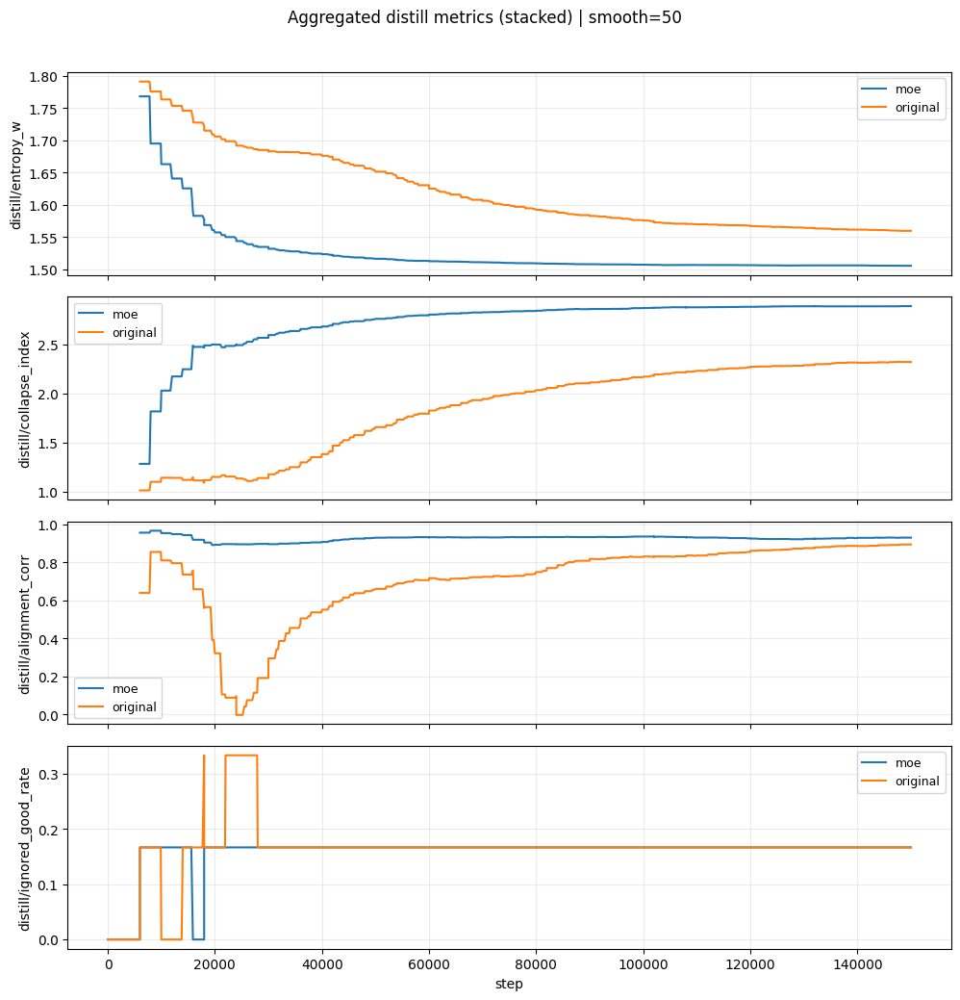

In [17]:
plot_compare_stacked(
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/moe_metrics_seed2024/metrics.jsonl",
    "/storage/ssd1/richtsai1103/vid2act/log/metaworld/mt6/10_top50/drawer_open/original_metrics_seed2024/metrics.jsonl",
    smooth=50,
)